<a href="https://colab.research.google.com/github/Leucocitokiller/Proyecto_Final_MLII/blob/main/Proyecto_ParteIII_Libenson.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

🔗 Google Colab

##  ***Prediciendo la Esperanza de Vida: Un Análisis Basado en Indicadores Globales***
### ***El Contexto Global: ¿Cómo se mide el bienestar de una población?***
### Desde hace décadas, los gobiernos y organizaciones internacionales buscan comprender qué factores influyen en la calidad de vida de las personas. Uno de los indicadores más representativos de desarrollo y bienestar es la esperanza de vida al nacer, una medida que refleja las condiciones de salud, nutrición y acceso a servicios esenciales en cada país.

### Pero, ¿qué determina cuántos años vive una persona en promedio en un país?

### 🌍 El Banco Mundial: Una Fuente Clave de Datos para el Desarrollo
### El Banco Mundial es una de las principales fuentes de datos socioeconómicos a nivel global. Su misión es reducir la pobreza y fomentar el desarrollo sostenible a través de financiamiento y análisis de políticas. Para lograrlo, recopila y publica cientos de indicadores que permiten evaluar el estado de salud, economía, educación y condiciones de vida de cada nación.

### Dentro de estos indicadores, algunos juegan un papel clave en la predicción de la esperanza de vida.

## 🔑 ***Indicadores Claves para Predecir la Esperanza de Vida***
### Para este estudio, hemos seleccionado una serie de variables que, según investigaciones previas, tienen un alto impacto en la longevidad de las personas:

### - Gasto en Salud (% del PIB) → Cuánto invierte un país en su sistema de salud.
### - Gasto en Salud per Cápita → La cantidad de dinero que se gasta en promedio por cada ciudadano.
### - Mortalidad Infantil → La tasa de fallecimientos antes del primer año de vida.
### - Tasa de Vacunación Infantil → Indicador clave de acceso a servicios médicos preventivos.
### - Acceso a Saneamiento Básico → Relacionado con enfermedades infecciosas y calidad de vida.
### - Crecimiento del PIB (%) y PIB per Cápita → Indicadores de desarrollo económico que influyen en el acceso a mejores condiciones de vida.
### - Tasa de Natalidad y Tasa de Mortalidad → Relacionadas con la estructura demográfica de cada país.

## 🧠 ***El Desafío: Construyendo un Modelo Predictivo***
### A través del uso de técnicas de Machine Learning, probaremos un modelo capaz de predecir la esperanza de vida de un país en función de estos indicadores. Utilizando datos históricos del Banco Mundial, entrenamos un algoritmo que identifica patrones y relaciones entre variables.

### El objetivo es que este modelo no solo prediga con precisión, sino que también sirva como herramienta para la toma de decisiones en políticas públicas, ayudando a los gobiernos a identificar qué factores deben mejorar para aumentar la longevidad de su población.

## 🚀 ***Conclusión: Más Allá de la Predicción, Un Enfoque para el Futuro***
### Este análisis no sólo busca predecir números, sino comprender qué acciones pueden tomarse para mejorar la esperanza de vida. La inversión en salud, la educación y el acceso a servicios básicos son claves para un futuro donde las personas vivan más y mejor.

## 💡 ***¿Qué pasaría si los países con menor esperanza de vida ajustaran sus políticas basadas en estos hallazgos?***

### Con herramientas de análisis de datos, podemos transformar números en soluciones concretas. Este es solo el inicio de un camino hacia un mundo más saludable y equitativo.

## 🧪 **Hipótesis**

### Para realizar la validación de los datos, se generaron las siguientes hipótesis:

### **- Hipótesis #1**
### Los pasies con mayor PBI per cápita tienen un menor mortalidada infaltil y una esperanza de vida mayor

### **- Hipótesis #2**
### Los países con mayor tasa de Natalidad y mayor tasa de mortalidad son los que tienen menor esperanza de vida.

### **- Hipótesis #3**
### Los paises con una alta tasa de vacunación infantil en la infancia impacta en una mayor esperanza de vida.

### **- Hipótesis #4**
### Los paises con un crecimiento mayor de su PBI (%) tienen una población con una esperanza de vida mayor.

### **- Hipótesis #5**
### Los paises con mayor gasto de su PBI en salud, tienen una población con  mayor esperanza de vida



## 🔌 *Conexión a los datos del Banco Mundial.*

### - Se genera una conexión a la API del Banco Mundial seleccionando los indicadores y paises que se van a utilizar en el desarrollo del modelo.




In [126]:
pip install pycountry

In [127]:
#Importación de Librerías.
import requests
import json
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import matplotlib.pyplot as plt
import pycountry
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
import numpy as np
from sklearn.preprocessing import OrdinalEncoder


In [ ]:
indicadores = [
    "SP.DYN.LE00.IN",  # Esperanza de vida al nacer
    "SH.XPD.CHEX.GD.ZS",  # Gasto en salud (% del PIB)
    "SH.XPD.CHEX.PC.CD",  # Gasto en salud per cápita
    "SH.DYN.MORT",  # Mortalidad infantil
    "SH.STA.BRTC.ZS",  # Nacimientos atendidos por personal de salud (%)
    "SH.MED.PHYS.ZS",  # Médicos por cada 1,000 habitantes
    "NY.GDP.MKTP.KD.ZG",  # Crecimiento del PIB (%)
    "NY.GDP.PCAP.CD",  # PIB per cápita
    "SI.POV.DDAY",  # % de la población bajo la línea de pobreza ($2.15/día)
    "SE.ADT.LITR.ZS",  # Tasa de alfabetización
    "SL.UEM.TOTL.ZS",  # Desempleo total (%)
    "SL.UEM.TOTL.NE.ZS", #Unemployment refers to the share of the labor force that is without work but available for and seeking employment. Definitions of labor force and unemployment differ by country.
    "SH.STA.BASS.ZS", #People using at least basic sanitation services (% of population)
    "SI.POV.NAHC", #National poverty headcount ratio is the percentage of the population living below the national poverty line(s).
    "SN.ITK.SVFI.ZS", #The percentage of people in the population who live in households classified as severely food insecure. A household is classified as severely food insecure when at least one adult in the household has reported to have been exposed, at times during the year, to several of the most severe experiences described in the FIES questions, such as to have been forced to reduce the quantity of the food, to have skipped meals, having gone hungry, or having to go for a whole day without eating because of a lack of money or other resources.
    "PNUD.IDH.XD", #Indice de desarrollo humando
    "SH.STA.SANI.ZS", #Acceso a saneamiento:"
    "SH.HIV.TOTL.ZS", #VIH
    "SH.IMM.MEAS", #Tasa de vacunación infantil (Sarampión):
    "SP.DYN.CBRT.IN",#Tasa de natalidad:
    "SP.DYN.CDRT.IN"#Tasa de mortalidad:
]
paises =  [ "ARG", "BRA", "MEX", "ESP", "DEU", "USA", "CHN", "IND", "COL", "PER", "CHL", "VEN", "FRA", "ITA",
    "GBR", "CAN", "JPN", "AUS", "RUS", "ZAF", "EGY", "IDN", "TUR", "KOR", "SAU", "THA", "UKR", "PAK",
    "IRN", "PHL", "VNM", "NGA", "POL", "NLD", "SWE", "BEL", "CHE", "AUT", "ISR", "NOR", "FIN", "DNK",
    "SGP", "MYS", "NZL", "HKG", "GRC", "HUN", "ROU", "CZE", "PRT", "IRL", "BGR", "SVK",
    "AFG", "ALB", "DZA", "ASM", "AND", "AGO", "ATG", "AZE", "BHS", "BHR", "BGD", "BRB",
    "BLR", "BLZ", "BEN", "BMU", "BTN", "BOL", "BIH", "BWA", "BRN", "BFA", "BDI", "CPV", "KHM",
    "CMR", "CAF", "CYM", "COD", "COG", "COM", "CRI", "CIV", "HRV", "CUB", "CUW", "CYP", "DJI", "DMA",
    "DOM", "ECU", "SLV", "ERI", "EST", "SWZ", "ETH", "FRO", "FJI", "GAB", "GMB", "GEO", "GHA",
    "GIB", "GNB", "GRD", "GTM", "GIN", "GUY", "HTI", "HND", "ISL", "JAM", "JOR", "KEN", "KIR", "KWT",
    "KGZ", "LAO", "LVA", "LBN", "LSO", "LBR", "LBY", "LIE", "LTU", "LUX", "MDV", "MLI", "MLT", "MHL",
    "MRT", "MUS", "FSM", "MDA", "MCO", "MNG", "MNE", "MAR", "MOZ", "MMR", "NAM", "NRU", "NPL", "NIC",
    "NER", "MKD", "MNP", "OMN", "PAN", "PNG", "PRY", "QAT", "SRB", "RWA", "LCA",
    "VCT", "WSM", "SMR", "STP", "SEN", "SYC", "SLE", "SLV", "SOM", "SSD", "LKA", "SDN", "SUR", "SYR",
    "TJK", "TZA", "TLS", "TGO", "TON", "TTO", "TUN", "TKM", "TCA", "TUV", "UGA", "URY", "UZB", "VUT",
    "VIR", "YEM", "ZMB", "ZWE" ] # Lista de países

datos_todos_indicadores = []  # Lista para almacenar los datos de todos los indicadores

for indicador in indicadores:
    for pais in paises:  # Itera sobre la lista de países
        url = f"https://api.worldbank.org/v2/country/{pais}/indicator/{indicador}?format=json&date=2000:2025"
        try:
            response = requests.get(url)
            response.raise_for_status()  # Lanza una excepción para códigos de error HTTP
            datos = response.json()

            # Extrae los datos relevantes del JSON y guárdalos en un diccionario
            if datos and len(datos) > 1:  # Verifica si hay datos
                datos_indicador = datos[1]  # Los datos están en el segundo elemento de la lista
                for item in datos_indicador:
                  if item.get('value') is not None: # Verifica que el valor no sea nulo
                    datos_todos_indicadores.append({
                        'pais': pais,
                        'indicador': indicador,
                        'anio': item['date'],
                        'valor': item['value']
                    })
            else:
                print(f"No se encontraron datos para el indicador {indicador} en el país {pais}.")

        except requests.exceptions.RequestException as e:
            print(f"Error al consultar la API para el indicador {indicador} en el país {pais}: {e}")
        except (json.JSONDecodeError, IndexError) as e:
            print(f"Error al procesar el JSON para el indicador {indicador} en el país {pais}: {e}")
            if hasattr(response, 'text'): # Verifica si la respuesta tiene un atributo 'text'
              print(f"Texto de la respuesta: {response.text}") # Imprime el texto de la respuesta para depuración
        except Exception as e:
            print(f"Error inesperado al procesar el indicador {indicador} en el país {pais}: {e}")

# Crea un DataFrame con todos los datos
df_todos_indicadores = pd.DataFrame(datos_todos_indicadores)

# Imprime el DataFrame o guárdalo en un archivo CSV
print(df_todos_indicadores)
#df_todos_indicadores.to_csv("datos_indicadores_paises.csv", index=False)  # Guarda el DataFrame a un archivo CSV

In [ ]:
esperanza_vida_wb.csvesperanza_vida_wb.csv

In [ ]:
df_todos_indicadores.to_csv("https://github.com/Leucocitokiller/Proyecto_Final_MLII/blob/main/esperanza_vida_wb.csv", index=False)

# *EDA*

## **Data wrangling**

### Acciones sobre el dataframe descargado del Banco Mundial:
### - Pivotear la tabla: Se colocan los indicadores como columnas, junto a Pais y Año.
### - Renombrar columnas: Se cambian los codigos de los indicadores por una descripción para mayor entendimiento.

In [128]:
# Instead of using the URL for the Github 'blob' view,
# you should use the URL for the 'raw' data.
indicadores = pd.read_csv('https://raw.githubusercontent.com/Leucocitokiller/Proyecto_Final_MLII/main/esperanza_vida_wb.csv', low_memory=False, sep=',', encoding='iso-8859-1')

indicadores

,pais,indicador,anio,valor
0,ARG,SP.DYN.LE00.IN,2022,76.064
1,ARG,SP.DYN.LE00.IN,2021,75.390
2,ARG,SP.DYN.LE00.IN,2020,75.892
3,ARG,SP.DYN.LE00.IN,2019,77.284
4,ARG,SP.DYN.LE00.IN,2018,76.999
...,...,...,...,...
58034,ZWE,SP.DYN.CDRT.IN,2004,16.989
58035,ZWE,SP.DYN.CDRT.IN,2003,17.805
58036,ZWE,SP.DYN.CDRT.IN,2002,16.953
58037,ZWE,SP.DYN.CDRT.IN,2001,19.048


In [129]:
# Define las columnas para pivotar
index_cols = ['pais', 'anio']
columns_col = 'indicador'
values_col = 'valor'

# Pivotea la tabla
df_pivot = indicadores.pivot_table(index=index_cols, columns=columns_col, values=values_col)


# Restablece el índice para que 'pais' y 'año' sean columnas
df_pivot = df_pivot.reset_index()

# Renombro el código de cada indicador para darle una mejor lectura a los mismos.
nombres_indicadores = {
    "pais": "Pais",
    "anio": "Año",
    "SP.DYN.LE00.IN": "Esperanza de vida al nacer",
    "SH.XPD.CHEX.GD.ZS": "Gasto en salud (% del PIB)",
    "SH.XPD.CHEX.PC.CD": "Gasto en salud per cápita",
    "SH.DYN.MORT": "Mortalidad infantil",
    "SH.STA.BRTC.ZS": "Nacimientos atendidos por personal de salud (%)",
    "SH.MED.PHYS.ZS": "Médicos por cada 1,000 habitantes",
    "NY.GDP.MKTP.KD.ZG": "Crecimiento del PIB (%)",
    "NY.GDP.PCAP.CD": "PIB per cápita",
    "SI.POV.DDAY": "% de la población bajo la línea de pobreza ($2.15/día)",
    "SE.ADT.LITR.ZS": "Tasa de alfabetización",
    "SL.UEM.TOTL.ZS": "Desempleo total (%)",
    "SL.UEM.TOTL.NE.ZS": "Desempleados Buscando (%)",
    "SH.STA.BASS.ZS" : "(%) de Pobalacion con Baño",
    "SI.POV.NAHC" : "Ratio de Poblacion por Debajo del NP",
    "SN.ITK.SVFI.ZS": "(%) de Poblacion que No Tiene todas las comidas",
    "SP.DYN.CBRT.IN":"Tasa de natalidad",
    "SP.DYN.CDRT.IN": "Tasa de mortalidad",
    "SH.IMM.MEAS": "Tasa de vacunación infantil (Sarampión)"
}
df_pivot = df_pivot.rename(columns=nombres_indicadores).round()

df_pivot

indicador,Pais,Año,Crecimiento del PIB (%),PIB per cápita,Tasa de alfabetización,Mortalidad infantil,Tasa de vacunación infantil (Sarampión),"Médicos por cada 1,000 habitantes",(%) de Pobalacion con Baño,Nacimientos atendidos por personal de salud (%),Gasto en salud (% del PIB),Gasto en salud per cápita,% de la población bajo la línea de pobreza ($2.15/día),Ratio de Poblacion por Debajo del NP,Desempleados Buscando (%),Desempleo total (%),(%) de Poblacion que No Tiene todas las comidas,Tasa de natalidad,Tasa de mortalidad,Esperanza de vida al nacer
0,AFG,2000,NaN,175.0,NaN,132.0,27.0,NaN,21.0,12.0,NaN,NaN,NaN,NaN,NaN,8.0,NaN,50.0,12.0,55.0
1,AFG,2001,-9.0,139.0,NaN,127.0,37.0,0.0,21.0,NaN,NaN,NaN,NaN,NaN,NaN,8.0,NaN,49.0,12.0,56.0
2,AFG,2002,29.0,179.0,NaN,123.0,35.0,NaN,23.0,NaN,9.0,17.0,NaN,NaN,NaN,8.0,NaN,48.0,11.0,56.0
3,AFG,2003,9.0,199.0,NaN,118.0,39.0,NaN,24.0,14.0,9.0,18.0,NaN,NaN,NaN,8.0,NaN,47.0,11.0,57.0
4,AFG,2004,1.0,222.0,NaN,114.0,48.0,NaN,26.0,NaN,10.0,21.0,NaN,NaN,NaN,8.0,NaN,46.0,10.0,58.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4551,ZWE,2019,-6.0,1684.0,93.0,52.0,85.0,NaN,36.0,86.0,3.0,55.0,40.0,38.0,7.0,7.0,32.0,32.0,8.0,61.0
4552,ZWE,2020,-8.0,1730.0,NaN,51.0,85.0,0.0,35.0,NaN,3.0,51.0,NaN,NaN,NaN,9.0,31.0,31.0,8.0,61.0
4553,ZWE,2021,8.0,1724.0,NaN,49.0,88.0,NaN,35.0,NaN,3.0,63.0,NaN,NaN,10.0,10.0,29.0,31.0,9.0,59.0
4554,ZWE,2022,6.0,2041.0,90.0,48.0,90.0,0.0,35.0,NaN,NaN,NaN,NaN,NaN,10.0,10.0,26.0,30.0,9.0,59.0


In [130]:
# Función para convertir código ISO Alpha-3 en nombre completo
def convertir_iso_a_nombre(codigo_iso):
    try:
        return pycountry.countries.get(alpha_3=codigo_iso).name
    except AttributeError:
        return codigo_iso  # Si no encuentra el país, deja el código original

# Aplicar la conversión en la columna 'Pais'
df_pivot['Pais'] = df_pivot['Pais'].apply(convertir_iso_a_nombre)

# Verificar los cambios
df_pivot.head()


indicador,Pais,Año,Crecimiento del PIB (%),PIB per cápita,Tasa de alfabetización,Mortalidad infantil,Tasa de vacunación infantil (Sarampión),"Médicos por cada 1,000 habitantes",(%) de Pobalacion con Baño,Nacimientos atendidos por personal de salud (%),Gasto en salud (% del PIB),Gasto en salud per cápita,% de la población bajo la línea de pobreza ($2.15/día),Ratio de Poblacion por Debajo del NP,Desempleados Buscando (%),Desempleo total (%),(%) de Poblacion que No Tiene todas las comidas,Tasa de natalidad,Tasa de mortalidad,Esperanza de vida al nacer
0,Afghanistan,2000,NaN,175.0,NaN,132.0,27.0,NaN,21.0,12.0,NaN,NaN,NaN,NaN,NaN,8.0,NaN,50.0,12.0,55.0
1,Afghanistan,2001,-9.0,139.0,NaN,127.0,37.0,0.0,21.0,NaN,NaN,NaN,NaN,NaN,NaN,8.0,NaN,49.0,12.0,56.0
2,Afghanistan,2002,29.0,179.0,NaN,123.0,35.0,NaN,23.0,NaN,9.0,17.0,NaN,NaN,NaN,8.0,NaN,48.0,11.0,56.0
3,Afghanistan,2003,9.0,199.0,NaN,118.0,39.0,NaN,24.0,14.0,9.0,18.0,NaN,NaN,NaN,8.0,NaN,47.0,11.0,57.0
4,Afghanistan,2004,1.0,222.0,NaN,114.0,48.0,NaN,26.0,NaN,10.0,21.0,NaN,NaN,NaN,8.0,NaN,46.0,10.0,58.0


In [131]:
#df_pivot.describe().round(2)
df_pivot.describe().loc[['min', '25%', '50%','75%','mean', 'max', 'std']].T.style.format("{:.1f}").background_gradient(axis=1)

,min,25%,50%,75%,mean,max,std
indicador,,,,,,,
Año,2000.0,2005.0,2011.0,2017.0,2011.5,2023.0,6.9
Crecimiento del PIB (%),-50.0,1.0,4.0,6.0,3.4,87.0,5.5
PIB per cápita,110.0,1460.0,4877.5,18320.5,15310.9,256581.0,25086.3
Tasa de alfabetización,14.0,71.0,91.0,96.0,81.8,100.0,19.4
Mortalidad infantil,2.0,8.0,20.0,53.0,37.0,228.0,39.8
Tasa de vacunación infantil (Sarampión),8.0,80.0,92.0,97.0,86.0,99.0,14.6
"Médicos por cada 1,000 habitantes",0.0,1.0,2.0,3.0,2.0,9.0,1.6
(%) de Pobalacion con Baño,3.0,51.0,86.0,98.0,73.4,100.0,29.0
Nacimientos atendidos por personal de salud (%),6.0,92.0,99.0,100.0,90.0,100.0,18.9


### 🔹 1. El Crecimiento del PBI (%) tiene dos valores extremos, -50% y 87%. Se debe analizar de donde provienen o si es un error de carga de datos.  
### 🔹 2. EL PBI per Cápita tiene un valor máximo de USD 256.581. Se debe analizar de donde proviene o si es un error de carga de datos.
### 🔹 3. Los datos obtenidos de la matriz Describe, muestran que algunos indicadores tienen una baja cantidad de registros (gran cantidad de NaN).

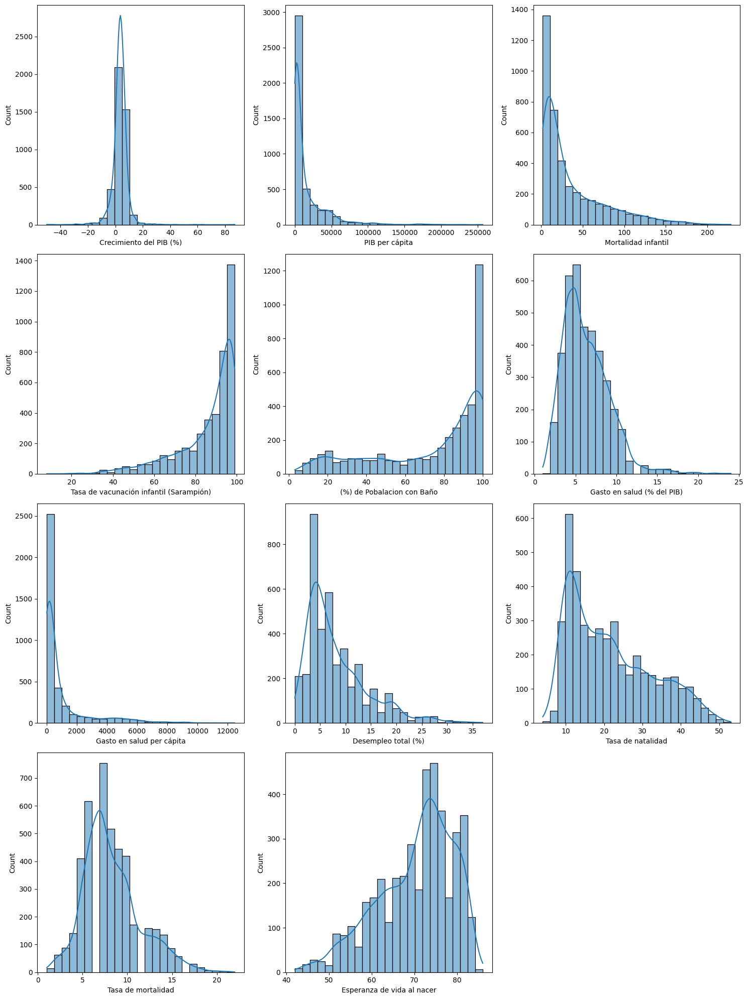

In [132]:
##Importo las librerias seaborn y mathplotlib para trabajar con los histogramas. Importo "Warnings" para eliminar advertencias de futuras actualizaciones.
import seaborn as sns
import matplotlib.pyplot as plt
import math
import warnings

# Elimino la advertencias de tipo FutureWarning
warnings.simplefilter(action='ignore', category=FutureWarning)

variables = ['Crecimiento del PIB (%)', 'PIB per cápita', 'Mortalidad infantil', 'Tasa de vacunación infantil (Sarampión)','(%) de Pobalacion con Baño',
             'Gasto en salud (% del PIB)', 'Gasto en salud per cápita','Desempleo total (%)','Tasa de natalidad','Tasa de mortalidad','Esperanza de vida al nacer']

num_vars = len(variables)
rows = math.ceil(num_vars / 3)  # Calcula filas necesarias
cols = min(3, num_vars)  # Máximo 3 columnas

plt.figure(figsize=(15, 5 * rows))
for i, var in enumerate(variables, 1):
    plt.subplot(rows, cols, i)
    sns.histplot(df_pivot[var], kde=True, bins=25)

plt.tight_layout()
plt.show()

## **Analizando el Dataset generado.**

## 📊 **Análisis de Asimetría en los Indicadores**

### 🔹 **1. Crecimiento del PIB (%)**
### 📈 Distribución: Posiblemente sesgada a la derecha (asimetría positiva).
### 📊 Explicación: La mayoría de los países tienen un crecimiento moderado (1-5%), pero algunos experimentan crisis (valores negativos) o crecimientos excepcionales (+10%).

### 🔹 **2. PIB per cápita**
### 📈 Distribución: Fuertemente sesgada a la derecha.
### 📊 Explicación: La mayoría de los países tienen un PIB per cápita bajo o medio, pero un pequeño número (países desarrollados) tienen valores extremadamente altos, creando una cola larga.

### 🔹**3. Mortalidad infantil**
### 📉 Distribución: Sesgada a la izquierda (asimetría negativa).
### 📊 Explicación: La mayoría de los países tienen tasas de mortalidad infantil bajas (<10 por cada 1,000 nacidos vivos), pero algunos países en desarrollo presentan valores muy altos.

### 🔹 **4. Tasa de vacunación infantil (Sarampión)**
### 📈 Distribución: Leve asimetría negativa.
### 📊 Explicación: La mayoría de los países tienen altas tasas de vacunación (>80%), con pocos países con tasas bajas. Esto genera una concentración en valores altos con una cola hacia la izquierda.

### 🔹**5. (%) de Población con Baño**
### 📉 Distribución: Sesgada a la izquierda.
### 📊 Explicación: La mayoría de los países tienen un alto porcentaje de población con acceso a saneamiento (>90%), pero algunos países tienen valores mucho más bajos.

### 🔹 **6. Gasto en salud (% del PIB)**
### 📈 Distribución: Ligeramente sesgada a la derecha.
### 📊 Explicación: Algunos países desarrollados invierten más del 10% del PIB en salud, mientras que en países en desarrollo la inversión es mucho menor (<5%).

### 🔹 **7. Gasto en salud per cápita**
### 📈 Distribución: Fuertemente sesgada a la derecha.
### 📊 Explicación: En países de bajos ingresos el gasto en salud es muy bajo, mientras que en economías avanzadas es muy alto (>$10,000 per cápita).

### 🔹 **8. Desempleo total (%)**
### 📉 Distribución: Moderadamente sesgada a la derecha.
### 📊 Explicación: La mayoría de los países tienen tasas de desempleo entre 3-10%, pero algunas economías en crisis presentan valores extremos (>20%).

### 🔹 **9. Tasa de natalidad**
### 📉 Distribución: Sesgada a la izquierda.
### 📊 Explicación: La mayoría de los países tienen tasas de natalidad moderadas (10-20 nacimientos por cada 1,000 habitantes), pero algunos tienen tasas muy altas (>40).

### 🔹 **10. Tasa de mortalidad**
### 📈 Distribución: Ligeramente sesgada a la derecha.
### 📊 Explicación: En la mayoría de los países la mortalidad es baja, pero en poblaciones envejecidas o en crisis sanitarias puede aumentar significativamente.

### 🔹 **11. Esperanza de vida al nacer**
### 📉 Distribución: Sesgada a la izquierda.
### 📊 Explicación: La mayoría de los países tienen una esperanza de vida alta (>70 años), con pocos países con valores muy bajos (<60 años).





## *Preprocesamiento de datos*

### **Manejo de valores NaN.**

### **1. Eliminación de Indicadores con menos de 3000 registros.**
### Se considera que los indicadores con menos de 3000 registros no pueden ser utilizados en el modelo debida a los errores que se pueden ocasionar al querer completar sus valores nulos.



In [133]:

# Definir umbral de datos mínimos aceptables
umbral_min_datos = 3000  # Mínimo de registros para considerar la variable

# Contar la cantidad de valores no nulos por columna
conteo_datos = df_pivot.count()

# Crear DataFrame de análisis
tabla_indicadores = pd.DataFrame({
    "Indicador": conteo_datos.index,
    "Registros": conteo_datos.values,
    "Usar en EDA": ["✅" if x > umbral_min_datos else "🗑️" for x in conteo_datos.values],
    "Usar en ML": ["✅" if x > umbral_min_datos else "🗑️" for x in conteo_datos.values]
})

# Ajustar la columna de "Objetivo" si es Esperanza de Vida
tabla_indicadores.loc[tabla_indicadores["Indicador"] == "Esperanza de vida al nacer", "Usar en ML"] = "🚀 Objetivo"

# Mostrar la tabla
tabla_indicadores


,Indicador,Registros,Usar en EDA,Usar en ML
0,Pais,4556,✅,✅
1,Año,4556,✅,✅
2,Crecimiento del PIB (%),4418,✅,✅
3,PIB per cápita,4474,✅,✅
4,Tasa de alfabetización,788,🗑️,🗑️
5,Mortalidad infantil,4140,✅,✅
6,Tasa de vacunación infantil (Sarampión),4277,✅,✅
7,"Médicos por cada 1,000 habitantes",2470,🗑️,🗑️
8,(%) de Pobalacion con Baño,4250,✅,✅
9,Nacimientos atendidos por personal de salud (%),2104,🗑️,🗑️


In [134]:
#Selección de indicadores a eliminar.

columnas_a_eliminar = [
    "Tasa de alfabetización",
    "Médicos por cada 1,000 habitantes",
    "Nacimientos atendidos por personal de salud (%)",
    "% de la población bajo la línea de pobreza ($2.15/día)",
    "Ratio de Poblacion por Debajo del NP",
    "Desempleados Buscando (%)",
    "(%) de Poblacion que No Tiene todas las comidas"
]

# Elimino las columnas del DataFrame
df_pivot = df_pivot.drop(columns=columnas_a_eliminar)

df_pivot

indicador,Pais,Año,Crecimiento del PIB (%),PIB per cápita,Mortalidad infantil,Tasa de vacunación infantil (Sarampión),(%) de Pobalacion con Baño,Gasto en salud (% del PIB),Gasto en salud per cápita,Desempleo total (%),Tasa de natalidad,Tasa de mortalidad,Esperanza de vida al nacer
0,Afghanistan,2000,NaN,175.0,132.0,27.0,21.0,NaN,NaN,8.0,50.0,12.0,55.0
1,Afghanistan,2001,-9.0,139.0,127.0,37.0,21.0,NaN,NaN,8.0,49.0,12.0,56.0
2,Afghanistan,2002,29.0,179.0,123.0,35.0,23.0,9.0,17.0,8.0,48.0,11.0,56.0
3,Afghanistan,2003,9.0,199.0,118.0,39.0,24.0,9.0,18.0,8.0,47.0,11.0,57.0
4,Afghanistan,2004,1.0,222.0,114.0,48.0,26.0,10.0,21.0,8.0,46.0,10.0,58.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4551,Zimbabwe,2019,-6.0,1684.0,52.0,85.0,36.0,3.0,55.0,7.0,32.0,8.0,61.0
4552,Zimbabwe,2020,-8.0,1730.0,51.0,85.0,35.0,3.0,51.0,9.0,31.0,8.0,61.0
4553,Zimbabwe,2021,8.0,1724.0,49.0,88.0,35.0,3.0,63.0,10.0,31.0,9.0,59.0
4554,Zimbabwe,2022,6.0,2041.0,48.0,90.0,35.0,NaN,NaN,10.0,30.0,9.0,59.0


### **2. Completar los valores NaN del dataset.**

### Existen dos situaciones que se precentan en el dataset.

### 1- Paises con indicadores que tienen algunos datos faltantes.
### 2- Paises con Indicadores que tienen ausencia total de datos.

### Se decide trabajar el proceso de rellenedo en dos partes.

### **Paso 1: Rellenar NaN con la Mediana del País**
### Se agrupa por país.
### Lo indiciadores presentan una distribución asimétrica de los datos (salvo Crecimiento PBI) por lo que se selecciona la Mediana para reducir errores.
### Para cada indicador, si al menos hay un valor disponible en ese país, se rellenan los NaN con la mediana del mismo país.
### Esto evita que KNN rellene valores que podrían completarse con datos internos del país.

### **Paso 2: Aplicar KNN para Países con Indicadores Completamente Vacíos**
### Si un país tiene un indicador con todos los valores en NaN, la mediana no lo puede completar.
### Se usa KNNImputer para estimar los valores comparándolo con países similares.
### KNN busca los países más parecidos y rellena los valores faltantes en función de ellos

In [135]:
#Analizo la cantidad de NaN que exitesn en el dataframe.
df_pivot.isnull().sum()

,0
indicador,
Pais,0
Año,0
Crecimiento del PIB (%),138
PIB per cápita,82
Mortalidad infantil,416
Tasa de vacunación infantil (Sarampión),279
(%) de Pobalacion con Baño,306
Gasto en salud (% del PIB),708
Gasto en salud per cápita,709


### Paso 1: Rellenar NaN con la Mediana del País

In [136]:
# Copia del DataFrame
df_median = df_pivot.copy()

# Rellenar NaN con la mediana por país, pero solo si la columna tiene al menos un valor válido
for columna in df_pivot.columns[2:]:  # Ignorar "País" y "Año"
    if df_pivot[columna].isna().any():  # Solo aplicar si hay NaN
        medianas = df_pivot.groupby("Pais")[columna].transform("median")
        df_median[columna] = df_pivot[columna].fillna(medianas)

In [137]:
df_median.isnull().sum()

,0
indicador,
Pais,0
Año,0
Crecimiento del PIB (%),23
PIB per cápita,23
Mortalidad infantil,236
Tasa de vacunación infantil (Sarampión),260
(%) de Pobalacion con Baño,0
Gasto en salud (% del PIB),284
Gasto en salud per cápita,284


### **Paso 2: Aplicar KNN para Países con Indicadores Completamente Vacíos**

### Analizo que paises tienen indicadores con todos sus valores Nan.
### A primera instancia se ven paises muy ricos, correspondientes a Islas parisos fiscales, Principados y protectorados (como Mónaco, Andorra, San Marino, Seycheles,etc); y paises muy pobres como Somalia.

### Los paises muy ricos deben ser evaluados para que no impacten en las metricas a la hora de probar los modelos de ML, ya que tienen indicadores economicos fuera de lo normal.



In [138]:
import warnings
# Elimino la advertencias de tipo FutureWarning
warnings.simplefilter(action='ignore', category=FutureWarning)
# Contar cuántos valores NaN tiene cada país por columna
nan_por_pais = df_median.groupby("Pais").apply(lambda x: x.isna().sum(), include_groups=False)

# Filtrar solo los países que tienen al menos un NaN en algún indicador
nan_por_pais = nan_por_pais[nan_por_pais.sum(axis=1) > 0]

# Mostrar la tabla con la cantidad de NaN por indicador en cada país
nan_por_pais


indicador,Año,Crecimiento del PIB (%),PIB per cápita,Mortalidad infantil,Tasa de vacunación infantil (Sarampión),(%) de Pobalacion con Baño,Gasto en salud (% del PIB),Gasto en salud per cápita,Desempleo total (%),Tasa de natalidad,Tasa de mortalidad,Esperanza de vida al nacer
Pais,,,,,,,,,,,,
American Samoa,0,0,0,23,23,0,23,23,23,0,0,23
Andorra,0,0,0,0,0,0,0,0,24,0,0,24
Antigua and Barbuda,0,0,0,0,0,0,0,0,24,0,0,0
Bermuda,0,0,0,24,24,0,24,24,24,0,0,0
Cayman Islands,0,0,0,24,24,0,24,24,24,0,0,0
Curaçao,0,0,0,24,24,0,24,24,24,0,0,0
Dominica,0,0,0,0,0,0,0,0,24,0,0,0
Faroe Islands,0,0,0,24,24,0,24,24,24,0,0,0
Gibraltar,0,23,23,23,23,0,23,23,23,0,0,0


### Aplico KNN para completar los faltantes.

In [139]:
from sklearn.impute import KNNImputer
# Aplicar KNNImputer para mejorar la imputación
imputer = KNNImputer(n_neighbors=3)
df_imputed = df_median.copy()
df_imputed.iloc[:, 2:] = imputer.fit_transform(df_median.iloc[:, 2:])  # Solo columnas numéricas


In [140]:
#Se verifica la usencia de NaN.

df_imputed.isnull().sum()

,0
indicador,
Pais,0
Año,0
Crecimiento del PIB (%),0
PIB per cápita,0
Mortalidad infantil,0
Tasa de vacunación infantil (Sarampión),0
(%) de Pobalacion con Baño,0
Gasto en salud (% del PIB),0
Gasto en salud per cápita,0


### Como parámetro de control, se evalua la Esperanza de vida que se le asignó por KNN a un pais muy rico como Monaco vs uno muy pobre como Somalia.

### Al revisar los resultados, se puede ver que existe coherencia con los valores asignados.

### Esperanza de vida en Mónaco 80 años y Esperanza de vida en Somalia menor a 60 años.

In [17]:
df_filtrado2 = df_imputed[(df_imputed['Pais'] == 'Monaco')]
df_filtrado2.head(63).round()

indicador,Pais,Año,Crecimiento del PIB (%),PIB per cápita,Mortalidad infantil,Tasa de vacunación infantil (Sarampión),(%) de Pobalacion con Baño,Gasto en salud (% del PIB),Gasto en salud per cápita,Desempleo total (%),Tasa de natalidad,Tasa de mortalidad,Esperanza de vida al nacer
2589,Monaco,2000,4.0,81789.0,5.0,98.0,100.0,4.0,2967.0,2.0,8.0,8.0,81.0
2590,Monaco,2001,2.0,82403.0,5.0,98.0,100.0,4.0,3048.0,4.0,8.0,8.0,81.0
2591,Monaco,2002,1.0,90051.0,5.0,97.0,100.0,4.0,3363.0,3.0,8.0,8.0,81.0
2592,Monaco,2003,1.0,111110.0,5.0,97.0,100.0,4.0,4831.0,6.0,8.0,8.0,81.0
2593,Monaco,2004,2.0,125160.0,5.0,96.0,100.0,5.0,5684.0,5.0,25.0,16.0,80.0
2594,Monaco,2005,2.0,130539.0,4.0,96.0,100.0,5.0,5889.0,5.0,8.0,8.0,80.0
2595,Monaco,2006,6.0,143083.0,4.0,94.0,100.0,4.0,6149.0,5.0,8.0,8.0,81.0
2596,Monaco,2007,14.0,184559.0,4.0,95.0,100.0,4.0,7028.0,5.0,8.0,8.0,81.0
2597,Monaco,2008,1.0,204264.0,4.0,94.0,100.0,4.0,8301.0,5.0,8.0,8.0,81.0
2598,Monaco,2009,-11.0,169150.0,4.0,92.0,100.0,5.0,8148.0,5.0,8.0,8.0,81.0


In [18]:
df_filtrado1 = df_imputed[(df_imputed['Pais'] == 'Somalia')]
df_filtrado1.head(63).round()

indicador,Pais,Año,Crecimiento del PIB (%),PIB per cápita,Mortalidad infantil,Tasa de vacunación infantil (Sarampión),(%) de Pobalacion con Baño,Gasto en salud (% del PIB),Gasto en salud per cápita,Desempleo total (%),Tasa de natalidad,Tasa de mortalidad,Esperanza de vida al nacer
3668,Somalia,2000,7.0,386.0,172.0,24.0,20.0,4.0,19.0,19.0,50.0,16.0,51.0
3669,Somalia,2001,7.0,245.0,172.0,20.0,21.0,4.0,10.0,19.0,50.0,16.0,51.0
3670,Somalia,2002,8.0,230.0,172.0,45.0,21.0,4.0,10.0,19.0,50.0,16.0,51.0
3671,Somalia,2003,8.0,286.0,172.0,40.0,22.0,5.0,14.0,19.0,49.0,16.0,51.0
3672,Somalia,2004,7.0,375.0,172.0,40.0,23.0,4.0,19.0,19.0,49.0,16.0,51.0
3673,Somalia,2005,7.0,440.0,172.0,35.0,24.0,4.0,19.0,19.0,49.0,16.0,51.0
3674,Somalia,2006,6.0,458.0,171.0,35.0,25.0,5.0,22.0,19.0,49.0,16.0,51.0
3675,Somalia,2007,7.0,480.0,169.0,35.0,25.0,5.0,25.0,19.0,48.0,16.0,51.0
3676,Somalia,2008,7.0,507.0,166.0,34.0,26.0,5.0,23.0,19.0,48.0,15.0,51.0
3677,Somalia,2009,7.0,247.0,161.0,43.0,27.0,4.0,10.0,19.0,48.0,15.0,52.0


# 📊 *Analisis de Outliers*


## ***1 Histograma y Boxplot de la distribución del Crecimiento del PIB (%)***

### El crecimiento del PIB (%) es la variación porcentual del Producto Interno Bruto (PIB) de un país en un período determinado. Un aumento del PIB indica que la economía del país está creciendo.

### ¿Cómo se interpreta el crecimiento del PIB?
### Un crecimiento del PIB indica que la producción de bienes y servicios está aumentando.
### Un descenso del PIB puede indicar una recesión económica.

### Se crea una nueva columna donde se evalúa la esperanza de vida como Baja, Media y Alta a fines de poder interpretar los graficos mejor.


<ipython-input-19-5a3c0cd349f6>:31: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax_box.legend(title='Grupo Esperanza de Vida', loc='upper left', bbox_to_anchor=(1, 1))


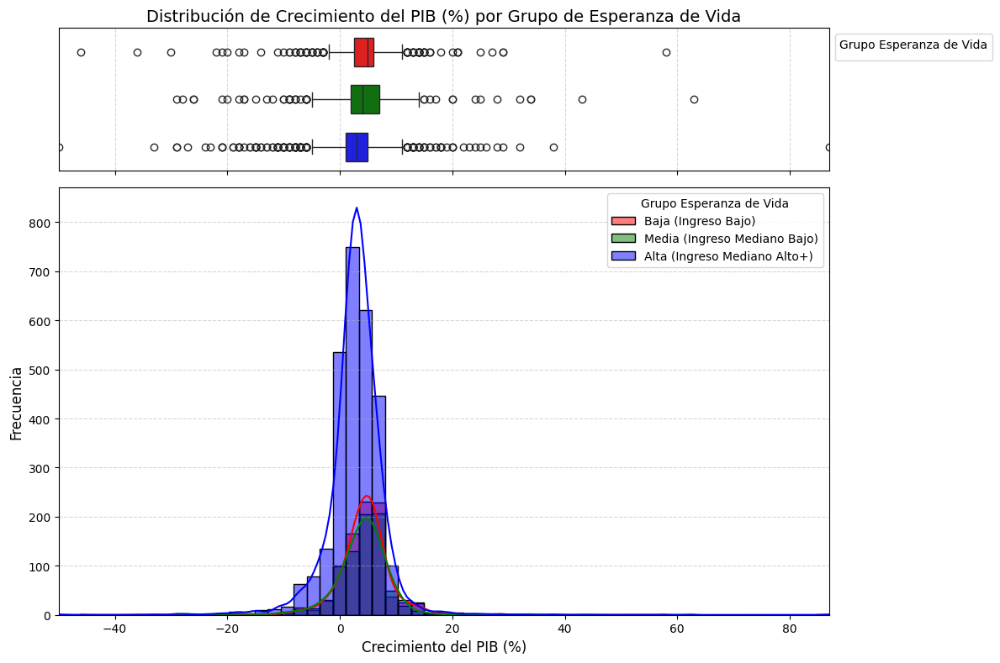

In [19]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Definir la clasificación de esperanza de vida según el Banco Mundial
def clasificar_esperanza_vida(valor):
    if valor < 63:
        return 'Baja (Ingreso Bajo)'
    elif 63 <= valor < 70:
        return 'Media (Ingreso Mediano Bajo)'
    else:
        return 'Alta (Ingreso Mediano Alto+)'

# Aplicar la clasificación al DataFrame
df_imputed['Grupo Esperanza de Vida'] = df_imputed['Esperanza de vida al nacer'].apply(clasificar_esperanza_vida)

# Crear la figura y los ejes
fig, (ax_box, ax_hist) = plt.subplots(2, 1, figsize=(12, 8), sharex=True, gridspec_kw={'height_ratios': [1, 3]})

# Colores por grupo
colors = {'Baja (Ingreso Bajo)': 'red', 'Media (Ingreso Mediano Bajo)': 'green', 'Alta (Ingreso Mediano Alto+)': 'blue'}

# Boxplot
sns.boxplot(data=df_imputed, x='Crecimiento del PIB (%)', y='Grupo Esperanza de Vida', hue='Grupo Esperanza de Vida',
            palette=colors, ax=ax_box, dodge=False, width=0.6)
ax_box.set_xlabel('')
ax_box.set_ylabel('')
ax_box.set(yticks=[])
ax_box.grid(axis='x', linestyle='--', alpha=0.5)
ax_box.set_title('Distribución de Crecimiento del PIB (%) por Grupo de Esperanza de Vida', fontsize=14)
ax_box.legend(title='Grupo Esperanza de Vida', loc='upper left', bbox_to_anchor=(1, 1))

# Definir bins adecuados basados en los datos
min_value = df_imputed['Crecimiento del PIB (%)'].min()
max_value = df_imputed['Crecimiento del PIB (%)'].max()
bins = np.linspace(min_value, max_value, 60)  # Se generan 60 bins equidistantes

# Histogramas con mejor escala y bins
for grupo, color in colors.items():
    subset = df_imputed[df_imputed['Grupo Esperanza de Vida'] == grupo]
    sns.histplot(data=subset, x='Crecimiento del PIB (%)', color=color, label=grupo,
                 kde=True, ax=ax_hist, alpha=0.5, bins=bins)

# Ajustes del eje X
ax_hist.set_xlim(min_value, max_value)  # Limita la escala para evitar espacios innecesarios
ax_hist.set_xlabel('Crecimiento del PIB (%)', fontsize=12)
ax_hist.set_ylabel('Frecuencia', fontsize=12)
ax_hist.legend(title='Grupo Esperanza de Vida', loc='upper right')
ax_hist.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()


In [20]:
# Obteniendo valores atipicos máximos superiores del cuartil 75 e inferiores del cuartil 25 delCrecimiento del PIB (%).
valor_max_Esperanza_Baja = df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Baja (Ingreso Bajo)']['Crecimiento del PIB (%)'].quantile(0.75) + 1.5*(df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Baja (Ingreso Bajo)']['Crecimiento del PIB (%)'].quantile(0.75)-df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Baja (Ingreso Bajo)']['Crecimiento del PIB (%)'].quantile(0.25))
valor_min_Esperanza_Baja = df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Baja (Ingreso Bajo)']['Crecimiento del PIB (%)'].quantile(0.75) - 1.5*(df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Baja (Ingreso Bajo)']['Crecimiento del PIB (%)'].quantile(0.75)-df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Baja (Ingreso Bajo)']['Crecimiento del PIB (%)'].quantile(0.25))

valor_max_Esperanza_Media = df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Media (Ingreso Mediano Bajo)']['Crecimiento del PIB (%)'].quantile(0.75) + 1.5*(df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Media (Ingreso Mediano Bajo)']['Crecimiento del PIB (%)'].quantile(0.75)-df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Media (Ingreso Mediano Bajo)']['Crecimiento del PIB (%)'].quantile(0.25))
valor_min_Esperanza_Media = df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Media (Ingreso Mediano Bajo)']['Crecimiento del PIB (%)'].quantile(0.75) - 1.5*(df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Media (Ingreso Mediano Bajo)']['Crecimiento del PIB (%)'].quantile(0.75)-df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Media (Ingreso Mediano Bajo)']['Crecimiento del PIB (%)'].quantile(0.25))

valor_max_Esperanza_Alta = df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Alta (Ingreso Mediano Alto+)']['Crecimiento del PIB (%)'].quantile(0.75) + 1.5*(df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Alta (Ingreso Mediano Alto+)']['Crecimiento del PIB (%)'].quantile(0.75)-df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Alta (Ingreso Mediano Alto+)']['Crecimiento del PIB (%)'].quantile(0.25))
valor_min_Esperanza_Alta = df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Alta (Ingreso Mediano Alto+)']['Crecimiento del PIB (%)'].quantile(0.75) - 1.5*(df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Alta (Ingreso Mediano Alto+)']['Crecimiento del PIB (%)'].quantile(0.75)-df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Alta (Ingreso Mediano Alto+)']['Crecimiento del PIB (%)'].quantile(0.25))


print(f"El Crecimiento del PIB (%) máximo con una Esperanza de vida Baja del 75% de las muestras es:", valor_max_Esperanza_Baja.round(3))
print(f"El Crecimiento del PIB (%) minimo con una Esperanza de vida Baja del 25% de las muestras es:", valor_min_Esperanza_Baja.round(3))

print(f"El Crecimiento del PIB (%) máximo con una Esperanza de vida Media del 75% de las muestras es:", valor_max_Esperanza_Media.round(3))
print(f"El Crecimiento del PIB (%) minimo con una Esperanza de vida Media del 25% de las muestras es:", valor_min_Esperanza_Media.round(3))

print(f"El Crecimiento del PIB (%) máximo con una Esperanza de vida Alta del 75% de las muestras es:", valor_max_Esperanza_Alta.round(3))
print(f"El Crecimiento del PIB (%) minimo con una Esperanza de vida Alta del 25% de las muestras es:", valor_min_Esperanza_Alta.round(3))

El Crecimiento del PIB (%) máximo con una Esperanza de vida Baja del 75% de las muestras es: 11.25
El Crecimiento del PIB (%) minimo con una Esperanza de vida Baja del 25% de las muestras es: 0.75
El Crecimiento del PIB (%) máximo con una Esperanza de vida Media del 75% de las muestras es: 14.5
El Crecimiento del PIB (%) minimo con una Esperanza de vida Media del 25% de las muestras es: -0.5
El Crecimiento del PIB (%) máximo con una Esperanza de vida Alta del 75% de las muestras es: 11.0
El Crecimiento del PIB (%) minimo con una Esperanza de vida Alta del 25% de las muestras es: -1.0


### Se tomaron dos paises como referencia para evaluar los valores, Argentina y Libia.



### **Argentina:**

### La caida del crecimiento del PBI de -11% coincide con la crísis entre el 2001 y 2002 donde se produce el colapso del sistema bancario argentino.


### **Libia:**
### El Crecimiento de PBI(%) del -50% y 68% corresponde a Libia entre el año 2011 y 2012.
### Fue dado por La Primavera Árabe, la ola de rebelión que se extendió por Oriente Medio y el norte de África en 2011, se topó con una resistencia violenta en Libia cuando los manifestantes comenzaron a pedir el derrocamiento de Muammar al-Gaddafi, cuyo reinado despótico se había prolongado durante más de 40 años.

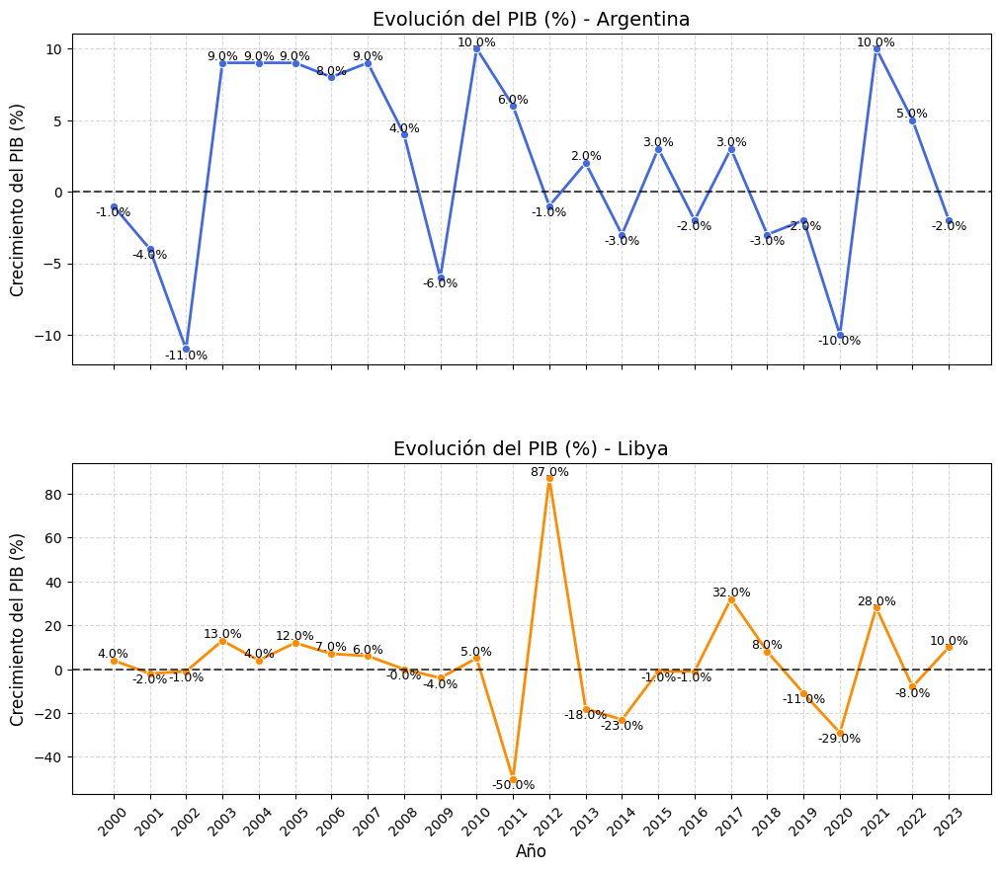

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns

# Filtrar los datos
df_filtered = df_imputed[df_imputed['Pais'].isin(['Argentina', 'Libya'])].sort_values(by='Año')

# Configurar la figura con dos subgráficos en mosaico (2 filas, 1 columna)
fig, axes = plt.subplots(2, 1, figsize=(12, 10), sharex=True, gridspec_kw={'hspace': 0.3})

# Países y colores
paises_colores = {"Argentina": "royalblue", "Libya": "darkorange"}

# Graficar cada país por separado en filas distintas
for i, pais in enumerate(["Argentina", "Libya"]):
    df_pais = df_filtered[df_filtered['Pais'] == pais]

    if df_pais.empty:
        print(f"⚠ No hay datos disponibles para {pais}. Verifica los nombres en el dataset.")
        continue

    # Línea de tendencia
    sns.lineplot(data=df_pais, x="Año", y="Crecimiento del PIB (%)",
                 marker="o", linewidth=2, color=paises_colores[pais], ax=axes[i])

    # Etiquetas en cada punto
    for _, row in df_pais.iterrows():
        axes[i].text(row['Año'], row['Crecimiento del PIB (%)'], f"{row['Crecimiento del PIB (%)']:.1f}%",
                     fontsize=9, ha='center', va='bottom' if row['Crecimiento del PIB (%)'] > 0 else 'top')

    # Configuración de cada subplot
    axes[i].axhline(0, color="black", linestyle="--", alpha=0.7)  # Línea de referencia en 0%
    axes[i].set_title(f"Evolución del PIB (%) - {pais}", fontsize=14)
    axes[i].set_ylabel("Crecimiento del PIB (%)", fontsize=12)
    axes[i].grid(True, linestyle="--", alpha=0.5)

# Ajustes finales
axes[1].set_xlabel("Año", fontsize=12)  # Solo el eje X del gráfico inferior
axes[1].set_xticks(df_filtered['Año'].unique())  # Mostrar todos los años
axes[1].tick_params(axis='x', rotation=45)

# Mostrar el gráfico
plt.show()


### **Observaciones - Crecimiento del PBI (%)**
### Podemos considerar que los valores de este indicador son correctos.
### Dado que es un indicador macro de cada país y esta afectado por distintas variables (crísis económicas, guerras, pandemias, etc), por ahora no se van a tocar los valores outliers.

## 📊 ***2 Histograma y Boxplot de la distribución del PIB per cápita***

### El PIB per cápita es el promedio del Producto Bruto Interno (PBI) que le corresponde a cada persona de un país. Se calcula dividiendo el PIB total de un país entre su población.  

### **Qué indica?**
### - El PIB per cápita es un indicador económico que refleja el nivel de vida de una población.
### - Un PIB per cápita alto indica que las personas ganan más dinero y tienen un mejor nivel de vida.
### - Un PIB per cápita bajo indica que las personas podrían enfrentar dificultades económicas.
###  - Un crecimiento del PIB indica que la producción de bienes y servicios está aumentando.




<ipython-input-22-27ee624b19dc>:15: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax_box.legend(title='Grupo Esperanza de Vida', loc='upper left', bbox_to_anchor=(1, 1))


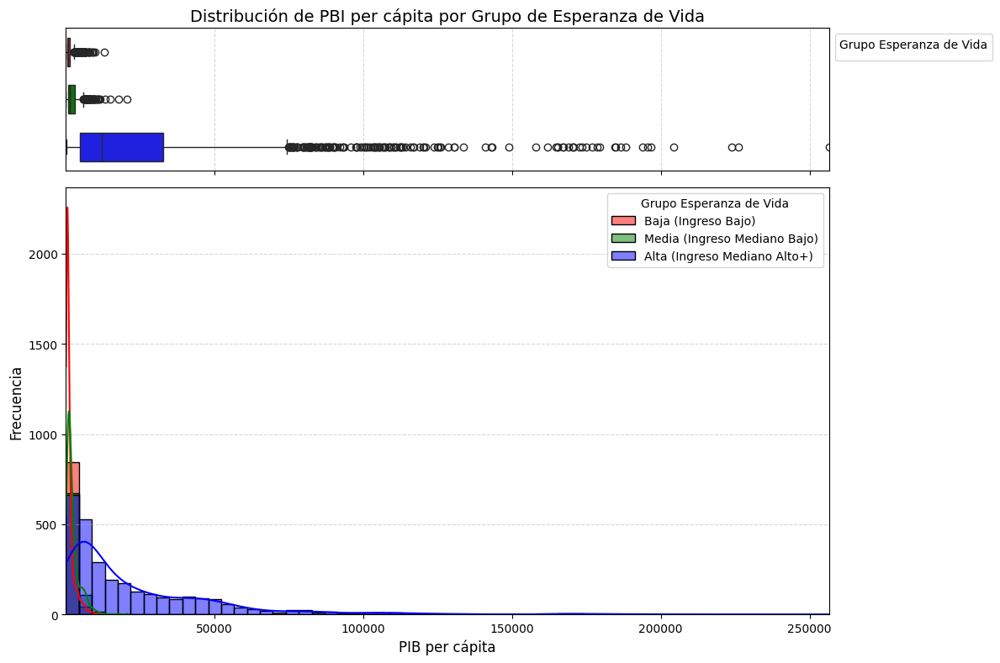

In [22]:
# Crear la figura y los ejes
fig, (ax_box, ax_hist) = plt.subplots(2, 1, figsize=(12, 8), sharex=True, gridspec_kw={'height_ratios': [1, 3]})

# Colores por grupo
colors = {'Baja (Ingreso Bajo)': 'red', 'Media (Ingreso Mediano Bajo)': 'green', 'Alta (Ingreso Mediano Alto+)': 'blue'}

# Boxplot
sns.boxplot(data=df_imputed, x='PIB per cápita', y='Grupo Esperanza de Vida', hue='Grupo Esperanza de Vida',
            palette=colors, ax=ax_box, dodge=False, width=0.6)
ax_box.set_xlabel('')
ax_box.set_ylabel('')
ax_box.set(yticks=[])
ax_box.grid(axis='x', linestyle='--', alpha=0.5)
ax_box.set_title('Distribución de PBI per cápita por Grupo de Esperanza de Vida', fontsize=14)
ax_box.legend(title='Grupo Esperanza de Vida', loc='upper left', bbox_to_anchor=(1, 1))

# Definir bins adecuados basados en los datos
min_value = df_imputed['PIB per cápita'].min()
max_value = df_imputed['PIB per cápita'].max()
bins = np.linspace(min_value, max_value, 60)  # Se generan 60 bins equidistantes

# Histogramas con mejor escala y bins
for grupo, color in colors.items():
    subset = df_imputed[df_imputed['Grupo Esperanza de Vida'] == grupo]
    sns.histplot(data=subset, x='PIB per cápita', color=color, label=grupo,
                 kde=True, ax=ax_hist, alpha=0.5, bins=bins)

# Ajustes del eje X
ax_hist.set_xlim(min_value, max_value)  # Limita la escala para evitar espacios innecesarios
ax_hist.set_xlabel('PIB per cápita', fontsize=12)
ax_hist.set_ylabel('Frecuencia', fontsize=12)
ax_hist.legend(title='Grupo Esperanza de Vida', loc='upper right')
ax_hist.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

In [23]:
# Obteniendo valores atipicos máximos superiores del cuartil 75 e inferiores del cuartil 25 delCrecimiento del PIB (%).
#valor_max_Esperanza_Baja1 = df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Baja (Ingreso Bajo)']['PIB per cápita'].quantile(0.75) + 1.5*(df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Baja (Ingreso Bajo)']['PIB per cápita'].quantile(0.75)-df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Grupo Esperanza de Vida']['PIB per cápita'].quantile(0.25))
valor_max_Esperanza_media = df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Media (Ingreso Mediano Bajo)']['PIB per cápita'].quantile(0.75) + 1.5*(df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Media (Ingreso Mediano Bajo)']['PIB per cápita'].quantile(0.75)-df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Media (Ingreso Mediano Bajo)']['PIB per cápita'].quantile(0.25))
valor_max_Esperanza_Baja = df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Baja (Ingreso Bajo)']['PIB per cápita'].quantile(0.75) + 1.5*(df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Baja (Ingreso Bajo)']['PIB per cápita'].quantile(0.75)-df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Baja (Ingreso Bajo)']['PIB per cápita'].quantile(0.25))
valor_max_Esperanza_alta = df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Alta (Ingreso Mediano Alto+)']['PIB per cápita'].quantile(0.75) + 1.5*(df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Alta (Ingreso Mediano Alto+)']['PIB per cápita'].quantile(0.75)-df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Alta (Ingreso Mediano Alto+)']['PIB per cápita'].quantile(0.25))

print(f"El PIB per cápita máximo en paises con una Esperanza de vida Baja del 25% de las muestras es:", valor_max_Esperanza_Baja.round(3))
print(f"El PIB per cápita máximo en paises con una Esperanza de vida Media del 75% de las muestras es:", valor_max_Esperanza_media.round(3))
print(f"El PIB per cápita máximo en paises con una Esperanza de vida Alta del 75% de las muestras es:", valor_max_Esperanza_alta.round(3))


El PIB per cápita máximo en paises con una Esperanza de vida Baja del 25% de las muestras es: 2846.25
El PIB per cápita máximo en paises con una Esperanza de vida Media del 75% de las muestras es: 6017.5
El PIB per cápita máximo en paises con una Esperanza de vida Alta del 75% de las muestras es: 74644.0


### 📊 Analizando que paises PBI per capita que superan el quartil 75%, nos encontramos con paises altamente desarrollados.

In [24]:
df_out = df_imputed[df_imputed['PIB per cápita'] > 75469].copy()

# Resetear índice para evitar desorden en los índices
df_out.reset_index(drop=True, inplace=True)

# Obtener los países únicos en la columna 'Pais'
paises_unicos = df_out['Pais'].unique()

# Mostrar los países en formato de lista numerada
print("🌍 Países con PIB per cápita mayor a 75,469:\n")
for i, pais in enumerate(sorted(paises_unicos), 1):
    print(f"{i}. {pais}")



🌍 Países con PIB per cápita mayor a 75,469:

1. Bermuda
2. Cayman Islands
3. Iceland
4. Ireland
5. Liechtenstein
6. Luxembourg
7. Monaco
8. Norway
9. Qatar
10. San Marino
11. Singapore
12. Switzerland
13. United States


### 🚀 Estos países tienen un PIB per cápita extremadamente alto debido a una combinación de factores económicos, geográficos y políticos que favorecen su crecimiento y estabilidad financiera. A continuación, un resumen de las razones clave para justificar su alto nivel de riqueza:

### 🏦 1. Centros Financieros y Paraísos Fiscales
### 📌 Bermuda, Islas Caimán, Gibraltar, Liechtenstein, Luxemburgo, San Marino, Mónaco, Suiza, Singapur

### Son centros financieros internacionales y paraísos fiscales con impuestos bajos o nulos para empresas y personas de alto patrimonio.
### Atraen inversiones extranjeras, bancos, aseguradoras y fondos de inversión.
### ⛏️ 2. Recursos Naturales y Energía
### 📌 Noruega, Qatar

### Noruega se beneficia de sus reservas de petróleo y gas del Mar del Norte, con un sólido fondo soberano que invierte a nivel global.
### Qatar posee algunas de las mayores reservas de gas natural del mundo, con un sector energético clave para su riqueza.
### 🏭 3. Economías Altamente Desarrolladas y Diversificadas
### 📌 Irlanda, Islandia, Suiza, Singapur, Estados Unidos

### Poseen industrias avanzadas en tecnología, farmacéutica, manufactura de alta gama y servicios financieros.
### Irlanda y Singapur atraen a multinacionales tecnológicas con bajos impuestos y políticas favorables para la inversión.
### Estados Unidos tiene una economía altamente diversificada y es líder en innovación.
### 🌎 4. Pequeños Estados con Alta Calidad de Vida y Especialización
### 📌 Mónaco, San Marino, Liechtenstein, Luxemburgo

### Pequeños en territorio pero con un alto nivel de ingresos por servicios financieros, turismo de lujo y sectores nicho.
### Mónaco, por ejemplo, se beneficia del turismo de élite y su atractivo como residencia fiscal.


## 📊 ***3 Histograma y Boxplot de la distribución de la Mortalidad infantil***

### La mortalidad infantil es un indicador demográfico y de salud pública que mide el número de niños que fallecen antes de cumplir un año de vida por cada 1,000 nacidos vivos en un año determinado.  

### **Qué indica?**
### - Mide el desarrollo de un país → Un TMI bajo indica buenas condiciones de salud, nutrición y acceso a servicios médicos.
### - Refleja el acceso a servicios de salud → Países con sistemas de salud deficientes suelen tener TMI más altas.
### - Evalúa la calidad de vida → Relacionado con el acceso a agua potable, saneamiento y alimentación adecuada.
### - Permite comparar países → Utilizado por organismos como el Banco Mundial y la OMS para analizar políticas de salud.





<ipython-input-25-be1ece388bd6>:16: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax_box.legend(title='Grupo Esperanza de Vida', loc='upper left', bbox_to_anchor=(1, 1))


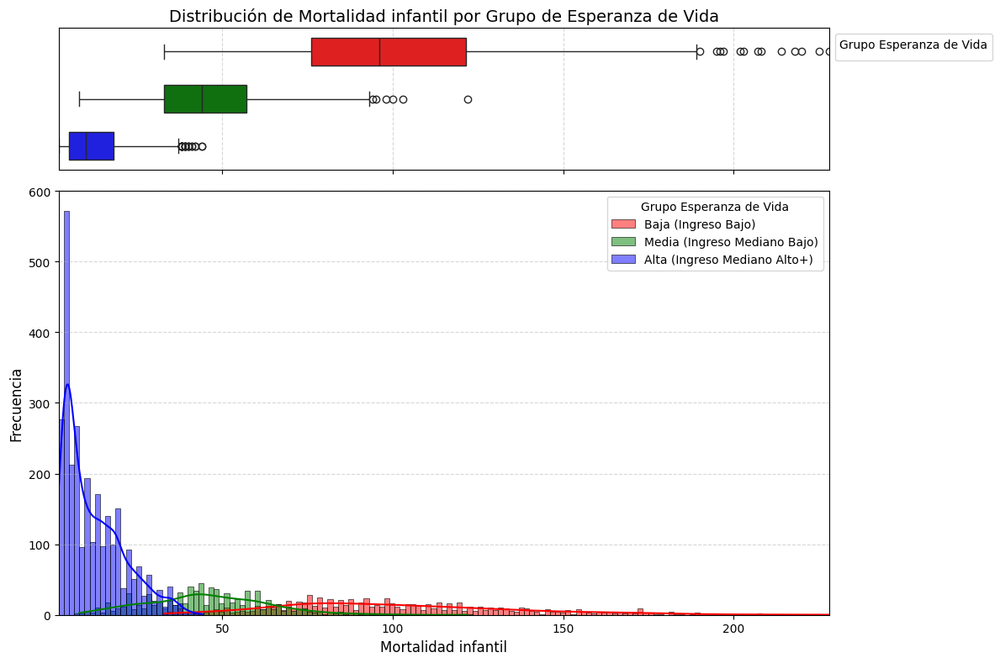

In [25]:
# Crear la figura y los ejes
fig, (ax_box, ax_hist) = plt.subplots(2, 1, figsize=(12, 8), sharex=True, gridspec_kw={'height_ratios': [1, 3]})

# Colores por grupo
colors = {'Baja (Ingreso Bajo)': 'red', 'Media (Ingreso Mediano Bajo)': 'green', 'Alta (Ingreso Mediano Alto+)': 'blue'}

# Boxplot
#sns.boxplot(data=df_imputed, x='PIB per cápita', y='Grupo Esperanza de Vida', hue='Grupo Esperanza de Vida',
sns.boxplot(data=df_imputed, x='Mortalidad infantil', y='Grupo Esperanza de Vida', hue='Grupo Esperanza de Vida',
            palette=colors, ax=ax_box, dodge=False, width=0.6)
ax_box.set_xlabel('')
ax_box.set_ylabel('')
ax_box.set(yticks=[])
ax_box.grid(axis='x', linestyle='--', alpha=0.5)
ax_box.set_title('Distribución de Mortalidad infantil por Grupo de Esperanza de Vida', fontsize=14)
ax_box.legend(title='Grupo Esperanza de Vida', loc='upper left', bbox_to_anchor=(1, 1))

# Definir bins adecuados basados en los datos
min_value = df_imputed['Mortalidad infantil'].min()
max_value = df_imputed['Mortalidad infantil'].max()
bins = np.linspace(min_value, max_value, 150)  # Se generan 60 bins equidistantes

# Histogramas con mejor escala y bins
for grupo, color in colors.items():
    subset = df_imputed[df_imputed['Grupo Esperanza de Vida'] == grupo]
    sns.histplot(data=subset, x='Mortalidad infantil', color=color, label=grupo,
                 kde=True, ax=ax_hist, alpha=0.5, bins=bins)

# Ajustes del eje X
ax_hist.set_xlim(min_value, max_value)  # Limita la escala para evitar espacios innecesarios
ax_hist.set_xlabel('Mortalidad infantil', fontsize=12)
ax_hist.set_ylabel('Frecuencia', fontsize=12)
ax_hist.legend(title='Grupo Esperanza de Vida', loc='upper right')
ax_hist.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

In [26]:
# Obteniendo valores atípicos superiores del cuartil 75 e inferiores del cuartil 25 de Mortalidad Infantil
valor_max_Mortalidad_infantil_media = df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Media (Ingreso Mediano Bajo)']['Mortalidad infantil'].quantile(0.75) + \
                                      1.5 * (df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Media (Ingreso Mediano Bajo)']['Mortalidad infantil'].quantile(0.75) -
                                             df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Media (Ingreso Mediano Bajo)']['Mortalidad infantil'].quantile(0.25))

valor_max_Mortalidad_infantil_baja = df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Baja (Ingreso Bajo)']['Mortalidad infantil'].quantile(0.75) + \
                                     1.5 * (df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Baja (Ingreso Bajo)']['Mortalidad infantil'].quantile(0.75) -
                                            df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Baja (Ingreso Bajo)']['Mortalidad infantil'].quantile(0.25))

valor_max_Mortalidad_infantil_alta = df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Alta (Ingreso Mediano Alto+)']['Mortalidad infantil'].quantile(0.75) + \
                                     1.5 * (df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Alta (Ingreso Mediano Alto+)']['Mortalidad infantil'].quantile(0.75) -
                                            df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Alta (Ingreso Mediano Alto+)']['Mortalidad infantil'].quantile(0.25))

# Imprimir resultados
print(f"El valor máximo de Mortalidad Infantil en países con Esperanza de Vida Baja es: {valor_max_Mortalidad_infantil_baja.round(3)}")
print(f"El valor máximo de Mortalidad Infantil en países con Esperanza de Vida Media es: {valor_max_Mortalidad_infantil_media.round(3)}")
print(f"El valor máximo de Mortalidad Infantil en países con Esperanza de Vida Alta es: {valor_max_Mortalidad_infantil_alta.round(3)}")


El valor máximo de Mortalidad Infantil en países con Esperanza de Vida Baja es: 189.75
El valor máximo de Mortalidad Infantil en países con Esperanza de Vida Media es: 93.0
El valor máximo de Mortalidad Infantil en países con Esperanza de Vida Alta es: 37.5


In [27]:

# Filtrar países donde la mortalidad infantil es mayor a 37.5 dentro del grupo de Esperanza de Vida Alta
df_out3 = df_imputed[(df_imputed['Grupo Esperanza de Vida'] == 'Alta (Ingreso Mediano Alto+)') &
                     (df_imputed['Mortalidad infantil'] > 37.5)].copy()

# Resetear índice para evitar desorden en los índices
df_out3.reset_index(drop=True, inplace=True)

# Obtener los países únicos en la columna 'Pais'
paises_unicos3 = df_out3['Pais'].unique()

# Mostrar los países en formato de lista numerada
print("🌍 Países con Mortalidad Infantil mayor a 37.5 en el grupo de Esperanza de Vida Alta:\n")
for i, pais in enumerate(sorted(paises_unicos3), 1):
    print(f"{i}. {pais}")



🌍 Países con Mortalidad Infantil mayor a 37.5 en el grupo de Esperanza de Vida Alta:

1. Algeria
2. Azerbaijan
3. Bangladesh
4. Dominican Republic
5. Guatemala
6. India
7. Maldives
8. Micronesia, Federated States of
9. Peru
10. Syrian Arab Republic
11. Türkiye


## 🔎 Principales causas de alta mortalidad infantil en estos países
### 1️⃣ Infraestructura sanitaria deficiente
### Acceso limitado a hospitales y clínicas: Muchas regiones rurales en estos países no tienen hospitales cercanos ni personal médico capacitado.
### Falta de equipos médicos esenciales: La falta de incubadoras, oxígeno y medicamentos críticos impacta la tasa de supervivencia neonatal.
### Deficiencia en el cuidado prenatal: Muchas madres no reciben el control adecuado durante el embarazo, aumentando el riesgo de complicaciones.
### 2️⃣ Malnutrición infantil y materna
### Bajo peso al nacer: La malnutrición en la madre puede generar bebés con bajo peso, aumentando la vulnerabilidad a enfermedades.
### Deficiencia de micronutrientes: Falta de hierro, ácido fólico, yodo y zinc impacta el desarrollo del sistema inmunológico del bebé.
### Desnutrición y acceso a agua potable: En países como Bangladesh, India y Guatemala, hay zonas con alta desnutrición infantil y poco acceso a agua potable segura.
### 3️⃣ Enfermedades infecciosas y falta de vacunación
### Neumonía, diarrea y malaria: Son causas principales de mortalidad infantil en países con recursos limitados.
### Bajas tasas de vacunación: En regiones afectadas por conflictos (Siria) o falta de acceso a programas de salud, la cobertura de vacunas es insuficiente.
### 4️⃣ Pobreza y desigualdad económica
### Falta de acceso a servicios básicos: En países como India y Bangladesh, la pobreza extrema impide el acceso a salud, agua potable y saneamiento adecuado.
### Trabajo infantil y embarazos adolescentes: Afecta el acceso de las madres jóvenes a la salud materna, elevando los riesgos en el parto.
### 5️⃣ Factores políticos y conflictos
### Inestabilidad política y guerras: En Siria y algunos sectores de Türkiye, la guerra ha destruido infraestructura de salud y ha desplazado poblaciones enteras.
### Crisis económica y falta de inversión en salud: Países como Perú y República Dominicana han experimentado crisis económicas que afectan la inversión en hospitales y programas de salud infantil.

## 📊 ***4 Histograma y Boxplot de Tasa de vacunación infantil (Sarampión)***

### Este indicador mide el porcentaje de niños (generalmente menores de un año) que han recibido al menos una dosis de la vacuna contra el sarampión dentro del esquema de vacunación nacional de un país.

### **Qué indica?**
### -  Prevención de enfermedades → El sarampión es altamente contagioso y puede ser mortal en niños pequeños. Una alta tasa de vacunación ayuda a prevenir brotes.
### - Inmunidad colectiva → Cuando más del 95% de la población infantil está vacunada, se reduce la propagación del virus, protegiendo incluso a quienes no pueden vacunarse (ej. bebés menores de 6 meses o personas inmunosuprimidas).
###  -Indicador de acceso a la salud → Refleja la cobertura y accesibilidad del sistema de salud en un país.
### - Vigilancia de crisis sanitarias → Un descenso en la tasa de vacunación puede ser una alerta de crisis sanitaria, conflictos o desinformación sobre vacunas.

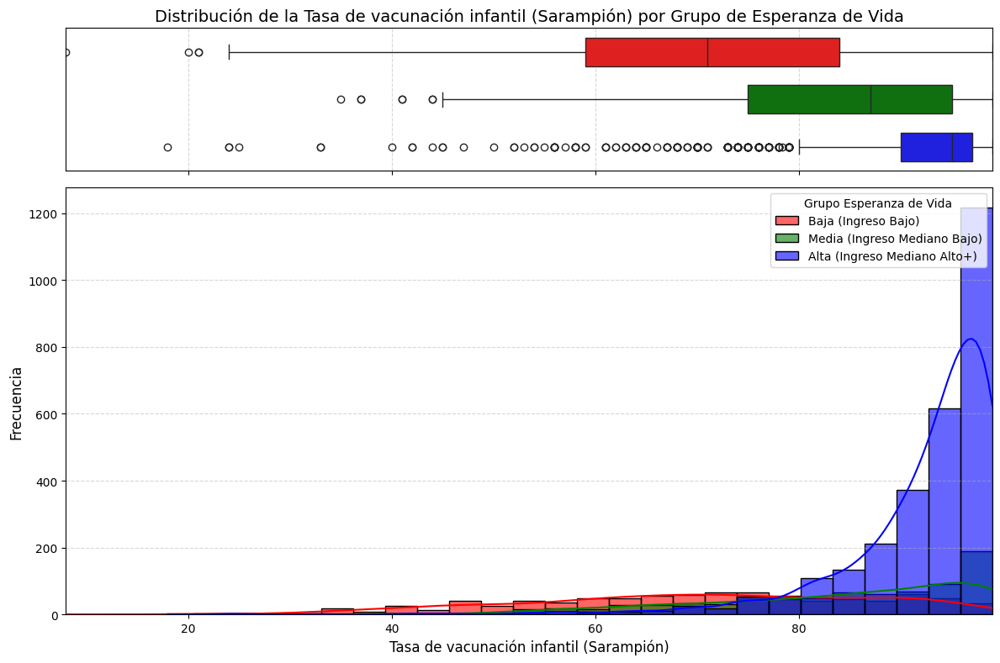

In [28]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Crear la figura y los ejes
fig, (ax_box, ax_hist) = plt.subplots(2, 1, figsize=(12, 8), sharex=True, gridspec_kw={'height_ratios': [1, 3]})

# Colores por grupo
colors = {'Baja (Ingreso Bajo)': 'red', 'Media (Ingreso Mediano Bajo)': 'green', 'Alta (Ingreso Mediano Alto+)': 'blue'}

# Boxplot
sns.boxplot(data=df_imputed, x='Tasa de vacunación infantil (Sarampión)', y='Grupo Esperanza de Vida',
            palette=colors, ax=ax_box, width=0.6)

ax_box.set_xlabel('')
ax_box.set_ylabel('')
ax_box.set(yticks=[])
ax_box.grid(axis='x', linestyle='--', alpha=0.5)
ax_box.set_title('Distribución de la Tasa de vacunación infantil (Sarampión) por Grupo de Esperanza de Vida', fontsize=14)

# Definir bins adecuados
min_value = df_imputed['Tasa de vacunación infantil (Sarampión)'].min()
max_value = df_imputed['Tasa de vacunación infantil (Sarampión)'].max()
bins = np.linspace(min_value, max_value, 30)  # 30 bins en lugar de 150 para mejor visualización

# Histogramas por grupo
for grupo, color in colors.items():
    subset = df_imputed[df_imputed['Grupo Esperanza de Vida'] == grupo]
    sns.histplot(data=subset, x='Tasa de vacunación infantil (Sarampión)', color=color, label=grupo,
                 kde=True, ax=ax_hist, alpha=0.6, bins=bins)

# Ajustes del eje X e Y
ax_hist.set_xlim(min_value, max_value)
ax_hist.set_xlabel('Tasa de vacunación infantil (Sarampión)', fontsize=12)
ax_hist.set_ylabel('Frecuencia', fontsize=12)
ax_hist.legend(title='Grupo Esperanza de Vida', loc='upper right')
ax_hist.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()


In [29]:
valor_min_Tasa_de_vacunación_infantil_alta = df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Alta (Ingreso Mediano Alto+)']['Tasa de vacunación infantil (Sarampión)'].quantile(0.75) - 1.5*(df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Alta (Ingreso Mediano Alto+)']['Tasa de vacunación infantil (Sarampión)'].quantile(0.75)-df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Alta (Ingreso Mediano Alto+)']['Tasa de vacunación infantil (Sarampión)'].quantile(0.25))



# Imprimir resultados
print(f"El % minimo de de niños vacunados contra la sarampion en países con Esperanza de Vida Alta es: {valor_min_Tasa_de_vacunación_infantil_alta.round(3)}")
#print(f"El valor máximo de Mortalidad Infantil en países con Esperanza de Vida Media es: {valor_max_Mortalidad_infantil_media.round(3)}")
#print(f"El valor máximo de Mortalidad Infantil en países con Esperanza de Vida Alta es: {valor_max_Mortalidad_infantil_alta.round(3)}")



El % minimo de de niños vacunados contra la sarampion en países con Esperanza de Vida Alta es: 86.5


In [30]:
# Filtrar países donde la tasa de vacunación infantil es menor al 86.5% dentro del grupo de Esperanza de Vida Alta
df_out4 = df_imputed[
    (df_imputed['Grupo Esperanza de Vida'] == 'Alta (Ingreso Mediano Alto+)') &
    (df_imputed['Tasa de vacunación infantil (Sarampión)'] < 86.5)
].copy()

# Resetear índice para evitar desorden en los índices
df_out4.reset_index(drop=True, inplace=True)

# Obtener los países únicos en la columna 'Pais'
paises_unicos4 = df_out4['Pais'].unique()

# Mostrar los países en formato de lista numerada
print("🌍 Países que tienen menos del 86.5% de los niños vacunados en el grupo de Esperanza de Vida Alta:\n")
for i, pais in enumerate(sorted(paises_unicos4), 1):
    print(f"{i}. {pais}")


🌍 Países que tienen menos del 86.5% de los niños vacunados en el grupo de Esperanza de Vida Alta:

1. Albania
2. Algeria
3. American Samoa
4. Antigua and Barbuda
5. Argentina
6. Austria
7. Bahamas
8. Barbados
9. Belgium
10. Belize
11. Bosnia and Herzegovina
12. Brazil
13. Cambodia
14. China
15. Colombia
16. Costa Rica
17. Cyprus
18. Denmark
19. Dominica
20. Dominican Republic
21. Ecuador
22. El Salvador
23. Faroe Islands
24. France
25. Georgia
26. Grenada
27. Guatemala
28. Honduras
29. Hong Kong
30. Indonesia
31. Ireland
32. Italy
33. Jamaica
34. Jordan
35. Lebanon
36. Libya
37. Malta
38. Mauritius
39. Mexico
40. Micronesia, Federated States of
41. Moldova, Republic of
42. Montenegro
43. New Zealand
44. Nicaragua
45. North Macedonia
46. Northern Mariana Islands
47. Norway
48. Panama
49. Paraguay
50. Peru
51. Philippines
52. Romania
53. Saint Lucia
54. Samoa
55. San Marino
56. Serbia
57. Suriname
58. Switzerland
59. Syrian Arab Republic
60. Trinidad and Tobago
61. Türkiye
62. Ukraine
63

## 🔎 **Principales causas de una baja tasa de vacunación contra el sarampión con una alta esperanza de vida al nacer:**

### **🌍 1️⃣ Países con Conflictos Bélicos y Crisis Políticas**
### Estos países han experimentado guerras, conflictos internos o crisis políticas que han afectado sus sistemas de salud.
### 🔴 Principales problemas: Falta de infraestructura, migración masiva, recortes en programas de vacunación.

### Siria 🇸🇾 → Guerra civil desde 2011 ha colapsado el sistema de salud.
### Ucrania 🇺🇦 → Invasión rusa en 2022 ha afectado los servicios médicos.
### Venezuela 🇻🇪 → Crisis económica y social ha deteriorado la vacunación.
### Libia 🇱🇾 → Guerra civil ha fragmentado el acceso a servicios médicos.
### Líbano 🇱🇧 → Crisis financiera ha afectado la compra de vacunas.

### **💰 2️⃣ Países con Problemas Económicos o Infraestructura Deficiente**
### Estos países tienen ingresos medianos o bajos, lo que afecta la inversión en salud pública.
### 🟠 Principales problemas: Falta de fondos para vacunas, infraestructura deficiente, acceso difícil a comunidades rurales.

### Honduras 🇭🇳
### Guatemala 🇬🇹
### Nicaragua 🇳🇮
### El Salvador 🇸🇻
### Ecuador 🇪🇨
### Paraguay 🇵🇾
### Perú 🇵🇪
### Filipinas 🇵🇭
### Indonesia 🇮🇩
### Camboya 🇰🇭
### Moldavia 🇲🇩


### **❌ 3️⃣ Países con Movimientos Antivacunas y Desinformación**
### Algunos países desarrollados han visto descensos en las tasas de vacunación debido a la desconfianza en las vacunas.
### 🟡 Principales problemas: Creencias erróneas, desinformación, rechazo por parte de algunos grupos.

### Francia 🇫🇷
### Reino Unido 🇬🇧
### Italia 🇮🇹
### Austria 🇦🇹
### Bélgica 🇧🇪
### Suiza 🇨🇭
### Rumania 🇷🇴
### 🔹 En estos países, la falta de vacunación no se debe a problemas económicos, sino a la influencia de grupos antivacunas.

### **🏝️ 4️⃣ Países con Dificultades Geográficas y Logísticas**
### Estos países tienen problemas de acceso a zonas rurales o insulares.
### 🔵 Principales problemas: Transporte de vacunas, falta de almacenamiento adecuado, escasez de personal médico.

### Vanuatu 🇻🇺
### Samoa 🇼🇸
### Micronesia 🇫🇲
### Islas Feroe 🇫🇴
### San Marino 🇸🇲
### Antigua y Barbuda 🇦🇬
### Bahamas 🇧🇸
### Barbados 🇧🇧
### Belice 🇧🇿
### 🔹 Muchas de estas naciones dependen de donaciones internacionales para sus programas de vacunación.

### 🧐 5️⃣ Casos Curiosos: Países con Buen PIB pero Baja Vacunación
### Algunos países con economías relativamente estables también presentan bajas tasas de vacunación.
### 🔵 Posibles razones: Falta de prioridad en salud, problemas burocráticos, creencias culturales.

### Argentina 🇦🇷 → Crisis económica ha afectado el presupuesto en salud.
### Brasil 🇧🇷 → La vacunación ha bajado debido a falta de campañas gubernamentales.
### China 🇨🇳 → En algunas provincias rurales, la vacunación aún es baja.
### Jamaica 🇯🇲 → Factores culturales y religiosos pueden influir en la baja cobertura.
### Panamá 🇵🇦 → Aunque tiene buenos ingresos, no ha logrado alcanzar altos niveles de vacunación.

### **📌 Conclusión**
### 📉 Las tasas bajas de vacunación contra el sarampión pueden deberse a múltiples factores, como conflictos, economía, desinformación y problemas logísticos.
### 🌎 No hay una única razón universal, pero cada país tiene su propia combinación de razones.











## 📊 ***5 Histograma y Boxplot de Gasto en salud (% del PIB)***

### El Gasto en Salud como porcentaje del PIB mide cuánto invierte un país en salud en relación con su Producto Interno Bruto (PIB). En otras palabras, indica qué parte de la riqueza total de un país se destina a la atención médica y el bienestar de su población.

### **🏥 ¿Por qué es importante este indicador?**
### El nivel de inversión en salud influye directamente en la calidad de vida, la esperanza de vida y la capacidad de los países para responder a enfermedades y pandemias.

### 📌 Valores Altos (Ej: EE.UU., Alemania, Francia):
### ✅ Indican que el país asigna una gran parte de su economía a la salud.
### ✅ Suele reflejar sistemas sanitarios robustos con tecnología avanzada.
### ❌ No siempre significa eficiencia; en algunos casos, los costos del sistema son elevados.

### 📌 Valores Bajos (Ej: Nigeria, India, Haití):
### ❌ Sugieren que la salud no es una prioridad presupuestaria.
### ❌ Puede reflejar problemas como falta de hospitales, médicos y medicamentos.
### ✅ En algunos casos, indica sistemas de salud eficientes con costos bajos.

<ipython-input-31-b598ce450653>:16: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax_box.legend(title='Grupo Esperanza de Vida', loc='upper left', bbox_to_anchor=(1, 1))


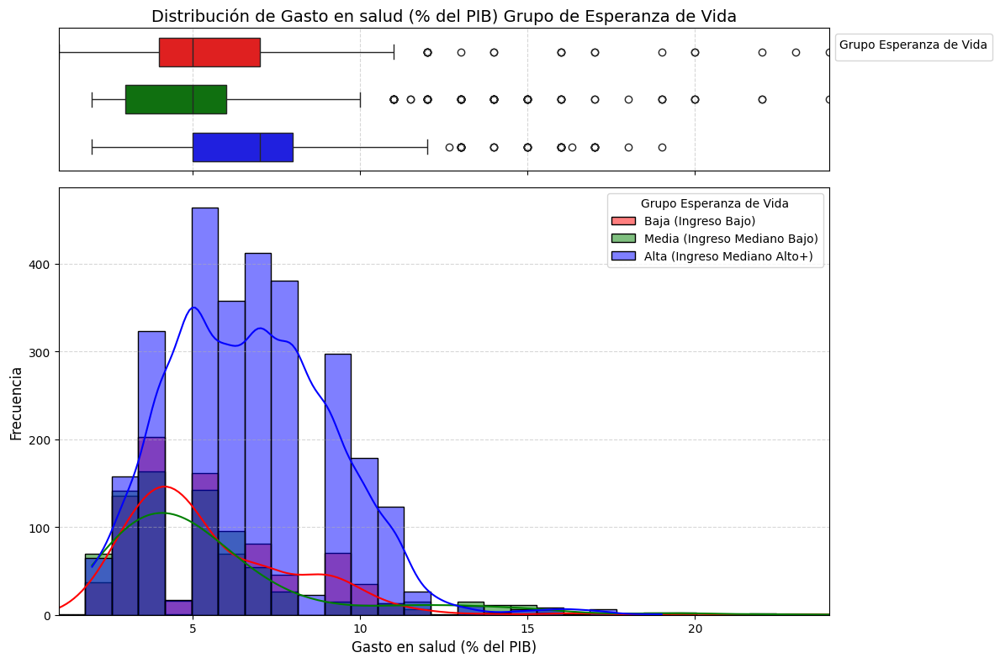

In [31]:
# Crear la figura y los ejes
fig, (ax_box, ax_hist) = plt.subplots(2, 1, figsize=(12, 8), sharex=True, gridspec_kw={'height_ratios': [1, 3]})

# Colores por grupo
colors = {'Baja (Ingreso Bajo)': 'red', 'Media (Ingreso Mediano Bajo)': 'green', 'Alta (Ingreso Mediano Alto+)': 'blue'}

# Boxplot
#sns.boxplot(data=df_imputed, x='PIB per cápita', y='Grupo Esperanza de Vida', hue='Grupo Esperanza de Vida',
sns.boxplot(data=df_imputed, x='Gasto en salud (% del PIB)', y='Grupo Esperanza de Vida', hue='Grupo Esperanza de Vida',
            palette=colors, ax=ax_box, dodge=False, width=0.6)
ax_box.set_xlabel('')
ax_box.set_ylabel('')
ax_box.set(yticks=[])
ax_box.grid(axis='x', linestyle='--', alpha=0.5)
ax_box.set_title('Distribución de Gasto en salud (% del PIB) Grupo de Esperanza de Vida', fontsize=14)
ax_box.legend(title='Grupo Esperanza de Vida', loc='upper left', bbox_to_anchor=(1, 1))

# Definir bins adecuados basados en los datos
min_value = df_imputed['Gasto en salud (% del PIB)'].min()
max_value = df_imputed['Gasto en salud (% del PIB)'].max()
bins = np.linspace(min_value, max_value, 30)  # Se generan 60 bins equidistantes

# Histogramas con mejor escala y bins
for grupo, color in colors.items():
    subset = df_imputed[df_imputed['Grupo Esperanza de Vida'] == grupo]
    sns.histplot(data=subset, x='Gasto en salud (% del PIB)', color=color, label=grupo,
                 kde=True, ax=ax_hist, alpha=0.5, bins=bins)

# Ajustes del eje X
ax_hist.set_xlim(min_value, max_value)  # Limita la escala para evitar espacios innecesarios
ax_hist.set_xlabel('Gasto en salud (% del PIB)', fontsize=12)
ax_hist.set_ylabel('Frecuencia', fontsize=12)
ax_hist.legend(title='Grupo Esperanza de Vida', loc='upper right')
ax_hist.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

In [32]:
valor_max_gasto_salud_baja = df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Baja (Ingreso Bajo)']['Gasto en salud (% del PIB)'].quantile(0.75) + \
                                     1.5 * (df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Baja (Ingreso Bajo)']['Gasto en salud (% del PIB)'].quantile(0.75) -
                                            df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Baja (Ingreso Bajo)']['Gasto en salud (% del PIB)'].quantile(0.25))

# Imprimir resultados
print(f"El valor máximo de Gasto en salud (% del PIB) en países con Esperanza de Vida Baja es: {valor_max_gasto_salud_baja.round(3)}")


El valor máximo de Gasto en salud (% del PIB) en países con Esperanza de Vida Baja es: 11.5


In [33]:
# Filtrar países donde la tasa de vacunación infantil es menor al 86.5% dentro del grupo de Esperanza de Vida Alta
df_out5 = df_imputed[
    (df_imputed['Grupo Esperanza de Vida'] == 'Baja (Ingreso Bajo)') &
    (df_imputed['Gasto en salud (% del PIB)'] > 11.5)
].copy()

# Resetear índice para evitar desorden en los índices
df_out5.reset_index(drop=True, inplace=True)

# Obtener los países únicos en la columna 'Pais'
paises_unicos5 = df_out5['Pais'].unique()

# Mostrar los países en formato de lista numerada
print("🌍 Países que tienen mas del 11.5 % del PBI gastados en Salud pero que son del grupo de Esperanza de Vida Alta:\n")
for i, pais in enumerate(sorted(paises_unicos5), 1):
    print(f"{i}. {pais}")

🌍 Países que tienen mas del 11.5 % del PBI gastados en Salud pero que son del grupo de Esperanza de Vida Alta:

1. Afghanistan
2. Lesotho
3. Liberia
4. Nauru
5. Sierra Leone
6. South Sudan


## 🔎 **Principales causas de los paises con un alto gasto del PBI en salud pero con una esperanza de vida al nacer baja:**

### **🔎 1️⃣ Gasto Relativo vs. Gasto Absoluto**
### El indicador Gasto en Salud (% del PIB) mide qué proporción de la economía se destina a la salud, pero no indica la cantidad total de dinero invertida.

### 📌 Ejemplo comparativo:

### EE.UU. (16.8% del PIB en salud) → PIB per cápita ≈ $80,000
### Su gasto absoluto en salud es alto porque su economía es grande.

### Sierra Leona (más del 10% del PIB en salud) → PIB per cápita < $500
### Aunque el porcentaje sea alto, la cantidad real de dinero disponible para la salud es baja.
### 💡 Conclusión: Estos países gastan un alto porcentaje de su PIB en salud porque su economía es pequeña, pero el gasto absoluto sigue siendo insuficiente para ofrecer servicios de calidad.

### **⚠️ 2️⃣ Infraestructura Sanitaria Deficiente**
### A pesar del alto porcentaje del PIB invertido en salud, estos países enfrentan graves problemas en su sistema de salud:

### Falta de hospitales y clínicas equipadas.
### Escasez de personal médico calificado.
### Deficiencias en distribución de medicamentos y vacunas.
### Baja inversión en saneamiento y acceso a agua potable, lo que aumenta las enfermedades infecciosas.
### 📌 Ejemplo:

### Sudán del Sur tiene una de las tasas más altas de mortalidad infantil y materna porque muchas comunidades no tienen acceso a hospitales y deben viajar largas distancias para recibir atención.
### **🔫 3️⃣ Conflictos Bélicos y Crisis Políticas**
### Países como Afganistán, Sudán del Sur y Liberia han sufrido guerras civiles, conflictos armados o crisis políticas prolongadas.

### 💣 Impacto en la salud:

### Destrucción de hospitales e infraestructura sanitaria.
### Falta de acceso a atención médica en zonas de guerra.
### Desplazamiento forzado de la población, aumentando enfermedades y desnutrición.
### 📌 Ejemplo:

### Afganistán ha enfrentado inestabilidad por décadas, lo que ha afectado su sistema de salud. A pesar de que invierte en salud, la guerra y la falta de acceso a tratamientos básicos reducen la esperanza de vida.

### **🦠 4️⃣ Altas Tasas de Enfermedades y Desnutrición**
### Estos países tienen una alta prevalencia de enfermedades infecciosas y crónicas debido a:

### Falta de acceso a agua potable y saneamiento.
### Alta incidencia de VIH/SIDA, malaria, tuberculosis y desnutrición.
### Deficiencias en programas de vacunación infantil.
### 📌 Ejemplo:

### Lesoto tiene una de las tasas más altas de VIH/SIDA en el mundo (>20% de la población), lo que reduce drásticamente la esperanza de vida.
### **🌍 5️⃣ Dependencia de Ayuda Internacional y Problemas de Corrupción**
### Muchos de estos países reciben ayuda internacional para el sector salud, lo que puede inflar el % del PIB en salud, pero:

### Parte de los fondos se pierden por corrupción.
### No siempre se destinan a mejorar los servicios básicos.
### 📌 Ejemplo:

### Sierra Leona recibió ayuda tras la crisis del Ébola, pero el acceso a la salud sigue siendo limitado debido a problemas de gestión y corrupción.


## 📊 ***6 Histograma y Boxplot de Gasto en salud per cápita***

### Este indicador mide cuánto dinero se gasta en salud por persona en un país en un año. Se calcula dividiendo el gasto total en salud entre la población total.

### 📌 ¿Por qué es un Indicador Clave?
### 1️⃣ Mide el acceso a servicios de salud:

### Países con gasto per cápita alto suelen tener mejor infraestructura, hospitales y acceso a medicamentos.
### Un gasto per cápita bajo indica posibles deficiencias en atención médica.
### 2️⃣ Compara la inversión en salud entre países:

### EE.UU. tiene un gasto per cápita de mas 12,000 USD, mientras que países de bajos ingresos gastan menos de $100 USD por persona.
### 3️⃣ Refleja la calidad del sistema de salud:

### No solo importa cuánto se gasta, sino cómo se distribuye.



<ipython-input-34-e88f66833fed>:16: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax_box.legend(title='Grupo Esperanza de Vida', loc='upper left', bbox_to_anchor=(1, 1))


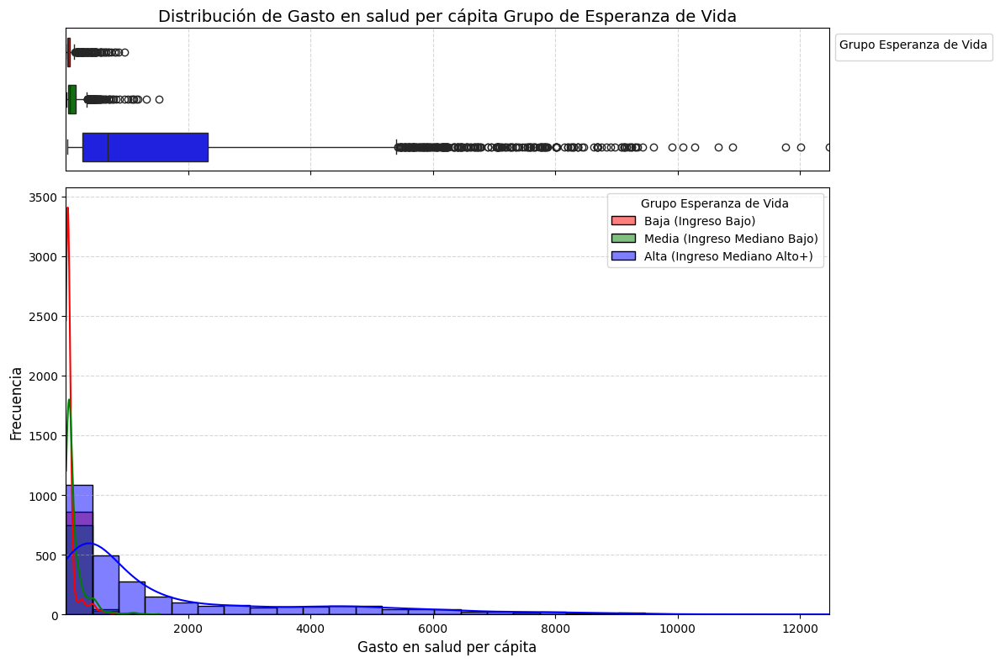

In [34]:
# Crear la figura y los ejes
fig, (ax_box, ax_hist) = plt.subplots(2, 1, figsize=(12, 8), sharex=True, gridspec_kw={'height_ratios': [1, 3]})

# Colores por grupo
colors = {'Baja (Ingreso Bajo)': 'red', 'Media (Ingreso Mediano Bajo)': 'green', 'Alta (Ingreso Mediano Alto+)': 'blue'}

# Boxplot
#sns.boxplot(data=df_imputed, x='PIB per cápita', y='Grupo Esperanza de Vida', hue='Grupo Esperanza de Vida',
sns.boxplot(data=df_imputed, x='Gasto en salud per cápita', y='Grupo Esperanza de Vida', hue='Grupo Esperanza de Vida',
            palette=colors, ax=ax_box, dodge=False, width=0.6)
ax_box.set_xlabel('')
ax_box.set_ylabel('')
ax_box.set(yticks=[])
ax_box.grid(axis='x', linestyle='--', alpha=0.5)
ax_box.set_title('Distribución de Gasto en salud per cápita Grupo de Esperanza de Vida', fontsize=14)
ax_box.legend(title='Grupo Esperanza de Vida', loc='upper left', bbox_to_anchor=(1, 1))

# Definir bins adecuados basados en los datos
min_value = df_imputed['Gasto en salud per cápita'].min()
max_value = df_imputed['Gasto en salud per cápita'].max()
bins = np.linspace(min_value, max_value, 30)  # Se generan 60 bins equidistantes

# Histogramas con mejor escala y bins
for grupo, color in colors.items():
    subset = df_imputed[df_imputed['Grupo Esperanza de Vida'] == grupo]
    sns.histplot(data=subset, x='Gasto en salud per cápita', color=color, label=grupo,
                 kde=True, ax=ax_hist, alpha=0.5, bins=bins)

# Ajustes del eje X
ax_hist.set_xlim(min_value, max_value)  # Limita la escala para evitar espacios innecesarios
ax_hist.set_xlabel('Gasto en salud per cápita', fontsize=12)
ax_hist.set_ylabel('Frecuencia', fontsize=12)
ax_hist.legend(title='Grupo Esperanza de Vida', loc='upper right')
ax_hist.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

In [35]:
valor_min_Gasto_salud_capita_baja = df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Baja (Ingreso Bajo)']['Gasto en salud per cápita'].quantile(0.75) + 1.5*(df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Baja (Ingreso Bajo)']['Gasto en salud per cápita'].quantile(0.75)+df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Baja (Ingreso Bajo)']['Gasto en salud per cápita'].quantile(0.25))



# Imprimir resultados
print(f"El gasto máximo en dólares del PBI en salud per capita países con Esperanza de Vida baja es: {valor_min_Gasto_salud_capita_baja.round(3)}")
#print(f"El valor máximo de Mortalidad Infantil en países con Esperanza de Vida Media es: {valor_max_Mortalidad_infantil_media.round(3)}")
#print(f"El valor máximo de Mortalidad Infantil en países con Esperanza de Vida Alta es: {valor_max_Mortalidad_infantil_alta.round(3)}")


El gasto máximo en dólares del PBI en salud per capita países con Esperanza de Vida baja es: 205.5


In [36]:
# Filtrar países donde la tasa de vacunación infantil es menor al 86.5% dentro del grupo de Esperanza de Vida Alta
df_out5 = df_imputed[
    (df_imputed['Grupo Esperanza de Vida'] == 'Baja (Ingreso Bajo)') &
    (df_imputed['Gasto en salud per cápita'] > 205.5)
].copy()

# Resetear índice para evitar desorden en los índices
df_out5.reset_index(drop=True, inplace=True)

# Obtener los países únicos en la columna 'Pais'
paises_unicos5 = df_out5['Pais'].unique()

# Mostrar los países en formato de lista numerada
print("🌍 Países que tienen mas de USD 205 del PBI gastados en Salud per capita pero que son del grupo de Esperanza de Vida Baja:\n")
for i, pais in enumerate(sorted(paises_unicos5), 1):
    print(f"{i}. {pais}")

🌍 Países que tienen mas de USD 205 del PBI gastados en Salud per capita pero que son del grupo de Esperanza de Vida Baja:

1. Botswana
2. Eswatini
3. Gabon
4. Namibia
5. Nauru
6. South Africa


### ** 🏥 1️⃣ Alta Carga de Enfermedades Crónicas e Infecciosas**
### VIH/SIDA y Tuberculosis: Países como Eswatini, Sudáfrica y Botswana tienen algunas de las tasas más altas de VIH/SIDA del mundo. Aunque invierten mucho en salud, la carga de estas enfermedades sigue siendo muy alta y reduce la esperanza de vida.
### Enfermedades No Transmisibles: En países como Gabon y Namibia, el aumento de enfermedades cardiovasculares, diabetes y obesidad también impacta negativamente en la longevidad.
### 💰 2️⃣ Desigualdad y Acceso Limitado a los Servicios de Salud
### Aunque el gasto en salud per cápita es relativamente alto, gran parte del gasto puede estar concentrado en hospitales privados o en ciertas ciudades, dejando a la población rural sin acceso adecuado a servicios médicos.
### Corrupción y mala gestión de recursos pueden hacer que el dinero invertido en salud no se traduzca en una mejor calidad de vida para la mayoría de la población.
### 🌱 3️⃣ Factores Socioeconómicos y Educativos
### Altos niveles de pobreza y desigualdad afectan el acceso a una buena nutrición, agua potable y condiciones de vida saludables.
### La falta de educación en salud pública contribuye a hábitos poco saludables, baja adherencia a tratamientos médicos y mayor propagación de enfermedades.
### 🌍 4️⃣ Infraestructura y Recursos Humanos en Salud Deficientes
### La falta de médicos especializados, hospitales bien equipados y acceso a medicinas de calidad hace que, aunque se gaste dinero en salud, el impacto no sea eficiente.
### Fuga de talento médico: Muchos profesionales de la salud emigran a países con mejores condiciones laborales, dejando los sistemas de salud con personal insuficiente.
### ⚠️ 5️⃣ Violencia e Inseguridad
### Países como Sudáfrica tienen altos índices de violencia, homicidios y accidentes de tránsito, lo que contribuye a una menor esperanza de vida.
### Conflictos internos o problemas de gobernabilidad pueden afectar la estabilidad de los sistemas de salud y el acceso a servicios esenciales.


## 📊 ***7 Histograma y Boxplot de Tasa de natalidad***

### La tasa de natalidad mide el número de nacimientos en un país durante un año por cada 1,000 habitantes. Es un indicador clave para analizar el crecimiento poblacional y las tendencias demográficas.

### **📌 ¿Por qué es un Indicador Importante?**

### 1️⃣ Refleja el crecimiento de la población:

### Tasa alta (>30) → País con crecimiento rápido (ej. Nigeria, Afganistán).
### Tasa baja (<10) → País con envejecimiento poblacional (ej. Japón, Italia).

### **2️⃣ Está relacionada con el desarrollo socioeconómico:**

### Países con alto desarrollo suelen tener bajas tasas de natalidad (menos hijos por familia debido a acceso a educación, anticoncepción, carrera ### profesional).
### Países en desarrollo tienen tasas más altas, pues las familias dependen de más hijos para apoyo económico.

### **3️⃣ Impacta en políticas públicas:**

### Alta natalidad → Necesidad de más inversión en educación, salud y empleo.
### Baja natalidad → Problemas en el futuro con envejecimiento y falta de fuerza laboral.


<ipython-input-37-1171d1652536>:16: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax_box.legend(title='Grupo Esperanza de Vida', loc='upper left', bbox_to_anchor=(1, 1))


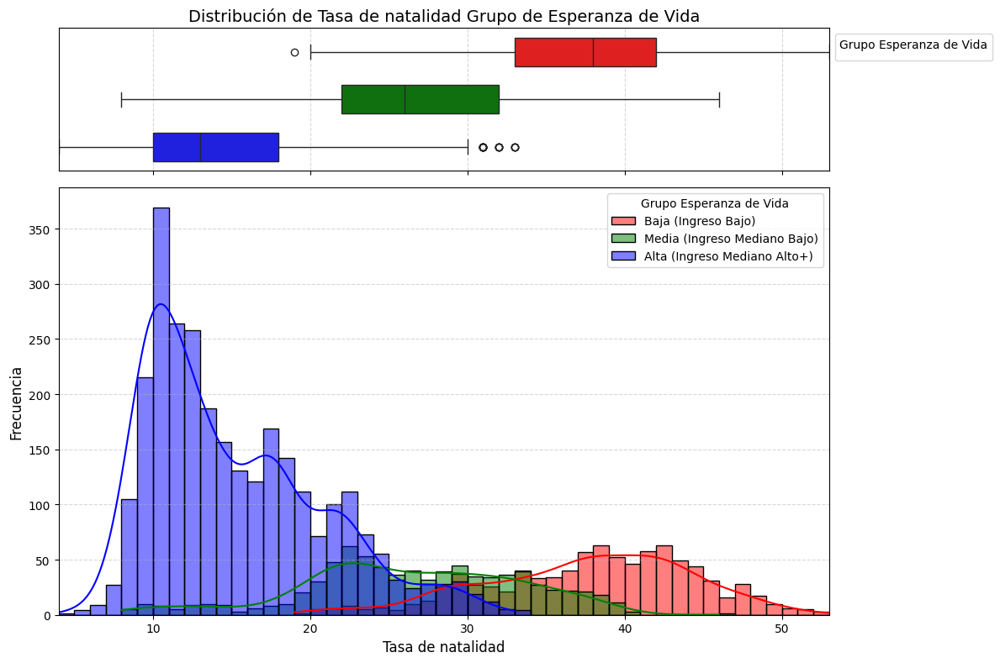

In [37]:
# Crear la figura y los ejes
fig, (ax_box, ax_hist) = plt.subplots(2, 1, figsize=(12, 8), sharex=True, gridspec_kw={'height_ratios': [1, 3]})

# Colores por grupo
colors = {'Baja (Ingreso Bajo)': 'red', 'Media (Ingreso Mediano Bajo)': 'green', 'Alta (Ingreso Mediano Alto+)': 'blue'}

# Boxplot
#sns.boxplot(data=df_imputed, x='PIB per cápita', y='Grupo Esperanza de Vida', hue='Grupo Esperanza de Vida',
sns.boxplot(data=df_imputed, x='Tasa de natalidad', y='Grupo Esperanza de Vida', hue='Grupo Esperanza de Vida',
            palette=colors, ax=ax_box, dodge=False, width=0.6)
ax_box.set_xlabel('')
ax_box.set_ylabel('')
ax_box.set(yticks=[])
ax_box.grid(axis='x', linestyle='--', alpha=0.5)
ax_box.set_title('Distribución de Tasa de natalidad Grupo de Esperanza de Vida', fontsize=14)
ax_box.legend(title='Grupo Esperanza de Vida', loc='upper left', bbox_to_anchor=(1, 1))

# Definir bins adecuados basados en los datos
min_value = df_imputed['Tasa de natalidad'].min()
max_value = df_imputed['Tasa de natalidad'].max()
bins = np.linspace(min_value, max_value, 50)  # Se generan 60 bins equidistantes

# Histogramas con mejor escala y bins
for grupo, color in colors.items():
    subset = df_imputed[df_imputed['Grupo Esperanza de Vida'] == grupo]
    sns.histplot(data=subset, x='Tasa de natalidad', color=color, label=grupo,
                 kde=True, ax=ax_hist, alpha=0.5, bins=bins)

# Ajustes del eje X
ax_hist.set_xlim(min_value, max_value)  # Limita la escala para evitar espacios innecesarios
ax_hist.set_xlabel('Tasa de natalidad', fontsize=12)
ax_hist.set_ylabel('Frecuencia', fontsize=12)
ax_hist.legend(title='Grupo Esperanza de Vida', loc='upper right')
ax_hist.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

### **🌍 Países con Alta Tasa de Natalidad pero Baja Esperanza de Vida**
### Los países con una tasa de natalidad muy alta pero una baja esperanza de vida suelen enfrentar desafíos estructurales profundos que afectan la salud y el bienestar de su población. Algunas de las razones clave incluyen:

### 🔑 1️⃣ Alta Mortalidad Infantil y Materna
### En estos países, el alto número de nacimientos se ve acompañado de una elevada mortalidad infantil debido a la falta de acceso a atención médica adecuada, desnutrición y enfermedades prevenibles.
### También hay altas tasas de mortalidad materna debido a la falta de atención prenatal y complicaciones en el parto sin asistencia médica adecuada.
### 📍 Ejemplo: Níger, Chad, República Centroafricana
### 💰 2️⃣ Pobreza Extrema y Bajo Desarrollo Humano
### Las familias tienen más hijos como una estrategia de supervivencia, ya que en muchas sociedades agrícolas y rurales los hijos representan una fuente de trabajo y seguridad en la vejez.
### La falta de acceso a educación y planificación familiar hace que las tasas de natalidad se mantengan altas.
### Infraestructura sanitaria deficiente significa que, aunque nacen muchos niños, una gran parte de ellos no llega a la edad adulta.
### 📍 Ejemplo: Somalia, Sudán del Sur
### 🏥 3️⃣ Enfermedades Endémicas y Desnutrición
### Alta prevalencia de enfermedades infecciosas como malaria, VIH/SIDA, tuberculosis y diarreas crónicas reducen drásticamente la esperanza de vida.
### La desnutrición infantil y materna es un problema grave que impacta el desarrollo de los niños y aumenta la mortalidad temprana.
### 📍 Ejemplo: Mali, Mozambique
### 🔫 4️⃣ Guerras, Conflictos y Violencia
### Países en conflicto armado o con violencia extrema tienen altas tasas de nacimientos, ya que las familias buscan asegurar su descendencia en entornos inseguros.
### Sin embargo, la esperanza de vida es baja debido a muertes violentas, desplazamiento forzado y crisis humanitarias.
### 📍 Ejemplo: Afganistán, República Democrática del Congo
### 🎓 5️⃣ Falta de Educación y Acceso a Anticonceptivos
### En muchos de estos países, la educación formal es limitada, especialmente para las mujeres.
### Sin acceso a métodos anticonceptivos y servicios de planificación familiar, las tasas de natalidad se mantienen altas.
### 📍 Ejemplo: Angola, Burkina Faso

## **📊 7 Histograma y Boxplot de Tasa de mortalidad**

### La tasa de mortalidad mide el número de defunciones en un país durante un año por cada 1,000 habitantes. Es un indicador demográfico crucial para analizar la salud pública, la calidad de vida y el envejecimiento de la población.

### 📌 **¿Por qué es un Indicador Importante?**
### 1️⃣ **Refleja la calidad del sistema de salud**

### Baja mortalidad → Países con buen acceso a servicios de salud, agua potable y nutrición.
### Alta mortalidad → Puede indicar conflictos, epidemias, pobreza extrema o sistemas de salud deficientes.
### 2️⃣ **Relacionado con la estructura demográfica**

### Países envejecidos (ej. Japón, Alemania) tienen tasas de mortalidad más altas porque hay más personas mayores.
### Países jóvenes (ej. Nigeria, India) tienen tasas de mortalidad más bajas si la salud infantil y adulta es buena.
### 3️⃣**Impacta en las políticas públicas**

### Alta mortalidad → Inversión en salud, infraestructura sanitaria y reducción de enfermedades infecciosas.
### Baja mortalidad → Puede llevar a desafíos en el sistema de pensiones y envejecimiento poblacional.


<ipython-input-38-9709fce3c205>:16: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax_box.legend(title='Grupo Esperanza de Vida', loc='upper left', bbox_to_anchor=(1, 1))


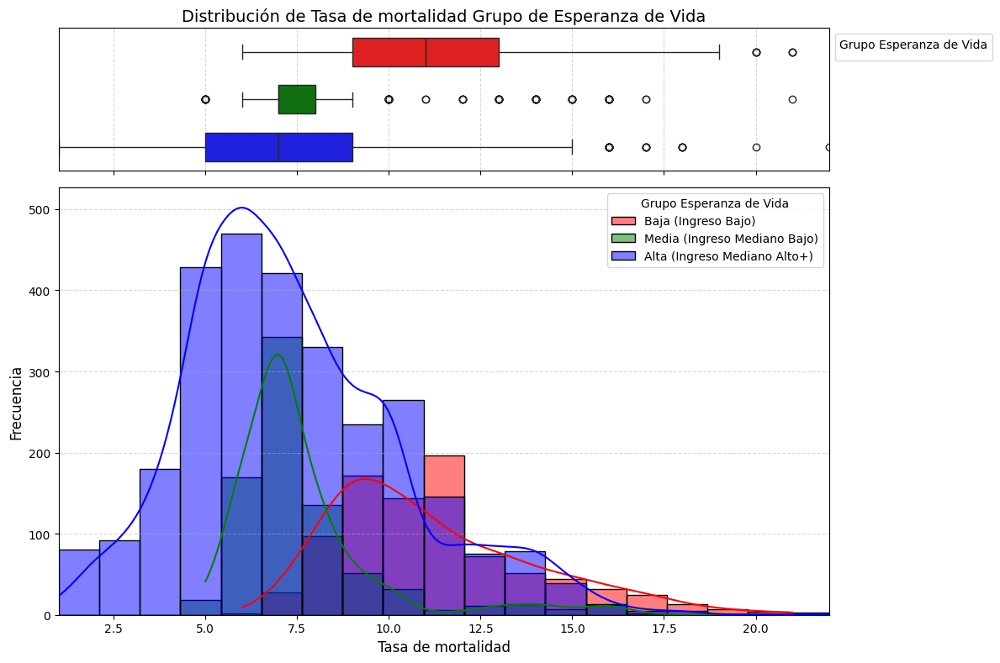

In [38]:
# Crear la figura y los ejes
fig, (ax_box, ax_hist) = plt.subplots(2, 1, figsize=(12, 8), sharex=True, gridspec_kw={'height_ratios': [1, 3]})

# Colores por grupo
colors = {'Baja (Ingreso Bajo)': 'red', 'Media (Ingreso Mediano Bajo)': 'green', 'Alta (Ingreso Mediano Alto+)': 'blue'}

# Boxplot
#sns.boxplot(data=df_imputed, x='PIB per cápita', y='Grupo Esperanza de Vida', hue='Grupo Esperanza de Vida',
sns.boxplot(data=df_imputed, x='Tasa de mortalidad', y='Grupo Esperanza de Vida', hue='Grupo Esperanza de Vida',
            palette=colors, ax=ax_box, dodge=False, width=0.6)
ax_box.set_xlabel('')
ax_box.set_ylabel('')
ax_box.set(yticks=[])
ax_box.grid(axis='x', linestyle='--', alpha=0.5)
ax_box.set_title('Distribución de Tasa de mortalidad Grupo de Esperanza de Vida', fontsize=14)
ax_box.legend(title='Grupo Esperanza de Vida', loc='upper left', bbox_to_anchor=(1, 1))

# Definir bins adecuados basados en los datos
min_value = df_imputed['Tasa de mortalidad'].min()
max_value = df_imputed['Tasa de mortalidad'].max()
bins = np.linspace(min_value, max_value, 20)  # Se generan 60 bins equidistantes

# Histogramas con mejor escala y bins
for grupo, color in colors.items():
    subset = df_imputed[df_imputed['Grupo Esperanza de Vida'] == grupo]
    sns.histplot(data=subset, x='Tasa de mortalidad', color=color, label=grupo,
                 kde=True, ax=ax_hist, alpha=0.5, bins=bins)

# Ajustes del eje X
ax_hist.set_xlim(min_value, max_value)  # Limita la escala para evitar espacios innecesarios
ax_hist.set_xlabel('Tasa de mortalidad', fontsize=12)
ax_hist.set_ylabel('Frecuencia', fontsize=12)
ax_hist.legend(title='Grupo Esperanza de Vida', loc='upper right')
ax_hist.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

## **📊 8 Histograma y Boxplot de (%) de Pobalacion con Baño

### Este indicador mide el porcentaje de la población que tiene acceso a instalaciones sanitarias mejoradas, es decir, baños con descarga, letrinas mejoradas o sistemas de saneamiento adecuados.

###  **🔹 ¿Por qué es importante?**

### 1️⃣ **Salud pública → La falta de acceso a baños adecuados contribuye a la propagación de enfermedades infecciosas como diarreas, cólera y parásitos intestinales.**
### 2️⃣ **Condiciones de vida → Un alto porcentaje indica buen acceso a servicios básicos, mientras que un porcentaje bajo refleja pobreza extrema y falta de infraestructura.**
### 3️⃣ **Impacto ambiental → Un saneamiento deficiente puede contaminar fuentes de agua y generar problemas ambientales.**



<ipython-input-39-54f9bf1e8593>:16: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax_box.legend(title='Grupo Esperanza de Vida', loc='upper left', bbox_to_anchor=(1, 1))


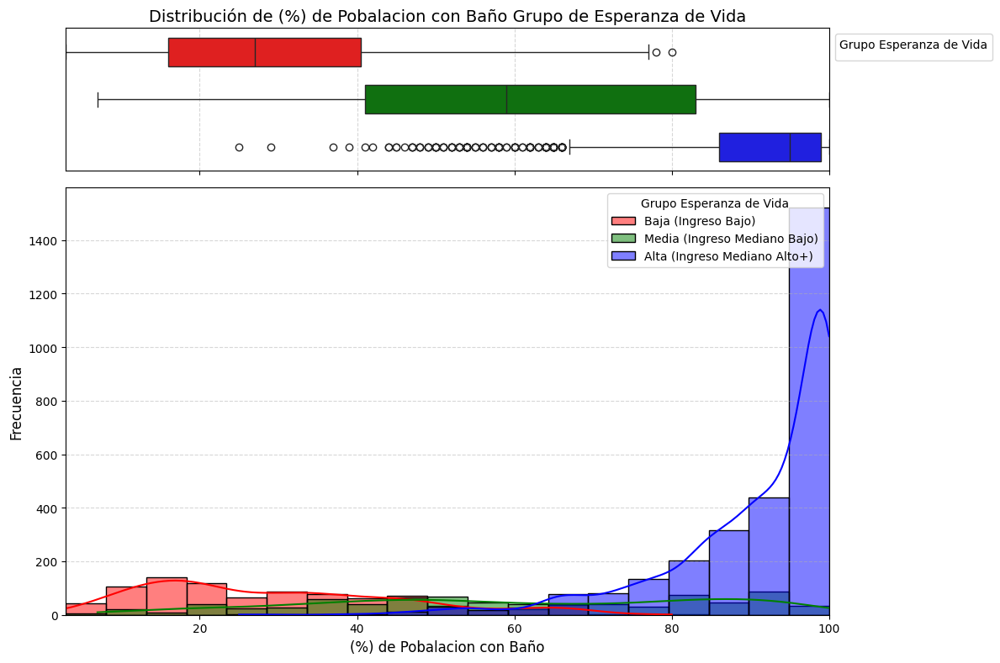

In [39]:
# Crear la figura y los ejes
fig, (ax_box, ax_hist) = plt.subplots(2, 1, figsize=(12, 8), sharex=True, gridspec_kw={'height_ratios': [1, 3]})

# Colores por grupo
colors = {'Baja (Ingreso Bajo)': 'red', 'Media (Ingreso Mediano Bajo)': 'green', 'Alta (Ingreso Mediano Alto+)': 'blue'}

# Boxplot
#sns.boxplot(data=df_imputed, x='PIB per cápita', y='Grupo Esperanza de Vida', hue='Grupo Esperanza de Vida',
sns.boxplot(data=df_imputed, x='(%) de Pobalacion con Baño', y='Grupo Esperanza de Vida', hue='Grupo Esperanza de Vida',
            palette=colors, ax=ax_box, dodge=False, width=0.6)
ax_box.set_xlabel('')
ax_box.set_ylabel('')
ax_box.set(yticks=[])
ax_box.grid(axis='x', linestyle='--', alpha=0.5)
ax_box.set_title('Distribución de (%) de Pobalacion con Baño Grupo de Esperanza de Vida', fontsize=14)
ax_box.legend(title='Grupo Esperanza de Vida', loc='upper left', bbox_to_anchor=(1, 1))

# Definir bins adecuados basados en los datos
min_value = df_imputed['(%) de Pobalacion con Baño'].min()
max_value = df_imputed['(%) de Pobalacion con Baño'].max()
bins = np.linspace(min_value, max_value, 20)  # Se generan 60 bins equidistantes

# Histogramas con mejor escala y bins
for grupo, color in colors.items():
    subset = df_imputed[df_imputed['Grupo Esperanza de Vida'] == grupo]
    sns.histplot(data=subset, x='(%) de Pobalacion con Baño', color=color, label=grupo,
                 kde=True, ax=ax_hist, alpha=0.5, bins=bins)

# Ajustes del eje X
ax_hist.set_xlim(min_value, max_value)  # Limita la escala para evitar espacios innecesarios
ax_hist.set_xlabel('(%) de Pobalacion con Baño', fontsize=12)
ax_hist.set_ylabel('Frecuencia', fontsize=12)
ax_hist.legend(title='Grupo Esperanza de Vida', loc='upper right')
ax_hist.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

In [40]:
valor_min_baño_alta = df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Alta (Ingreso Mediano Alto+)']['(%) de Pobalacion con Baño'].quantile(0.75) - 1.5*(df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Alta (Ingreso Mediano Alto+)']['(%) de Pobalacion con Baño'].quantile(0.75)-df_imputed[df_imputed['Grupo Esperanza de Vida'] == 'Alta (Ingreso Mediano Alto+)']['(%) de Pobalacion con Baño'].quantile(0.25))



# Imprimir resultados
print(f"El porcentaje de poblacioón con acceso al baño inferiro al quartil 25 es: {valor_min_baño_alta.round(3)}")
#print(f"El valor máximo de Mortalidad Infantil en países con Esperanza de Vida Media es: {valor_max_Mortalidad_infantil_media.round(3)}")
#print(f"El valor máximo de Mortalidad Infantil en países con Esperanza de Vida Alta es: {valor_max_Mortalidad_infantil_alta.round(3)}")


El porcentaje de poblacioón con acceso al baño inferiro al quartil 25 es: 79.5


In [41]:
# Filtrar países donde la tasa de vacunación infantil es menor al 86.5% dentro del grupo de Esperanza de Vida Alta
df_out8 = df_imputed[
    (df_imputed['Grupo Esperanza de Vida'] == 'Alta (Ingreso Mediano Alto+)') &
    (df_imputed['(%) de Pobalacion con Baño'] < 70.5)
].copy()

# Resetear índice para evitar desorden en los índices
df_out8.reset_index(drop=True, inplace=True)

# Obtener los países únicos en la columna 'Pais'
paises_unicos5 = df_out8['Pais'].unique()

# Mostrar los países en formato de lista numerada
print("🌍 Países que tienen menor acceso a baños que son del grupo de Esperanza de Vida Alta:\n")
for i, pais in enumerate(sorted(paises_unicos5), 1):
    print(f"{i}. {pais}")

🌍 Países que tienen menor acceso a baños que son del grupo de Esperanza de Vida Alta:

1. American Samoa
2. Bangladesh
3. Bhutan
4. Cabo Verde
5. Cambodia
6. China
7. Dominica
8. Ecuador
9. Guatemala
10. Honduras
11. India
12. Micronesia, Federated States of
13. Mongolia
14. Nicaragua
15. Panama
16. Paraguay
17. Peru
18. Philippines
19. Saint Vincent and the Grenadines
20. Vanuatu
21. Viet Nam


### **🌍 Países con Alta Esperanza de Vida pero Bajo Acceso a Baños**
### Esta combinación de factores puede parecer contradictoria, pero tiene explicaciones socioeconómicas y sanitarias específicas. Veamos las razones principales:

### **🏡 1️⃣ Infraestructura Sanitaria Deficiente en Zonas Rurales**
### Muchos de estos países tienen grandes poblaciones en zonas rurales donde la infraestructura de saneamiento es limitada o inexistente.
### Aunque las ciudades pueden tener sistemas de alcantarillado adecuados, en áreas rurales aún se usan letrinas rudimentarias o no hay acceso a baños adecuados.
### 📍 Ejemplo: Bangladesh, Cambodia, India, Guatemala, Honduras, Mongolia

### **🏥 2️⃣ Sistemas de Salud Enfocados en la Atención Médica**
### Aunque el acceso al saneamiento es bajo, estos países han invertido en atención médica primaria y programas de salud pública, lo que reduce la mortalidad y aumenta la esperanza de vida.
### Ejemplo: Campañas de vacunación, control de enfermedades infecciosas, acceso a medicamentos esenciales y mejoras en la atención materno-infantil.
### 📍 Ejemplo: China, Viet Nam, Perú, Bhutan

### **💰 3️⃣ Desarrollo Económico con Desigualdad**
### Algunos de estos países han experimentado crecimiento económico, pero con desigualdad en el acceso a servicios básicos.
### Las ciudades pueden tener acceso a saneamiento moderno, pero las poblaciones rurales siguen sin acceso a agua potable y baños adecuados.
### 📍 Ejemplo: Ecuador, Panamá, Paraguay, Filipinas

### **🏗️ 4️⃣ Falta de Inversión en Infraestructura de Saneamiento**
### En algunos países, el saneamiento no ha sido una prioridad en las políticas públicas, a pesar de mejoras en otros indicadores de salud.
### La falta de alcantarillado y sistemas de tratamiento de aguas sigue siendo un problema en ciertas regiones.
### 📍 Ejemplo: Dominica, Saint Vincent and the Grenadines, Vanuatu, Micronesia

### **🌍 5️⃣ Adaptación Cultural y Prácticas Tradicionales**
### En algunas culturas, el saneamiento adecuado no ha sido una prioridad histórica, y todavía hay prácticas de defecación al aire libre en comunidades rurales.
### Las campañas de concienciación y cambio de hábitos están ayudando a mejorar la situación, pero el progreso es lento.
### 📍 Ejemplo: India, Bangladesh, Cambodia, Mongolia

## **📊 9 Histograma y Boxplot de (%) de Desempleo total (%)**

### El desempleo total mide el porcentaje de la población económicamente activa que no tiene trabajo pero está buscando activamente empleo.

### **🔹 Factores que influyen en el desempleo**
### 1️⃣ Crecimiento económico → Cuando la economía crece, se crean más empleos y el desempleo disminuye.
### 2️⃣ Educación y capacitación → Mayores niveles de educación y formación laboral reducen el desempleo estructural.
### 3️⃣ Política gubernamental → Regulaciones laborales, impuestos y políticas de incentivo afectan la generación de empleo.
### 4️⃣ Crisis económicas o conflictos → Guerras, recesiones y crisis políticas aumentan la tasa de desempleo.


<ipython-input-42-05abd7708155>:16: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax_box.legend(title='Grupo Esperanza de Vida', loc='upper left', bbox_to_anchor=(1, 1))


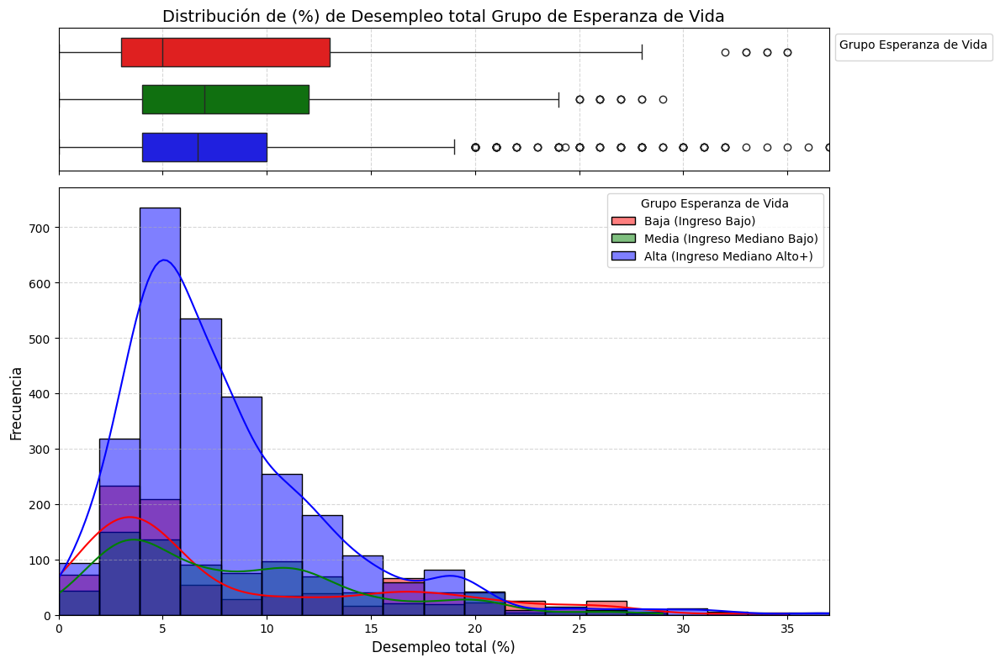

In [42]:
# Crear la figura y los ejes
fig, (ax_box, ax_hist) = plt.subplots(2, 1, figsize=(12, 8), sharex=True, gridspec_kw={'height_ratios': [1, 3]})

# Colores por grupo
colors = {'Baja (Ingreso Bajo)': 'red', 'Media (Ingreso Mediano Bajo)': 'green', 'Alta (Ingreso Mediano Alto+)': 'blue'}

# Boxplot
#sns.boxplot(data=df_imputed, x='PIB per cápita', y='Grupo Esperanza de Vida', hue='Grupo Esperanza de Vida',
sns.boxplot(data=df_imputed, x='Desempleo total (%)', y='Grupo Esperanza de Vida', hue='Grupo Esperanza de Vida',
            palette=colors, ax=ax_box, dodge=False, width=0.6)
ax_box.set_xlabel('')
ax_box.set_ylabel('')
ax_box.set(yticks=[])
ax_box.grid(axis='x', linestyle='--', alpha=0.5)
ax_box.set_title('Distribución de (%) de Desempleo total Grupo de Esperanza de Vida', fontsize=14)
ax_box.legend(title='Grupo Esperanza de Vida', loc='upper left', bbox_to_anchor=(1, 1))

# Definir bins adecuados basados en los datos
min_value = df_imputed['Desempleo total (%)'].min()
max_value = df_imputed['Desempleo total (%)'].max()
bins = np.linspace(min_value, max_value, 20)  # Se generan 60 bins equidistantes

# Histogramas con mejor escala y bins
for grupo, color in colors.items():
    subset = df_imputed[df_imputed['Grupo Esperanza de Vida'] == grupo]
    sns.histplot(data=subset, x='Desempleo total (%)', color=color, label=grupo,
                 kde=True, ax=ax_hist, alpha=0.5, bins=bins)

# Ajustes del eje X
ax_hist.set_xlim(min_value, max_value)  # Limita la escala para evitar espacios innecesarios
ax_hist.set_xlabel('Desempleo total (%)', fontsize=12)
ax_hist.set_ylabel('Frecuencia', fontsize=12)
ax_hist.legend(title='Grupo Esperanza de Vida', loc='upper right')
ax_hist.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

## 📊**Conclusiones del Análisis de los Outliers.**

### Cada outlier invesitigado corresponde a situaciones como guerras, pandemias, o crísis ecónomicas que afectan a cada pías.

### Por ahora no se van a tocar los Outliers.

### Durante la prueba de los Modelos de Machine Learning se irá analizando el comportamiento del modelo.

### Para trabajar sobre el modelo de Machine learning, algunas estrategias a tomar van a ser las siguientes:

###📌 1- Dado que se trabaja con variables con diferente escala, en primera instancia se va a escalar los datos.

### 📌 2- Al tener distribuciones asimétricas, generando copias del dataset, se va a trabajar sobre cada una para normalizarlas (logaridmo, Z-SCORE, etc).

### 📌3- En caso de no tener buenos resultados en el modelado, probar el modelo eliminando los paises muy ricos (paraísos fiscales por ejemplo).


# 💡 INSIGHTS
### Pruebas de hipótesis en base a los indicadores utilizados.

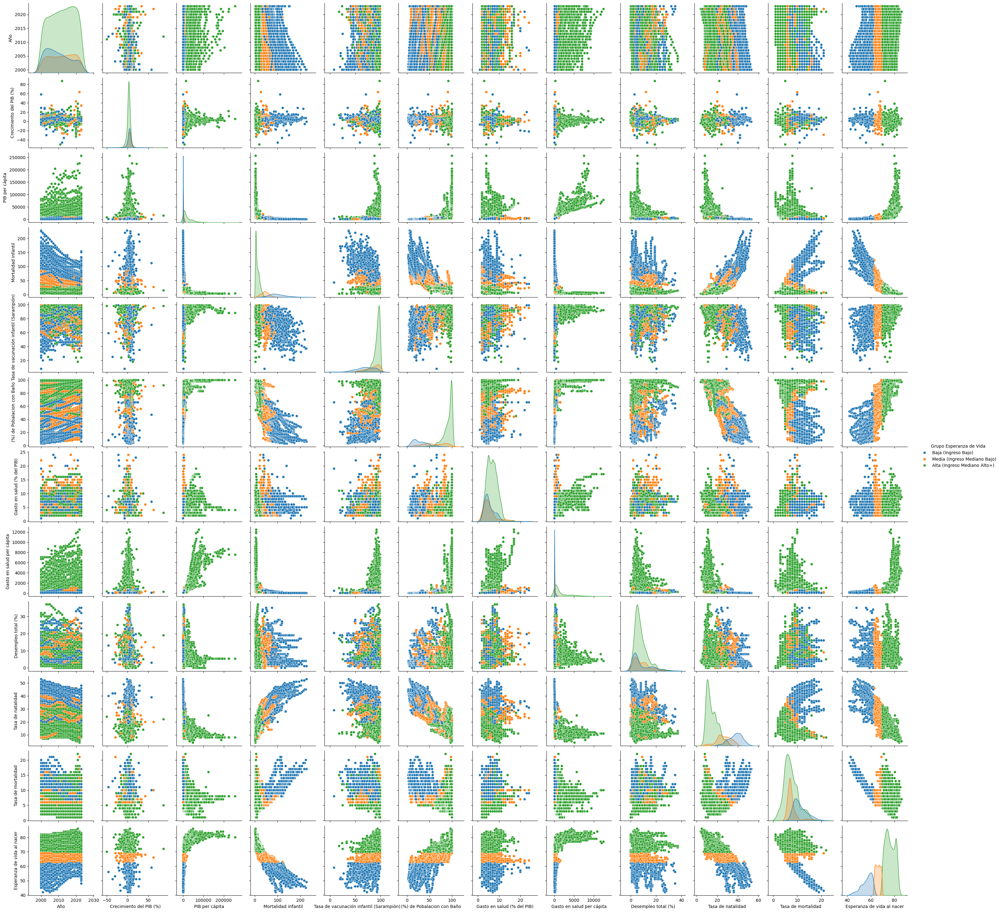

In [43]:
# Elimino la advertencias de tipo FutureWarning
warnings.simplefilter(action='ignore', category=FutureWarning)

colores= ["#FF6347","#87CEEB"]  #defino los colores de cada sección del gráfico
sns.pairplot(df_imputed, hue="Grupo Esperanza de Vida", diag_kind='kde')
plt.show()

## 🧪 Hipótesis 1
### Los países con mayor PBI per cápita tienen un menor mortalidada infaltil y una esperanza de vida mayor

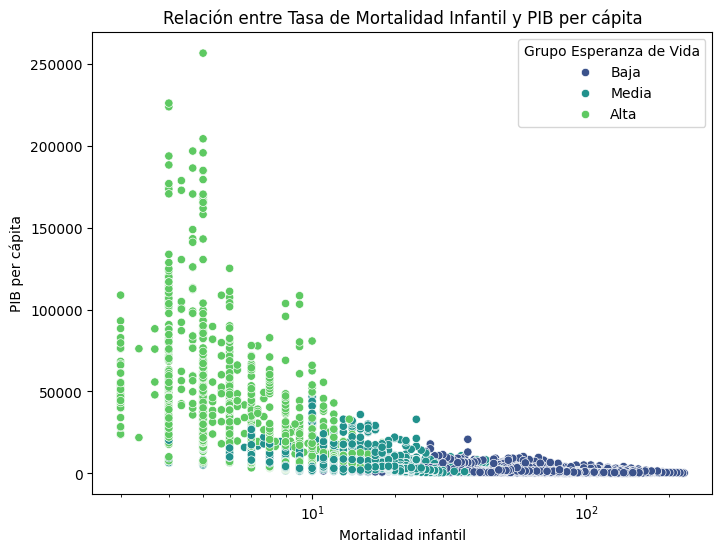

In [44]:
df_imputed5= df_imputed

# Crear categorías de Tasa de natalidad en 3 grupos
df_imputed5["Grupo Natalidad"] = pd.qcut(df_imputed["Tasa de natalidad"], q=3, labels=["Baja", "Media", "Alta"])
df_imputed5["Grupo Esperanza de Vida"] = pd.qcut(df_imputed["Esperanza de vida al nacer"], q=3, labels=["Baja", "Media", "Alta"])
df_imputed5["Grupo PIB per cápita"] = pd.qcut(df_imputed["PIB per cápita"], q=3, labels=["Baja", "Media", "Alta"])
df_imputed5["Grupo PBI Salud per capita"] = pd.qcut(df_imputed["Gasto en salud per cápita"], q=3, labels=["Baja", "Media", "Alta"])
# Graficar con color según el grupo de natalidad
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df_imputed5, x="Mortalidad infantil", y="PIB per cápita", hue="Grupo Esperanza de Vida", palette="viridis")

plt.xscale("log")
plt.title("Relación entre Tasa de Mortalidad Infantil y PIB per cápita")
plt.show()


### **📊 Observaciones:**

### Cuanto menor sea la inversion del PBI per capita, existe una aumento de la mortalidad infantil.
### Esto se da particularmente en pasies con una baja esperanza de vida.



## 🧪 Hipótesis 2
### Los países con mayor tasa de Natalidad y mayor tasa de mortalidad son los que tienen menor esperanza de vida.

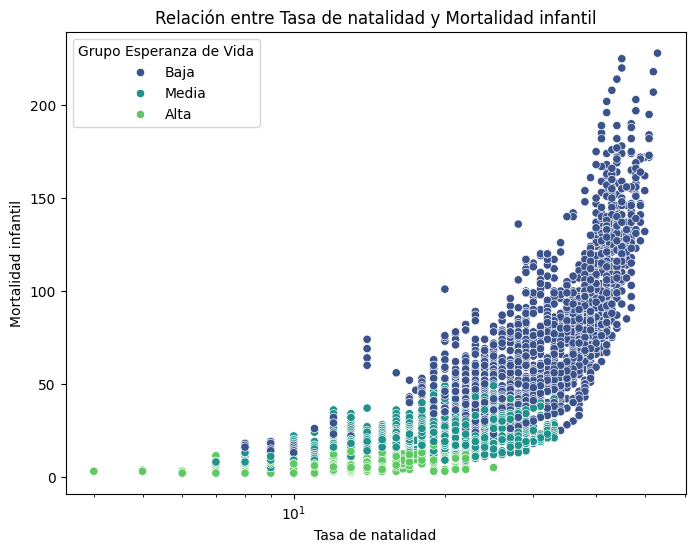

In [45]:
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df_imputed5, x="Tasa de natalidad", y="Mortalidad infantil", hue="Grupo Esperanza de Vida", palette="viridis")

plt.xscale("log")
plt.title("Relación entre Tasa de natalidad y Mortalidad infantil")
plt.show()

### **📊 Observaciones:**

### Una alta tasa de natalidad y mortalidad es un fenómeno que se da mayor mente en pases con un bajo desarrollo economico/social. Como se puede observar, a mayor tasa de natalidad y mortalidad, se tiene una baja esperanza de vida.


## **🧪 Hipótesis 3**
### Los paises con mayor gasto de su PBI en salud, tienen una población menor mortalidad infantil y mayor esperanza de vida.

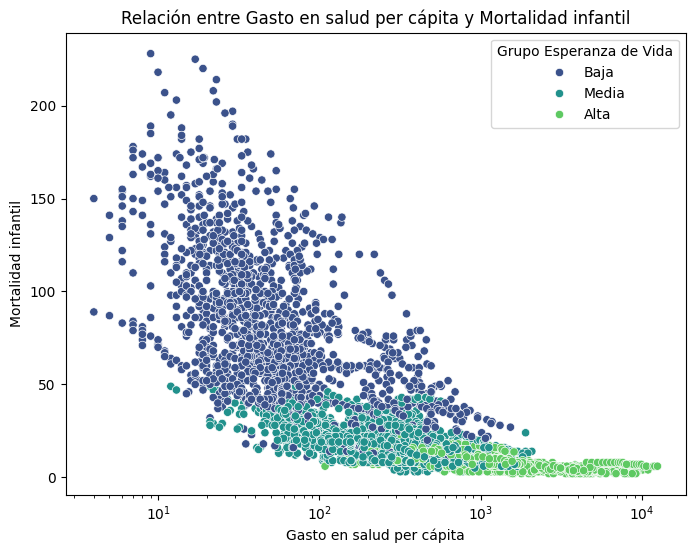

In [46]:

plt.figure(figsize=(8, 6))
sns.scatterplot(data=df_imputed5, x="Gasto en salud per cápita", y="Mortalidad infantil", hue="Grupo Esperanza de Vida", palette="viridis")

plt.xscale("log")
plt.title("Relación entre Gasto en salud per cápita y Mortalidad infantil")
plt.show()


### **📊 Observaciones:**

### Paises que inverten más en salud, tienen menor mortalidad infantil.
### Se debe considerar que paises pobres que invierten mayor % de su PBI en salud, sigue siendo un monto bajo para cubrir todas sus necesidades.


## **🧪 Hipótesis 4**

### Los paises con mayor PIB per cápita tiene una mayor esperanza de vida al nacer.


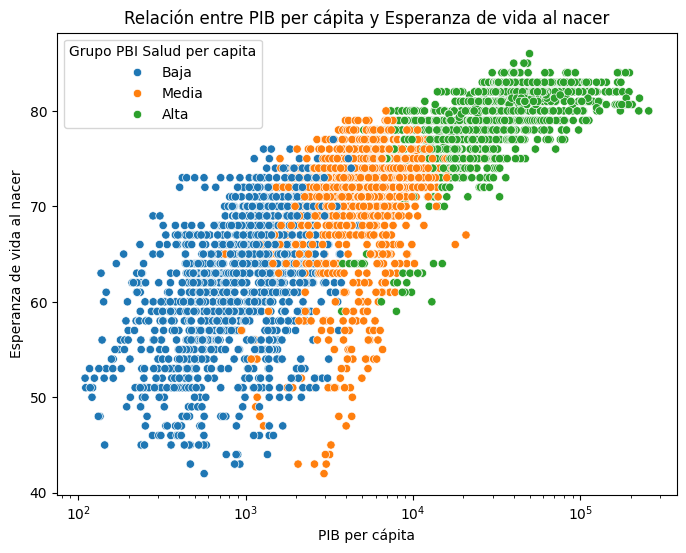

In [47]:
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df_imputed5, x="PIB per cápita", y="Esperanza de vida al nacer", hue="Grupo PBI Salud per capita")
plt.xscale("log")
plt.title("Relación entre PIB per cápita y Esperanza de vida al nacer")
plt.show()

### **📊 Observaciones:**

### Cuanto mayor se el PBI per capita, mayor es la esperanza de via.


## **🧪 Hipótesis 5**

### Los paises con mayor Esperanza de vida al nacer tienen una menor mortalidad infantil.

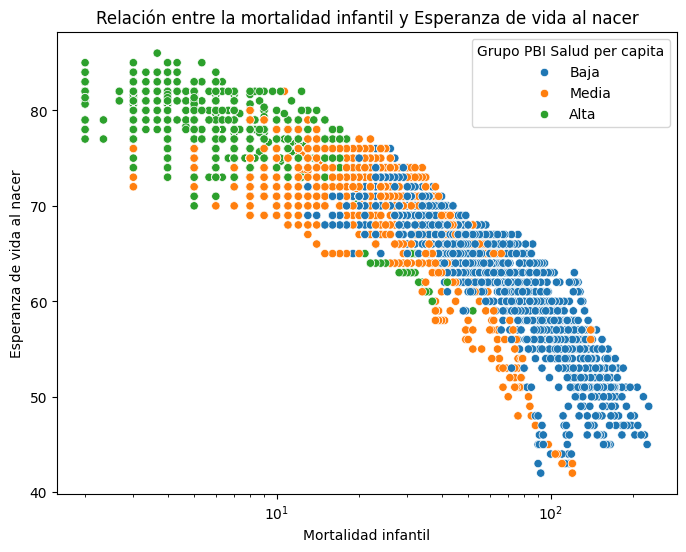

In [48]:
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df_imputed5, x="Mortalidad infantil", y="Esperanza de vida al nacer", hue="Grupo PBI Salud per capita")
plt.xscale("log")
plt.title("Relación entre la mortalidad infantil y Esperanza de vida al nacer")
plt.show()

### **📊 Observaciones:**

### Los países con mayor mortalidad infantil, son los que presentan una baja espranza de vida.

### **Importación de Librerías para trabajar con distintos modelos de Machine Learning.**


In [49]:
import seaborn as sns
from sklearn.metrics import mean_squared_error as mse
from sklearn.pipeline import Pipeline
from sklearn.preprocessing  import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn import datasets, linear_model

from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# *Correlación de variables*

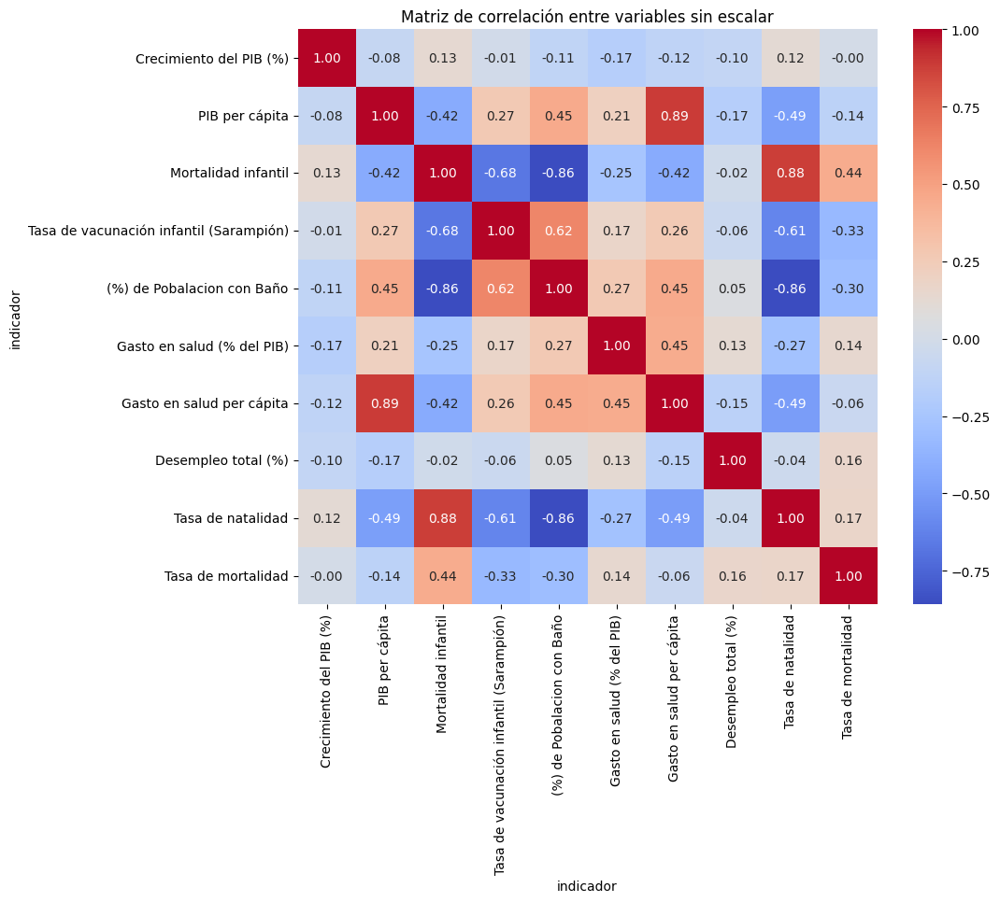

In [50]:
# 🔹 1. Eliminar las columnas no numéricas antes de la correlación
df_ML = df_imputed.drop(columns=["Esperanza de vida al nacer","Pais", "Año", "Grupo Natalidad", "Grupo Esperanza de Vida", "Grupo PIB per cápita","Grupo PBI Salud per capita"], errors="ignore")

# 🔹 2. Calcular la matriz de correlación
correlation_matrix0 = df_ML.corr()

# 🔹 3. Graficar el heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix0, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Matriz de correlación entre variables sin escalar")
plt.show()

## *VIF de variables sin escalar*

In [51]:
import pandas as pd
from sklearn.linear_model import LinearRegression

# 🔹 1. Eliminar columnas categóricas y la variable objetivo
cols_to_drop = ["Pais","Esperanza de vida al nacer", "Año", "Grupo Natalidad", "Grupo Esperanza de Vida", "Grupo PIB per cápita","Grupo PBI Salud per capita"]
data_ = df_ML.drop(columns=cols_to_drop, errors="ignore")  # Ignora si alguna columna no existe

# 🔹 2. Calcular VIF manualmente
vif_manual = {}

for feature in data_.columns:
    y = data_[feature]  # Variable dependiente
    X = data_.drop(columns=[feature])  # Variables independientes

    if X.shape[1] == 0:  # Evitar errores si X queda vacío
        continue

    model = LinearRegression().fit(X, y)  # Ajustar modelo de regresión
    r_squared = model.score(X, y)  # Obtener R²

    vif = 1 / (1 - r_squared) if r_squared < 1 else float("inf")  # Evitar división por cero
    vif_manual[feature] = vif

# 🔹 3. Convertir a DataFrame para visualizar mejor
vif_manual_df0 = pd.DataFrame(list(vif_manual.items()), columns=['Feature', 'VIF'])

# Ordenar de mayor a menor VIF para ver las variables más problemáticas
vif_manual_df0 = vif_manual_df0.sort_values(by="VIF", ascending=False) # Changed vif_manual_df to vif_manual_df0

# Mostrar el resultado
print(vif_manual_df0)

                                   Feature       VIF
2                      Mortalidad infantil  8.742599
8                        Tasa de natalidad  7.459123
6                Gasto en salud per cápita  7.314324
1                           PIB per cápita  6.233055
4               (%) de Pobalacion con Baño  4.803778
3  Tasa de vacunación infantil (Sarampión)  1.928370
9                       Tasa de mortalidad  1.897225
5               Gasto en salud (% del PIB)  1.736385
7                      Desempleo total (%)  1.140678
0                  Crecimiento del PIB (%)  1.058938


## *Separación de los datos en Train y Test*

In [52]:
x = df_imputed.drop(columns=["Pais","Esperanza de vida al nacer","Grupo Esperanza de Vida", "Año", "Grupo Natalidad", "Grupo Esperanza de Vida", "Grupo PIB per cápita","Grupo PBI Salud per capita"])
#x = df_imputed.drop(columns=["Pais","Esperanza de vida al nacer", "Año"])

y = df_imputed['Esperanza de vida al nacer']

In [53]:
#Separo los datos de "train" en entrenamiento y prueba "test" para probar los algoritmos
X_train, x_test, Y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

# *PRUEBA FULL METAL JACKET*


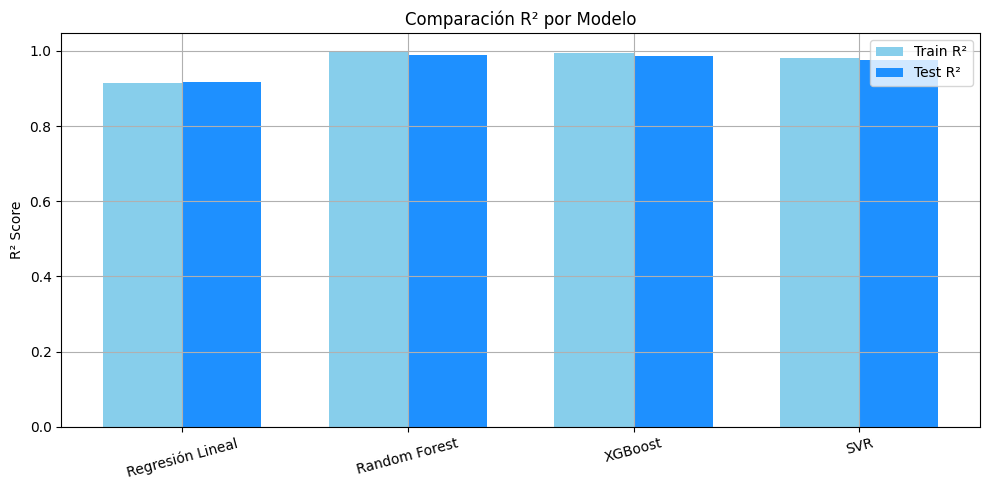

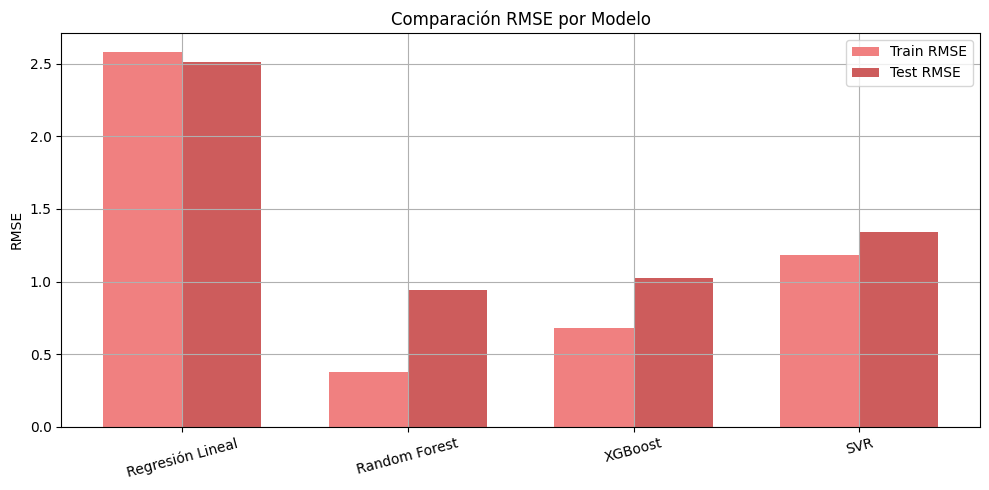

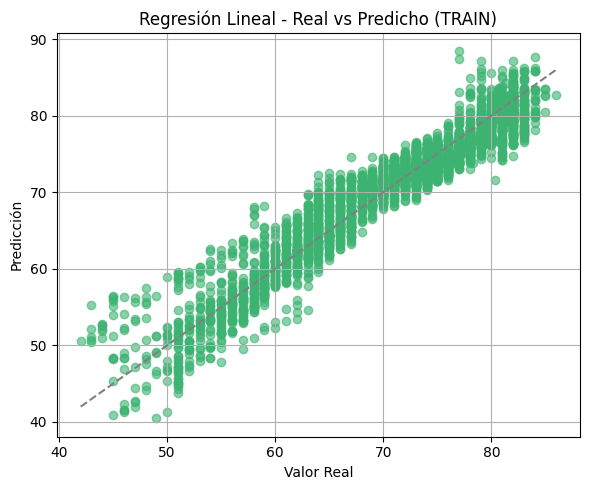

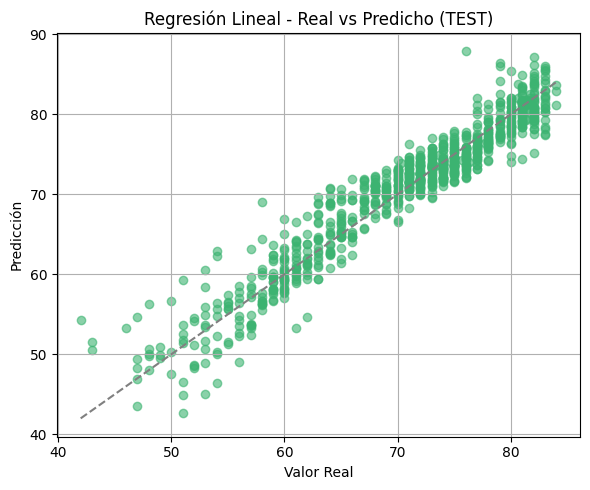

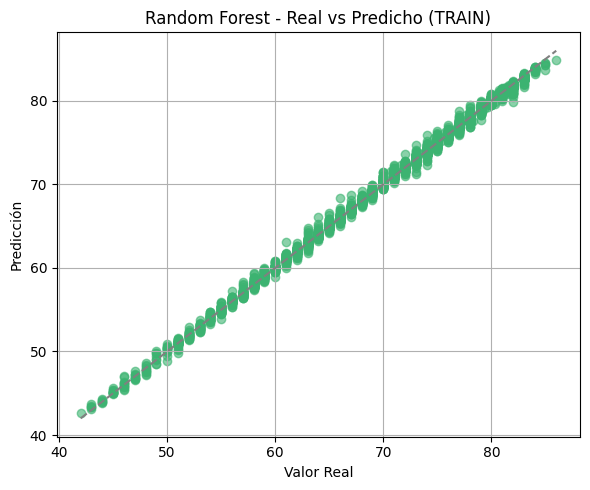

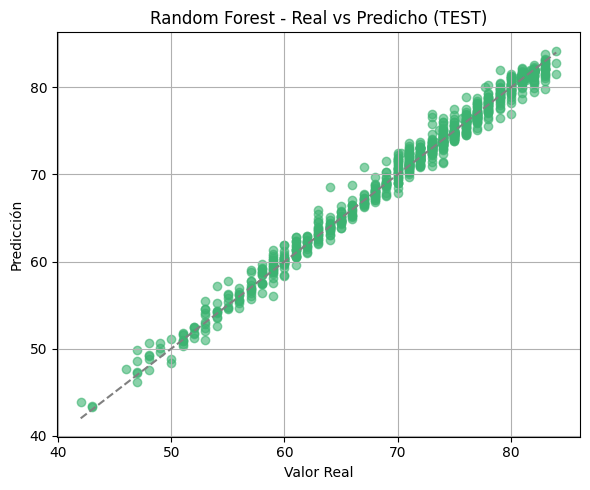

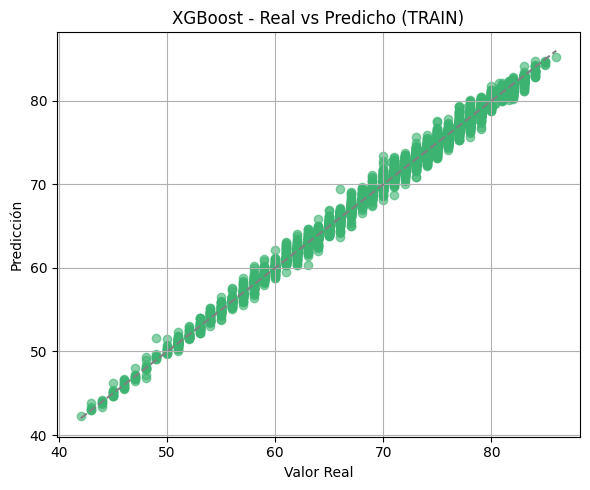

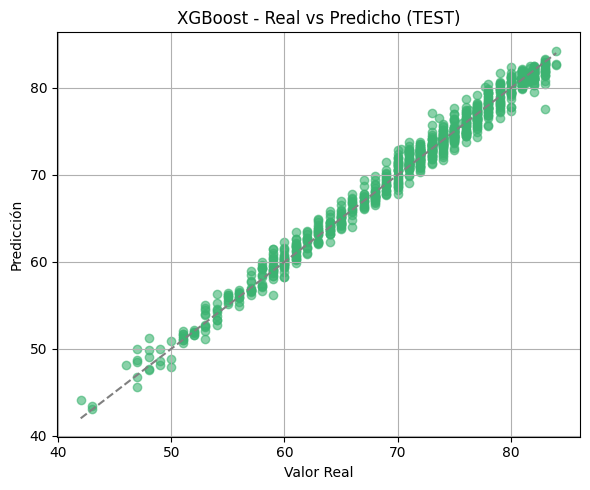

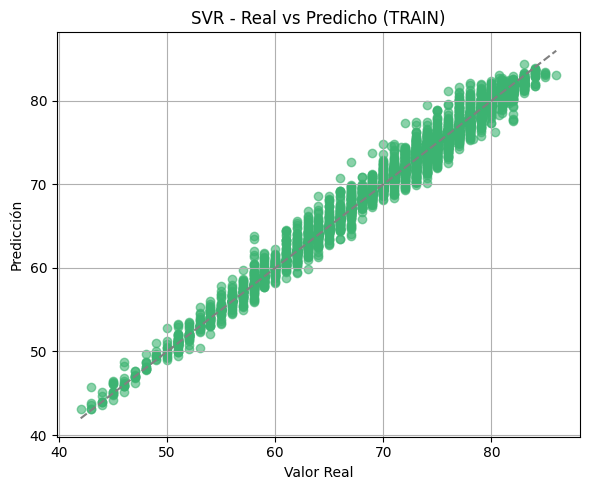

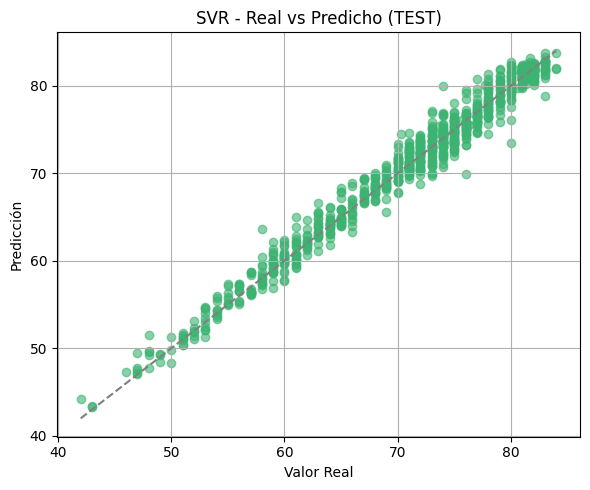


📊 Mejores hiperparámetros encontrados:
Random Forest: {'regressor__max_depth': None, 'regressor__n_estimators': 200}
XGBoost: {'regressor__learning_rate': 0.1, 'regressor__max_depth': 5, 'regressor__n_estimators': 200}
SVR: {'regressor__C': 10, 'regressor__epsilon': 0.1, 'regressor__kernel': 'rbf'}


In [ ]:
# 📦 Librerías
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score, mean_squared_error

# 📌 Diccionario para guardar resultados, predicciones y mejores hiperparámetros
resultados = []
predicciones = {}
mejores_hiperparametros = {}

# ✅ Función de evaluación
def evaluar_modelo(nombre, modelo, X_train, y_train, X_test, y_test):
    y_train_pred = modelo.predict(X_train)
    y_test_pred = modelo.predict(X_test)

    r2_train = r2_score(y_train, y_train_pred)
    r2_test = r2_score(y_test, y_test_pred)

    rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred)) # Changed Y_train to y_train
    rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))

    resultados.append({
        "modelo": nombre,
        "r2_train": r2_train,
        "r2_test": r2_test,
        "rmse_train": rmse_train,
        "rmse_test": rmse_test
    })

    predicciones[nombre] = {
        "train": (y_train, y_train_pred),
        "test": (y_test, y_test_pred)
    }

# ✅ Regresión Lineal con Pipeline
pipeline_lr = Pipeline([
    ('scaler', StandardScaler()),
    ('regressor', LinearRegression())
])

pipeline_lr.fit(X_train, Y_train)
evaluar_modelo("Regresión Lineal", pipeline_lr, X_train, Y_train, x_test, y_test) # Changed y_train to Y_train to match train_test_split output


# ✅ Random Forest con GridSearchCV
pipeline_rf = Pipeline([
    ('scaler', StandardScaler()),
    ('regressor', RandomForestRegressor(random_state=42))
])

param_rf = {
    'regressor__n_estimators': [100, 200],
    'regressor__max_depth': [None, 5, 10]
}

grid_rf = GridSearchCV(pipeline_rf, param_rf, cv=3, scoring='r2', n_jobs=-1)
grid_rf.fit(X_train, Y_train) # Changed y_train to Y_train to match train_test_split output
mejores_hiperparametros["Random Forest"] = grid_rf.best_params_

evaluar_modelo("Random Forest", grid_rf.best_estimator_, X_train, Y_train, x_test, y_test) # Changed y_train to Y_train to match train_test_split output


# ✅ XGBoost con GridSearchCV
pipeline_xgb = Pipeline([
    ('scaler', StandardScaler()),
    ('regressor', XGBRegressor(random_state=42, verbosity=0))
])

param_xgb = {
    'regressor__n_estimators': [100, 200],
    'regressor__max_depth': [3, 5],
    'regressor__learning_rate': [0.05, 0.1]
}

grid_xgb = GridSearchCV(pipeline_xgb, param_xgb, cv=3, scoring='r2', n_jobs=-1)
grid_xgb.fit(X_train, Y_train) # Changed y_train to Y_train to match train_test_split output
mejores_hiperparametros["XGBoost"] = grid_xgb.best_params_

evaluar_modelo("XGBoost", grid_xgb.best_estimator_, X_train, Y_train, x_test, y_test) # Changed y_train to Y_train to match train_test_split output


# ✅ SVR con GridSearchCV
pipeline_svr = Pipeline([
    ('scaler', StandardScaler()),
    ('regressor', SVR())
])

param_svr = {
    'regressor__kernel': ['rbf', 'linear'],
    'regressor__C': [0.1, 1, 10],
    'regressor__epsilon': [0.01, 0.1]
}

grid_svr = GridSearchCV(pipeline_svr, param_svr, cv=3, scoring='r2', n_jobs=-1)
grid_svr.fit(X_train, Y_train) # Changed y_train to Y_train to match train_test_split output
mejores_hiperparametros["SVR"] = grid_svr.best_params_

evaluar_modelo("SVR", grid_svr.best_estimator_, X_train, Y_train, x_test, y_test) # Changed y_train to Y_train to match train_test_split output

# ✅ Convertir resultados en DataFrame
df_resultados = pd.DataFrame(resultados)

# ✅ Gráfico comparativo R²
x = np.arange(len(df_resultados['modelo']))
bar_width = 0.35

plt.figure(figsize=(10, 5))
plt.bar(x - bar_width/2, df_resultados['r2_train'], width=bar_width, label='Train R²', color='skyblue')
plt.bar(x + bar_width/2, df_resultados['r2_test'], width=bar_width, label='Test R²', color='dodgerblue')
plt.xticks(x, df_resultados['modelo'], rotation=15)
plt.ylabel('R² Score')
plt.title('Comparación R² por Modelo')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# ✅ Gráfico comparativo RMSE
plt.figure(figsize=(10, 5))
plt.bar(x - bar_width/2, df_resultados['rmse_train'], width=bar_width, label='Train RMSE', color='lightcoral')
plt.bar(x + bar_width/2, df_resultados['rmse_test'], width=bar_width, label='Test RMSE', color='indianred')
plt.xticks(x, df_resultados['modelo'], rotation=15)
plt.ylabel('RMSE')
plt.title('Comparación RMSE por Modelo')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# ✅ Gráficos Real vs Predicho para cada modelo
for nombre, datos in predicciones.items():
    for tipo in ['train', 'test']:
        y_real, y_pred = datos[tipo]
        plt.figure(figsize=(6, 5))
        plt.scatter(y_real, y_pred, alpha=0.6, color='mediumseagreen')
        plt.plot([y_real.min(), y_real.max()], [y_real.min(), y_real.max()], '--', color='gray')
        plt.xlabel('Valor Real')
        plt.ylabel('Predicción')
        plt.title(f'{nombre} - Real vs Predicho ({tipo.upper()})')
        plt.grid(True)
        plt.tight_layout()
        plt.show()

# ✅ Mostrar mejores hiperparámetros
print("\n📊 Mejores hiperparámetros encontrados:")
for modelo, params in mejores_hiperparametros.items():
    print(f"{modelo}: {params}")


# *REGRESION LINEAL*

In [112]:
modelo = Pipeline([('scaler', StandardScaler()),('features', PolynomialFeatures()),
                    ('regression', LinearRegression(fit_intercept=True))])

hiperparametros={'features__degree':[1,2,3,4]}

grilla=GridSearchCV(modelo,hiperparametros, cv=5,scoring='neg_root_mean_squared_error')
grilla.fit(X_train,Y_train)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('features', PolynomialFeatures()),
                                       ('regression', LinearRegression())]),
             param_grid={'features__degree': [1, 2, 3, 4]},
             scoring='neg_root_mean_squared_error')

In [113]:
print(grilla.best_params_)

{'features__degree': 3}


1 2.596249371249389
2 1.510762866958444
3 1.4810128169197232
4 8.999502293311423


Text(0, 0.5, 'RMSE en validacion')

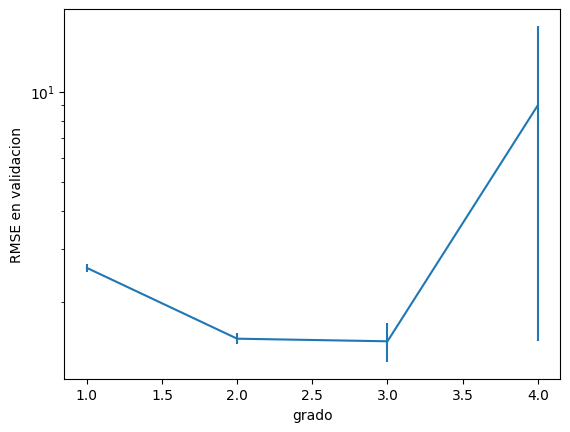

In [114]:
for ni, i in enumerate(grilla.cv_results_['params']):
  print(i['features__degree'],-grilla.cv_results_['mean_test_score'][ni])
plt.errorbar(grilla.cv_results_['param_features__degree'].data,(-grilla.cv_results_['mean_test_score']),yerr=grilla.cv_results_['std_test_score'])
plt.yscale('log')
plt.xlabel('grado')
plt.ylabel('RMSE en validacion')

In [115]:
# entrenamos con el mejor modelo
modelo_lineal=grilla.best_estimator_
modelo_lineal.fit(X_train, Y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('features', PolynomialFeatures(degree=3)),
                ('regression', LinearRegression())])

## ✅ *Coeficientes + Gráfico de importancia*



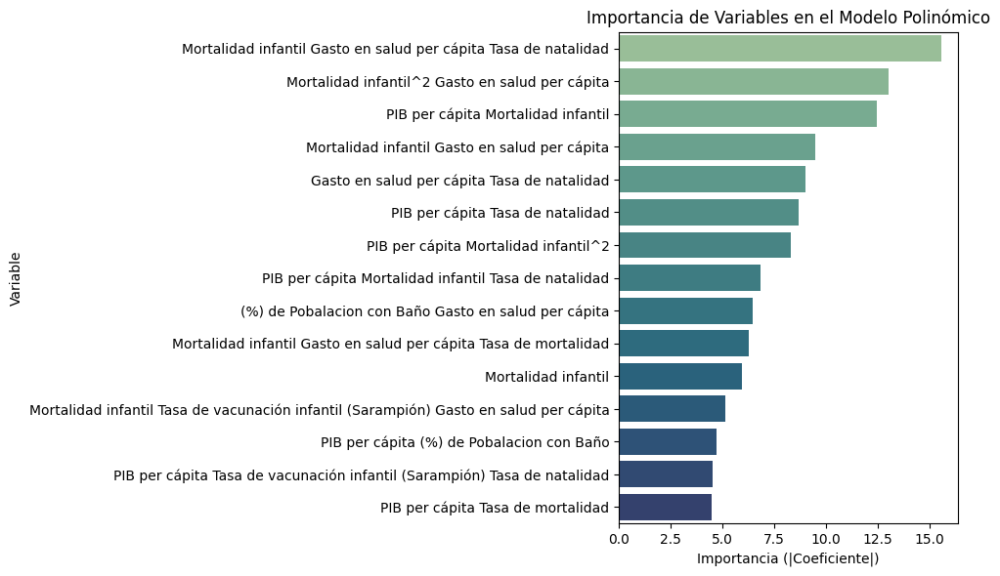

In [125]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Obtener nombres de las variables transformadas
feature_names = modelo_lineal.named_steps['features'].get_feature_names_out(X_train.columns)

# Obtener coeficientes del modelo lineal
coeficientes = modelo_lineal.named_steps['regression'].coef_

# Crear DataFrame ordenado por importancia (valor absoluto del coeficiente)
importancia_df = pd.DataFrame({
    'Variable': feature_names,
    'Coeficiente': coeficientes
}).assign(Importancia=lambda df: df['Coeficiente'].abs()
).sort_values(by='Importancia', ascending=False)

# Graficar las 15 variables más importantes
plt.figure(figsize=(10, 6))
sns.barplot(
    data=importancia_df.head(15),
    y='Variable',
    x='Importancia',
    palette='crest'
)
plt.title('Importancia de Variables en el Modelo Polinómico')
plt.xlabel('Importancia (|Coeficiente|)')
plt.ylabel('Variable')
plt.tight_layout()
plt.show()


## 📌 *¿Cómo se interpreta?*
## - Cuanto más larga la barra, más influencia tiene esa variable (o combinación) en la predicción de la variable objetivo.

## - No importa el signo en este gráfico, solo cuánta influencia tiene. Si querés saber si esa influencia es positiva o negativa, debés mirar el signo del coeficiente (en la columna Coeficiente).

## - Si aparecen muchas combinaciones como x1 x2, x2^2, etc., significa que el modelo encontró relaciones no lineales importantes para predecir la salida.

## - Las variables con menor barra tienen muy poco efecto, podrían considerarse irrelevantes en este modelo.



In [116]:
#hago las predicciones con x_test, x_train
y_pred_test1 = modelo_lineal.predict(x_test)
y_pred_train1 = modelo_lineal.predict(X_train)

In [117]:
!pip install -U scikit-learn

In [118]:

print('Precisión del modelo usando la raíz del error cuadratico medio (RMSE):')

# Calculate MSE and then take the square root for RMSE
score_train_modelo_lineal = mean_squared_error(Y_train, y_pred_train1) # Calculate MSE
score_train_modelo_lineal = np.sqrt(score_train_modelo_lineal) # Take the square root for RMSE

score_test_modelo_lineal = mean_squared_error(y_test, y_pred_test1) # Calculate MSE
score_test_modelo_lineal = np.sqrt(score_test_modelo_lineal) # Take the square root for RMSE


print ("Train:", score_train_modelo_lineal)
print ("Testeo:", score_test_modelo_lineal)

Precisión del modelo usando la raíz del error cuadratico medio (RMSE):
Train: 1.2270647904724767
Testeo: 1.3612874264037433


In [119]:
from sklearn.metrics import make_scorer, mean_squared_error, r2_score
from sklearn.metrics import make_scorer, mean_squared_error, r2_score, mean_absolute_error # Add mean_absolute_error to the imports

In [120]:

# 🔍 MÉTRICAS ENTRENAMIENTO
mae_train = mean_absolute_error(Y_train, y_pred_train1)
rmse_train = np.sqrt(mean_squared_error(Y_train, y_pred_train1))
r2_train = r2_score(Y_train, y_pred_train1) # Changed y_pred_train to y_pred_train1

# 🔍 MÉTRICAS TESTEO
mae_test = mean_absolute_error(y_test, y_pred_test1)
rmse_test = np.sqrt(mean_squared_error(y_test, y_pred_test1))
r2_test = r2_score(y_test, y_pred_test1)

# 📊 RESULTADOS
print("📘 Entrenamiento:")
print(f"🔎 MAE  (Error absoluto medio):     {mae_train:.2f} años")
print(f"📐 RMSE (Raíz del error cuadrático): {rmse_train:.2f} años")
print(f"📊 R²   (Coeficiente de determinación): {r2_train:.3f}")

print("\n🧪 Test:")
print("📘 Entrenamiento:")
print(f"🔎 MAE  (Error absoluto medio):     {mae_test:.2f} años")
print(f"📐 RMSE (Raíz del error cuadrático): {rmse_test:.2f} años")
print(f"📊 R²   (Coeficiente de determinación): {r2_test:.3f}")

📘 Entrenamiento:
🔎 MAE  (Error absoluto medio):     0.96 años
📐 RMSE (Raíz del error cuadrático): 1.23 años
📊 R²   (Coeficiente de determinación): 0.981

🧪 Test:
📘 Entrenamiento:
🔎 MAE  (Error absoluto medio):     1.07 años
📐 RMSE (Raíz del error cuadrático): 1.36 años
📊 R²   (Coeficiente de determinación): 0.976


📌 Ejemplo:

- 📈 MSE o RMSE suben → el modelo predice peor.

- 📉 MSE o RMSE bajan → el modelo mejora en precisión.


- R² alto en ambos (ej. 0.9 y 0.87)	✅
   Modelo generaliza bien
- R² alto en train pero bajo en test (ej. 0.95 vs 0.5)	❌ Overfitting
- R² bajo en ambos (ej. 0.3 y 0.25)	❌ Underfitting – el modelo no sirve tal como está


 ### MAE: Promedio de los errores absolutos. Es decir, en promedio el modelo se equivoca 1.07 años al predecir la esperanza de vida.
 ### No penaliza mucho los errores grandes.
 ### Mientras más bajo, mejor.

 ### RMSE: Penaliza los errores grandes más que el MAE porque eleva al cuadrado las diferencias antes de promediarlas. Después se toma la raíz cuadrada para que quede en la misma unidad (años).
 ### El modelo se equivoca unos 1,36 años en promedio, considerando los errores más grandes.

 ## R² de 0.976 indica que el modelo explica el 97.6% de las diferencias en esperanza de vida en años.



## 🧠 **Conclusión del análisis:**

### - Las diferencias entre train y test son mínimas → ✅ modelo bien generalizado.

### - El R² en test (0.976) es excelente → el modelo explica casi toda la varianza.

### - MAE en test es bajo → errores pequeños en términos de años. → en promedio el modelo se equivoca 1.07 años al predecir la esperanza de vida.

### - RMSE en test es bajo → el modelo se equivoca unos 1,36 años en promedio, considerando los errores más grandes.

### - No hay sobreajuste ni subajuste visible.

## **Validación Cruzada - Modelo Regresión Lineal**

In [122]:
from sklearn.model_selection import cross_val_score, KFold
import numpy as np

cv = KFold(n_splits=5, shuffle=True, random_state=42)


r2_scores = cross_val_score(modelo_lineal, x, y, cv=cv, scoring='r2')
rmse_scores = np.sqrt(-cross_val_score(modelo_lineal, x, y, cv=cv, scoring='neg_mean_squared_error'))
mae_scores = -cross_val_score(modelo_lineal, x, y, cv=cv, scoring='neg_mean_absolute_error')

print("🔁 Validación cruzada (5-fold):")
print(f"📊 R² Promedio:   {r2_scores.mean():.3f} ± {r2_scores.std():.3f}")
print(f"📐 RMSE Promedio: {rmse_scores.mean():.2f} ± {rmse_scores.std():.2f}")
print(f"🔎 MAE Promedio:  {mae_scores.mean():.2f} ± {mae_scores.std():.2f}")



🔁 Validación cruzada (5-fold):
📊 R² Promedio:   0.974 ± 0.005
📐 RMSE Promedio: 1.43 ± 0.15
🔎 MAE Promedio:  1.07 ± 0.04


### 🧠 ¿Qué significa todo esto?
- 📈 El modelo generaliza muy bien. Los errores son bajos y estables.

- 📉 No hay overfitting aparente: Las métricas en CV son muy similares a las del set de testeo que ya calculado.

- 🧪 El modelo es robusto: R² alto + baja desviación indican que el modelo no depende de una sola partición de los datos.


## 📊 **1. Gráfico Predicho vs Real (Train y Test)**

## 📌 **Interpretación:**

## Si los puntos están muy cerca de la línea roja, el modelo está prediciendo bien.

## Si en test hay más dispersión que en train, puede haber un poco de overfitting.

<ipython-input-123-c81ae917f7c6>:23: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


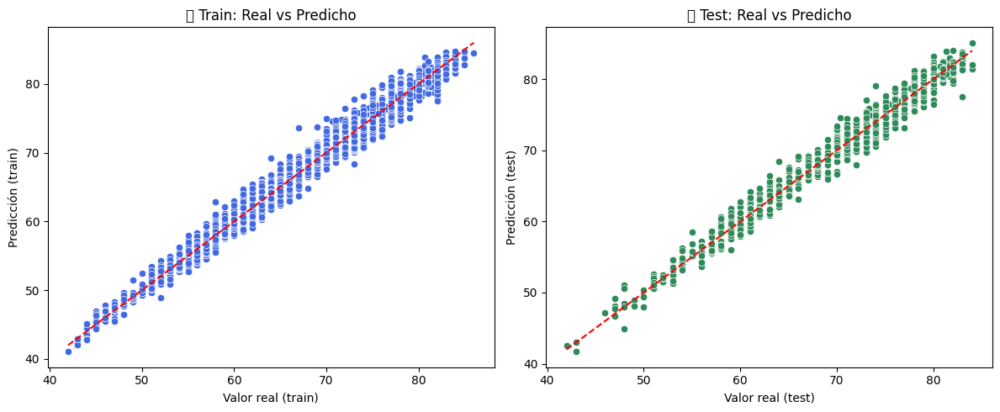

In [123]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_pred_vs_real(y_train, y_train_pred, y_test, y_test_pred):
    plt.figure(figsize=(12, 5))

    # Train
    plt.subplot(1, 2, 1)
    sns.scatterplot(x=y_train, y=y_train_pred, color="royalblue")
    plt.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'r--')
    plt.xlabel("Valor real (train)")
    plt.ylabel("Predicción (train)")
    plt.title("📈 Train: Real vs Predicho")

    # Test
    plt.subplot(1, 2, 2)
    sns.scatterplot(x=y_test, y=y_test_pred, color="seagreen")
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
    plt.xlabel("Valor real (test)")
    plt.ylabel("Predicción (test)")
    plt.title("📈 Test: Real vs Predicho")

    plt.tight_layout()
    plt.show()
grafico1 = plot_pred_vs_real(Y_train, y_pred_train1, y_test, y_pred_test1)

## 📉 **2. Gráfico de errores residuales**

## 📌 **Interpretación:**

## Distribución centrada en 0 = buen modelo

## Picos o colas largas = posibles errores sistemáticos u outliers



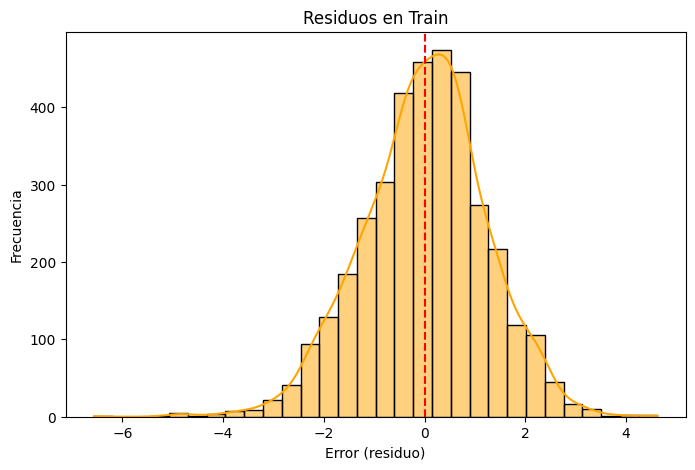

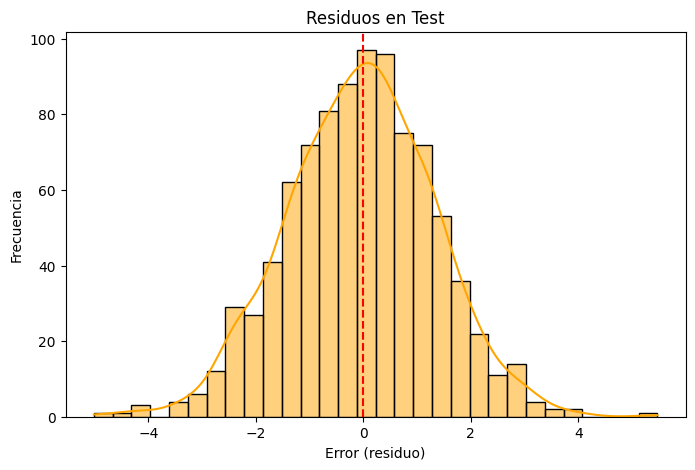

In [124]:
def plot_residuals(y_true, y_pred, title="Residuos del modelo"):
    errores = y_true - y_pred
    plt.figure(figsize=(8, 5))
    sns.histplot(errores, kde=True, bins=30, color="orange")
    plt.axvline(0, color='red', linestyle='--')
    plt.title(title)
    plt.xlabel("Error (residuo)")
    plt.ylabel("Frecuencia")
    plt.show()
plot_residuals(Y_train, y_pred_train1, title="Residuos en Train")
plot_residuals(y_test, y_pred_test1, title="Residuos en Test")





# *Support Vector Machine (SVM)*

In [81]:
pipeline_SVM= Pipeline([('scaler', StandardScaler()),
                  ('modelo',SVR())])

hiperparametros=[{'modelo__C':[10],'modelo__kernel':['linear']},{'modelo__gamma':[0.01], 'modelo__C':[1],'modelo__kernel':['rbf']}]
grilla=GridSearchCV(pipeline_SVM,hiperparametros, cv=3,scoring='neg_root_mean_squared_error',n_jobs=-1,verbose=3)
grilla.fit(X_train,Y_train)

Fitting 3 folds for each of 2 candidates, totalling 6 fits


GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('modelo', SVR())]),
             n_jobs=-1,
             param_grid=[{'modelo__C': [10], 'modelo__kernel': ['linear']},
                         {'modelo__C': [1], 'modelo__gamma': [0.01],
                          'modelo__kernel': ['rbf']}],
             scoring='neg_root_mean_squared_error', verbose=3)

In [82]:
grilla.best_params_

{'modelo__C': 1, 'modelo__gamma': 0.01, 'modelo__kernel': 'rbf'}

In [83]:
grilla.best_score_

np.float64(-2.2949925988062154)

In [84]:
# Fit best model
modelo_SVR=grilla.best_estimator_
modelo_SVR.fit(X_train, Y_train)

Pipeline(steps=[('scaler', StandardScaler()), ('modelo', SVR(C=1, gamma=0.01))])

## 🔍 *Importancia de variables usando SHAP*

In [ ]:
sample = X_train.sample(100, random_state=42)  # mantener nombres de columnas

explainer = shap.KernelExplainer(
    lambda x: modelo_SVR.predict(pd.DataFrame(x, columns=X_train.columns)),
    sample
)

shap_values = explainer.shap_values(sample)

# Barplot de importancia
importancia_media = np.mean(np.abs(shap_values), axis=0)
importancia_df = pd.DataFrame({
    'Variable': X_train.columns,
    'Importancia_SHAP': importancia_media
}).sort_values(by='Importancia_SHAP', ascending=True)

plt.figure(figsize=(10, 6))
sns.barplot(x='Importancia_SHAP', y='Variable', data=importancia_df, palette='viridis')
plt.title('Importancia de Variables según SHAP (SVR)', fontsize=14)
plt.xlabel('Importancia promedio (|SHAP|)')
plt.ylabel('Variable')
plt.tight_layout()
plt.show()



In [91]:
#hago las predicciones con x_test, x_train
y_pred_test2 = modelo_SVR.predict(x_test)
y_pred_train2 = modelo_SVR.predict(X_train)


In [92]:
# 🔍 MÉTRICAS ENTRENAMIENTO
mae_train_SVR = mean_absolute_error(Y_train, y_pred_train2)
rmse_train_SVR = np.sqrt(mean_squared_error(Y_train, y_pred_train2))
r2_train_SVR = r2_score(Y_train, y_pred_train2)

# 🔍 MÉTRICAS TESTEO
mae_test_SVR = mean_absolute_error(y_test, y_pred_test2)
rmse_test_SVR = np.sqrt(mean_squared_error(y_test, y_pred_test2))
r2_test_SVR = r2_score(y_test, y_pred_test2)

# 📊 RESULTADOS
print("📘 Entrenamiento:")
print(f"🔎 MAE  (Error absoluto medio):     {mae_train_SVR:.2f} años")
print(f"📐 RMSE (Raíz del error cuadrático): {rmse_train_SVR:.2f} años")
print(f"📊 R²   (Coeficiente de determinación): {r2_train_SVR:.3f}")

print("\n🧪 Test:")
print("📘 Entrenamiento:")
print(f"🔎 MAE  (Error absoluto medio):     {mae_test_SVR:.2f} años")
print(f"📐 RMSE (Raíz del error cuadrático): {rmse_test_SVR:.2f} años")
print(f"📊 R²   (Coeficiente de determinación): {r2_test_SVR:.3f}")


📘 Entrenamiento:
🔎 MAE  (Error absoluto medio):     1.56 años
📐 RMSE (Raíz del error cuadrático): 2.16 años
📊 R²   (Coeficiente de determinación): 0.941

🧪 Test:
📘 Entrenamiento:
🔎 MAE  (Error absoluto medio):     1.51 años
📐 RMSE (Raíz del error cuadrático): 2.07 años
📊 R²   (Coeficiente de determinación): 0.945


📌 Ejemplo:

- 📈 MSE o RMSE suben → el modelo predice peor.

- 📉 MSE o RMSE bajan → el modelo mejora en precisión.


- R² alto en ambos (ej. 0.9 y 0.87)	✅
   Modelo generaliza bien
- R² alto en train pero bajo en test (ej. 0.95 vs 0.5)	❌ Overfitting
- R² bajo en ambos (ej. 0.3 y 0.25)	❌ Underfitting – el modelo no sirve tal como está

## MAE: Promedio de los errores absolutos. Es decir, en promedio el modelo se equivoca 1.51 años al predecir la esperanza de vida.
 ## No penaliza mucho los errores grandes.
 ## Mientras más bajo, mejor.

 ## RMSE: Penaliza los errores grandes más que el MAE porque eleva al cuadrado las diferencias antes de promediarlas. Después se toma la raíz cuadrada para que quede en la misma unidad (años).
 ## El modelo se equivoca unos 2.07 años en promedio, considerando los errores más grandes.

 ## R² de 0.976 indica que el modelo explica el 97.6% de las diferencias en esperanza de vida en años.


## **Validación Cruzada para Modelo SVR**

In [95]:
cv = KFold(n_splits=5, shuffle=True, random_state=42)


r2_scores2 = cross_val_score(modelo_SVR, x, y, cv=cv, scoring='r2')
rmse_scores2 = np.sqrt(-cross_val_score(modelo_SVR, x, y, cv=cv, scoring='neg_mean_squared_error'))
mae_scores2 = -cross_val_score(modelo_SVR, x, y, cv=cv, scoring='neg_mean_absolute_error')

print("🔁 Validación cruzada (5-fold):")
print(f"📊 R² Promedio:   {r2_scores2.mean():.3f} ± {r2_scores2.std():.3f}")
print(f"📐 RMSE Promedio: {rmse_scores2.mean():.2f} ± {rmse_scores2.std():.2f}")
print(f"🔎 MAE Promedio:  {mae_scores2.mean():.2f} ± {mae_scores2.std():.2f}")

🔁 Validación cruzada (5-fold):
📊 R² Promedio:   0.941 ± 0.004
📐 RMSE Promedio: 2.15 ± 0.09
🔎 MAE Promedio:  1.57 ± 0.07


## 📌 Conclusiones
- 📉 SVR no funciona mejor que el modelo Lineal Regression.

- 🔁 Generaliza con consistencia (std baja), pero a un nivel inferior.

- 📊 Probablemente necesite más tuning o no sea el modelo ideal para este tipo de problema y datos.



## 📊 **1. Gráfico Predicho vs Real (Train y Test)**

<ipython-input-77-c81ae917f7c6>:23: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


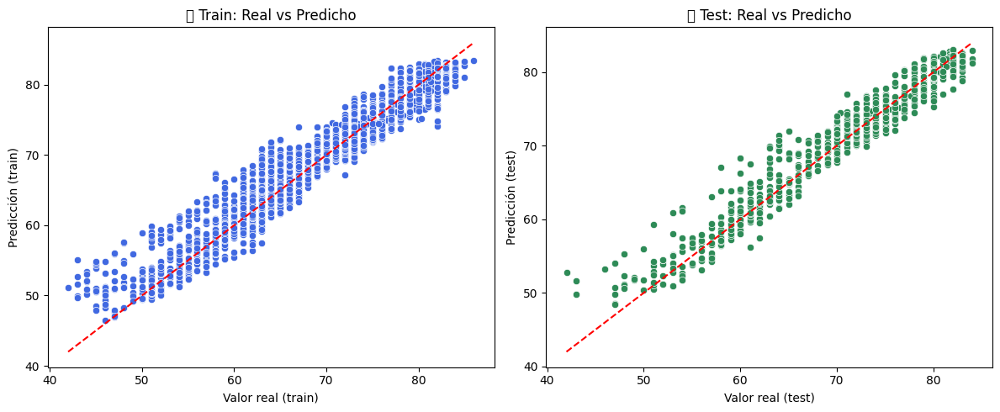

In [98]:
grafico2 = plot_pred_vs_real(Y_train, y_pred_train2, y_test, y_pred_test2)

## 📉 **2. Gráfico de errores residuales**

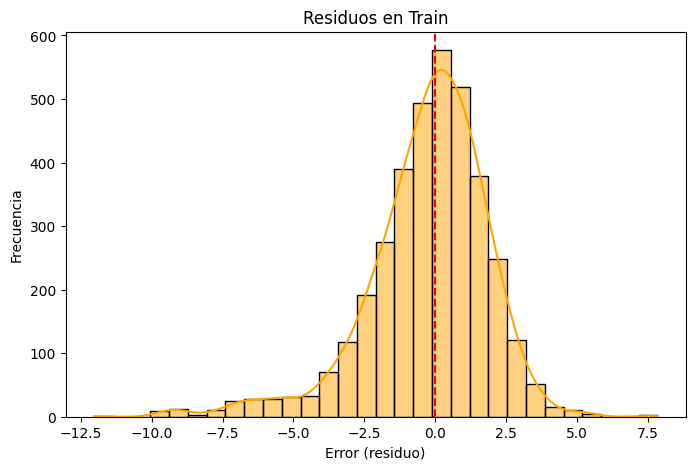

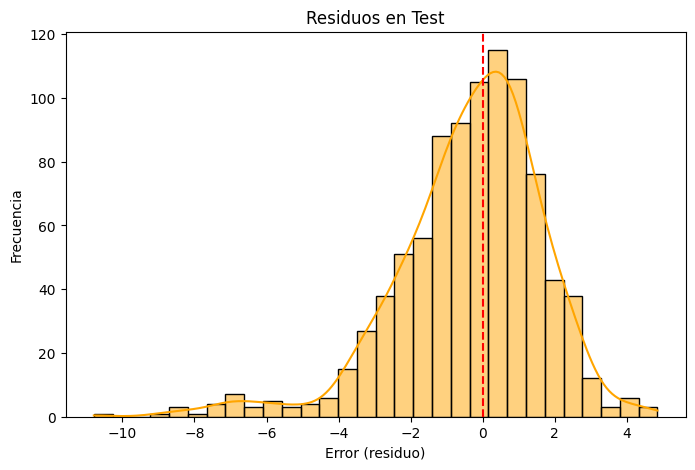

In [99]:
plot_residuals(Y_train, y_pred_train2, title="Residuos en Train")
plot_residuals(y_test, y_pred_test2, title="Residuos en Test")

# *XBOOST*

In [100]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from xgboost import XGBRegressor

In [101]:
# 📦 Pipeline con XGBoost
pipeline_xgb = Pipeline([
    ('scaler', StandardScaler()),
    ('regressor', XGBRegressor(objective='reg:squarederror', random_state=42))
])

# 🔧 Hiperparámetros para XGBoost a evaluar
param_grid_xgb = {
    'regressor__n_estimators': [100, 200],
    'regressor__max_depth': [3, 5, 7],
    'regressor__learning_rate': [0.01, 0.1, 0.2],
    'regressor__subsample': [0.8, 1],
    'regressor__colsample_bytree': [0.8, 1]
}

# 🔍 Grid Search con validación cruzada
grid_xgb = GridSearchCV(
    estimator=pipeline_xgb,
    param_grid=param_grid_xgb,
    cv=5,
    scoring='neg_root_mean_squared_error',  # o 'r2' o 'neg_mean_absolute_error'
    verbose=2,
    n_jobs=-1
)

# 🏃 Entrenar con X_train, Y_train
grid_xgb.fit(X_train, Y_train)

# ✅ Mejor modelo y score
print("📈 Mejor RMSE negativo:", grid_xgb.best_score_)
print("🏆 Mejores hiperparámetros:", grid_xgb.best_params_)

Fitting 5 folds for each of 72 candidates, totalling 360 fits
📈 Mejor RMSE negativo: -0.9812352448962155
🏆 Mejores hiperparámetros: {'regressor__colsample_bytree': 1, 'regressor__learning_rate': 0.1, 'regressor__max_depth': 7, 'regressor__n_estimators': 200, 'regressor__subsample': 0.8}


In [102]:
modelo_Xboost = grid_xgb.best_estimator_
modelo_Xboost.fit(X_train, Y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('regressor',
                 XGBRegressor(base_score=None, booster=None, callbacks=None,
                              colsample_bylevel=None, colsample_bynode=None,
                              colsample_bytree=1, device=None,
                              early_stopping_rounds=None,
                              enable_categorical=False, eval_metric=None,
                              feature_types=None, gamma=None, grow_policy=None,
                              importance_type=None,
                              interaction_constraints=None, learning_rate=0.1,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=7, max_leaves=None,
                              min_child_weight=None, missing=nan,
                              monotone_constraints=None, multi_strategy=None,
                              n_estimators=200, n_jobs=None,
                              num_parallel_tree=None, random_state=42, ...))])

## *Importancia de Variables para XBoost usanto feature_importance*

In [103]:

coeficientes = grid_xgb.best_estimator_.named_steps['regressor'].feature_importances_
variables = X_train.columns

importancia = pd.DataFrame({
    'Variable': variables,
    'Importancia': coeficientes
}).sort_values(by='Importancia', ascending=False)



<ipython-input-104-1fd7d77dcade>:8: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


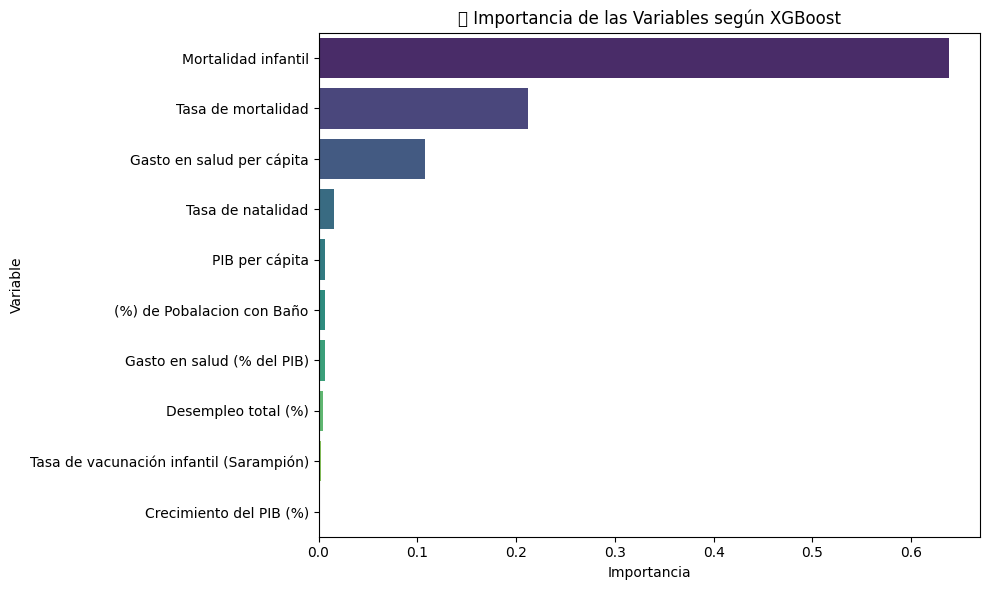

In [104]:
import seaborn as sns

plt.figure(figsize=(10,6))
sns.barplot(data=importancia, x='Importancia', y='Variable', palette='viridis')
plt.title('📊 Importancia de las Variables según XGBoost')
plt.xlabel('Importancia')
plt.ylabel('Variable')
plt.tight_layout()
plt.show()

##*Conclusiones:*

## *Se puede observar que para el modelo de XBoost, las 4 variables mas importantes son:*

## - Mortalidad Infantil.
## - Tasa de Mortalidad.
## - Gasto en Salud Pública.
## - Y en menor medida Tasa de Natalidad.

In [105]:
#hago las predicciones con x_test, x_train
y_pred_test3 = modelo_Xboost.predict(x_test)
y_pred_train3 = modelo_Xboost.predict(X_train)


In [106]:
# 🔍 MÉTRICAS ENTRENAMIENTO
mae_train_Xboost = mean_absolute_error(Y_train, y_pred_train3)
rmse_train_Xboost = np.sqrt(mean_squared_error(Y_train, y_pred_train3))
r2_train_Xboost = r2_score(Y_train, y_pred_train3)

# 🔍 MÉTRICAS TESTEO
mae_test_Xboost = mean_absolute_error(y_test, y_pred_test3)
rmse_test_Xboost = np.sqrt(mean_squared_error(y_test, y_pred_test3))
r2_test_Xboost = r2_score(y_test, y_pred_test3)

# 📊 RESULTADOS
print("📘 Entrenamiento:")
print(f"🔎 MAE  (Error absoluto medio):     {mae_train_Xboost:.2f} años")
print(f"📐 RMSE (Raíz del error cuadrático): {rmse_train_Xboost:.2f} años")
print(f"📊 R²   (Coeficiente de determinación): {r2_train_Xboost:.3f}")

print("\n🧪 Test:")
print("📘 Entrenamiento:")
print(f"🔎 MAE  (Error absoluto medio):     {mae_test_Xboost:.2f} años")
print(f"📐 RMSE (Raíz del error cuadrático): {rmse_test_Xboost:.2f} años")
print(f"📊 R²   (Coeficiente de determinación): {r2_test_Xboost:.3f}")

📘 Entrenamiento:
🔎 MAE  (Error absoluto medio):     0.20 años
📐 RMSE (Raíz del error cuadrático): 0.27 años
📊 R²   (Coeficiente de determinación): 0.999

🧪 Test:
📘 Entrenamiento:
🔎 MAE  (Error absoluto medio):     0.65 años
📐 RMSE (Raíz del error cuadrático): 0.87 años
📊 R²   (Coeficiente de determinación): 0.990


## ✅ Conclusiones
1. Muy buen desempeño general
El modelo tiene un error muy bajo en ambos conjuntos (entreno y test).

El R² > 0.99 en ambos casos indica que el modelo explica más del 99% de la variabilidad de la variable objetivo. Excelente.

2. Generalización bastante buena
Hay una pequeña diferencia entre entrenamiento y test:

El MAE y el RMSE son mayores en test, lo cual es esperable.

Pero no hay un salto dramático, lo que indica que el modelo no está sobreajustado (overfitting).

3. Ligero overfitting saludable
El R² bajó de 0.999 → 0.990, lo cual es normal.

Lo mismo con el MAE (de 0.20 → 0.65).

Estos valores están dentro de un margen aceptable y el modelo generaliza muy bien.

🧠 En resumen:
El modelo tiene un rendimiento excelente. Generaliza bien y no hay señales serias de overfitting. Ya estaría listo para usarse en producción o para generar interpretaciones.

## Validación Cruzada XBoost


In [108]:
cv = KFold(n_splits=5, shuffle=True, random_state=42)


r2_scores3 = cross_val_score(modelo_Xboost, x, y, cv=cv, scoring='r2')
rmse_scores3 = np.sqrt(-cross_val_score(modelo_Xboost, x, y, cv=cv, scoring='neg_mean_squared_error'))
mae_scores3 = -cross_val_score(modelo_Xboost, x, y, cv=cv, scoring='neg_mean_absolute_error')

print("🔁 Validación cruzada (5-fold):")
print(f"📊 R² Promedio:   {r2_scores3.mean():.3f} ± {r2_scores3.std():.3f}")
print(f"📐 RMSE Promedio: {rmse_scores3.mean():.2f} ± {rmse_scores3.std():.2f}")
print(f"🔎 MAE Promedio:  {mae_scores3.mean():.2f} ± {mae_scores3.std():.2f}")

🔁 Validación cruzada (5-fold):
📊 R² Promedio:   0.989 ± 0.001
📐 RMSE Promedio: 0.93 ± 0.04
🔎 MAE Promedio:  0.69 ± 0.03


<ipython-input-77-c81ae917f7c6>:23: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


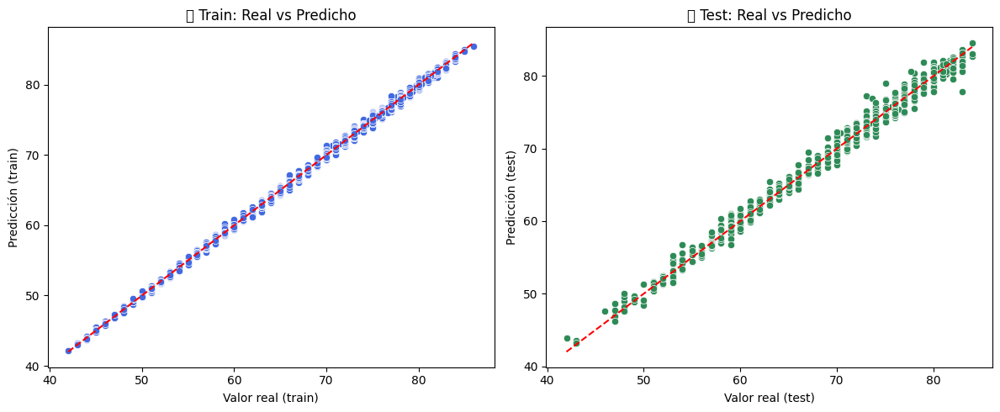

In [109]:
grafico3 = plot_pred_vs_real(Y_train, y_pred_train3, y_test, y_pred_test3)

## **Featuring**
### 📊 Combinaciones de Variables para Mejorar el Modelo
### 1️⃣ Índices de Desarrollo Humano
### Índice de Salud: (Gasto en salud per cápita / PIB per cápita) * 100
### Índice de Bienestar: (Esperanza de vida al nacer / Tasa de mortalidad infantil) * 100
### Índice de Calidad de Vida: ((Tasa de vacunación infantil + (%) de Población con Baño) / 2)
### 2️⃣ Factores Económicos
### PIB ajustado por salud: (PIB per cápita * Gasto en salud (% del PIB)) / 100
### PIB ajustado por desempleo: (PIB per cápita * (1 - Desempleo total (%)))
### Desempleo ajustado por natalidad: Desempleo total (%) / Tasa de natalidad
###  3️⃣ Factores Demográficos
### Relación Natalidad/Mortalidad: Tasa de natalidad / Tasa de mortalidad
### Mortalidad infantil ajustada: (Mortalidad infantil / Esperanza de vida al nacer) * 100
### 4️⃣ Relaciones Epidemiológicas
### Impacto de la vacunación en la mortalidad infantil: Mortalidad infantil / Tasa de vacunación infantil
### Impacto del acceso a saneamiento en la esperanza de vida: Esperanza de vida al nacer / (%) de Población con Baño

In [ ]:
import pandas as pd

df_imputed_scaled_1 = df_imputed_scaled.copy()  # Copia del DataFrame original

# Índices de Desarrollo Humano
df_imputed_scaled_1["Indice_Salud"] = (df_imputed_scaled_1["Gasto en salud per cápita"] / df_imputed_scaled_1["PIB per cápita"]) * 100  # Relación entre gasto en salud y PIB per cápita

df_imputed_scaled_1["Indice_Bienestar"] = (df_imputed_scaled_1["Esperanza de vida al nacer"] / df_imputed_scaled_1["Mortalidad infantil"]) * 100  # Relación entre esperanza de vida y mortalidad infantil

df_imputed_scaled_1["Indice_Calidad_Vida"] = (df_imputed_scaled_1["Tasa de vacunación infantil (Sarampión)"] + df_imputed_scaled_1["(%) de Pobalacion con Baño"]) / 2  # Promedio de vacunación y acceso a saneamiento

# Factores Económicos
df_imputed_scaled_1["PIB_Ajustado_Salud"] = (df_imputed_scaled_1["PIB per cápita"] * df_imputed_scaled_1["Gasto en salud (% del PIB)"]) / 100  # PIB per cápita ponderado por gasto en salud

df_imputed["PIB_Ajustado_Desempleo"] = df_imputed_scaled_1["PIB per cápita"] * (1 - df_imputed_scaled_1["Desempleo total (%)"]/100)  # PIB ajustado por tasa de desempleo

df_imputed_scaled["Desempleo_Ajustado_Natalidad"] = df_imputed_scaled_1["Desempleo total (%)"] / df_imputed_scaled_1["Tasa de natalidad"]  # Relación entre desempleo y natalidad

# Factores Demográficos
df_imputed_scaled_1["Relacion_Natalidad_Mortalidad"] = df_imputed_scaled_1["Tasa de natalidad"] / df_imputed_scaled_1["Tasa de mortalidad"]  # Relación entre natalidad y mortalidad

df_imputed["Mortalidad_Infantil_Ajustada"] = (df_imputed_scaled_1["Mortalidad infantil"] / df_imputed_scaled_1["Esperanza de vida al nacer"]) * 100  # Mortalidad infantil en proporción a la esperanza de vida

# Relaciones Epidemiológicas
df_imputed_scaled_1["Impacto_Vacunacion_Mortalidad"] = df_imputed_scaled_1["Mortalidad infantil"] / df_imputed_scaled_1["Tasa de vacunación infantil (Sarampión)"]  # Impacto de la vacunación en la mortalidad infantil

df_imputed_scaled_1["Impacto_Saneamiento_Esperanza_Vida"] = df_imputed_scaled_1["Esperanza de vida al nacer"] / df_imputed_scaled_1["(%) de Pobalacion con Baño"]  # Relación entre acceso a saneamiento y esperanza de vida

# Mostrar las primeras filas del DataFrame con las nuevas columnas
df_imputed_scaled_1.head()


indicador,Pais,Año,Crecimiento del PIB (%),PIB per cápita,Mortalidad infantil,Tasa de vacunación infantil (Sarampión),(%) de Pobalacion con Baño,Gasto en salud (% del PIB),Gasto en salud per cápita,Desempleo total (%),...,Grupo Natalidad,Grupo PIB per cápita,Grupo PBI Salud per capita,Indice_Salud,Indice_Bienestar,Indice_Calidad_Vida,PIB_Ajustado_Salud,Relacion_Natalidad_Mortalidad,Impacto_Vacunacion_Mortalidad,Impacto_Saneamiento_Esperanza_Vida
0,Afghanistan,2000,-0.063928,-0.608217,2.466076,-4.142141,-1.809695,1.324831,-0.566829,-0.014493,...,Alta,Baja,Baja,93.195155,-71.487958,-2.975918,-0.008058,2.205317,-0.595363,0.974168
1,Afghanistan,2001,-2.286305,-0.609645,2.338556,-3.444494,-1.809695,1.324831,-0.566829,-0.014493,...,Alta,Baja,Baja,92.976940,-70.548911,-2.627094,-0.008077,2.128282,-0.678926,0.911660
2,Afghanistan,2002,4.751223,-0.608059,2.236539,-3.584023,-1.740739,0.965510,-0.585976,-0.014493,...,Alta,Baja,Baja,96.368395,-73.766890,-2.662381,-0.005871,2.781307,-0.624030,0.947773
3,Afghanistan,2003,1.047261,-0.607266,2.109019,-3.304964,-1.706260,0.965510,-0.585437,-0.014493,...,Alta,Baja,Baja,96.405427,-72.863435,-2.505612,-0.005863,2.676856,-0.638137,0.900627
4,Afghanistan,2004,-0.434324,-0.606354,2.007003,-2.677082,-1.637304,1.324831,-0.583819,-0.014493,...,Alta,Baja,Baja,96.283572,-70.930739,-2.157193,-0.008033,3.993856,-0.749698,0.869467


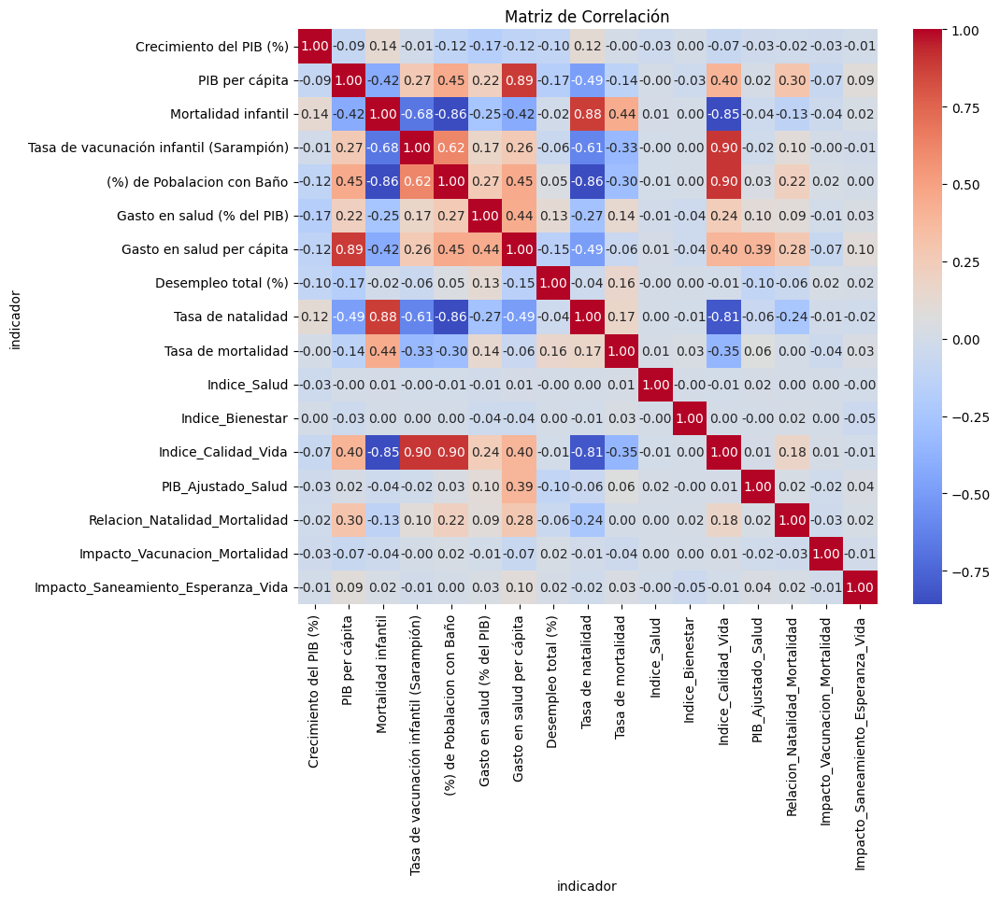

In [ ]:
#realizo la matriz de correlación entre variables
plt.figure(figsize=(10, 8))
Solo1 = df_imputed_scaled_1.drop(["Pais", "Año", "Grupo Natalidad", "Grupo Esperanza de Vida", "Grupo PIB per cápita","Grupo PBI Salud per capita","Esperanza de vida al nacer"], axis=1)
correlation_matrix1 = Solo1.corr()
sns.heatmap(correlation_matrix1, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Matriz de Correlación")
plt.show()

In [ ]:
import pandas as pd
from sklearn.linear_model import LinearRegression

# 🔹 1. Eliminar columnas categóricas y la variable objetivo
cols_to_drop = ["Pais", "Año", "Grupo Natalidad", " PIB per cápita","Grupo Esperanza de Vida", "Grupo PIB per cápita","Grupo PBI Salud per capita", "Esperanza de vida al nacer"]
data_ = df_imputed_scaled_1.drop(columns=cols_to_drop, errors="ignore")  # Ignora si alguna columna no existe

# 🔹 2. Calcular VIF manualmente
vif_manual = {}

for feature in data_.columns:
    y = data_[feature]  # Variable dependiente
    X = data_.drop(columns=[feature])  # Variables independientes

    if X.shape[1] == 0:  # Evitar errores si X queda vacío
        continue

    model = LinearRegression().fit(X, y)  # Ajustar modelo de regresión
    r_squared = model.score(X, y)  # Obtener R²

    vif = 1 / (1 - r_squared) if r_squared < 1 else float("inf")  # Evitar división por cero
    vif_manual[feature] = vif

# 🔹 3. Convertir a DataFrame para visualizar mejor
vif_manual_df2 = pd.DataFrame(list(vif_manual.items()), columns=['Feature', 'VIF'])

# Ordenar de mayor a menor VIF para ver las variables más problemáticas
vif_manual_df2 = vif_manual_df2.sort_values(by="VIF", ascending=False)

# Mostrar el resultado
print(vif_manual_df2)


                                    Feature        VIF
12                      Indice_Calidad_Vida        inf
3   Tasa de vacunación infantil (Sarampión)        inf
4                (%) de Pobalacion con Baño        inf
6                 Gasto en salud per cápita  72.802799
1                            PIB per cápita  52.289452
13                       PIB_Ajustado_Salud  10.402923
2                       Mortalidad infantil   9.150712
8                         Tasa de natalidad   7.680509
5                Gasto en salud (% del PIB)   4.953913
9                        Tasa de mortalidad   1.910479
14            Relacion_Natalidad_Mortalidad   1.168095
7                       Desempleo total (%)   1.147685
0                   Crecimiento del PIB (%)   1.062101
16       Impacto_Saneamiento_Esperanza_Vida   1.023696
15            Impacto_Vacunacion_Mortalidad   1.016302
11                         Indice_Bienestar   1.008589
10                             Indice_Salud   1.002424


## **Observaciones**
### Se observa una alta correlación entre variables sumando las nuevas generadas.
### EL VIF muestra una alta colinealidad entre las nuevas variables.
### En futuras lineas se eliminará algunas varibles que puede que sean redundantes y generen un VIF elevado.:

# *Prueba de Clustering*

## Dado que el dataset original tiene varios registros por pais, para que pueda probarse el modelo de Clustering se le aplica la media a cada pais dejando un solo registro de cada uno.

In [150]:
# Agrupo por Pais
df_pais= df_imputed.groupby("Pais").mean(numeric_only=True).round(2)
#Elimino la columna Año. Ya no es necesaria.
df_pais = df_pais.drop(columns=['Año'])

df_pais

indicador,Crecimiento del PIB (%),PIB per cápita,Mortalidad infantil,Tasa de vacunación infantil (Sarampión),(%) de Pobalacion con Baño,Gasto en salud (% del PIB),Gasto en salud per cápita,Desempleo total (%),Tasa de natalidad,Tasa de mortalidad,Esperanza de vida al nacer
Pais,,,,,,,,,,,
Afghanistan,4.54,415.58,88.79,54.04,37.42,11.08,49.92,9.33,41.29,8.54,60.50
Albania,4.25,4091.25,14.50,94.88,95.33,6.29,239.92,14.58,12.33,7.50,77.50
Algeria,3.04,4210.96,29.04,87.67,86.17,5.08,202.08,14.46,22.75,4.79,73.83
American Samoa,-0.43,11596.00,14.10,92.39,60.13,6.29,719.41,10.10,17.41,5.09,74.28
Andorra,1.92,40040.38,4.62,97.17,100.00,6.67,2696.42,7.21,9.83,3.83,81.64
...,...,...,...,...,...,...,...,...,...,...,...
Viet Nam,6.29,2019.08,23.58,94.46,71.17,4.62,90.08,1.79,16.79,6.21,73.62
"Virgin Islands, U.S.",-0.54,37832.67,5.57,92.83,99.00,7.87,2997.16,11.92,13.58,7.08,78.50
Yemen,0.96,838.33,59.17,62.58,50.21,5.21,53.96,14.50,35.29,6.46,65.67


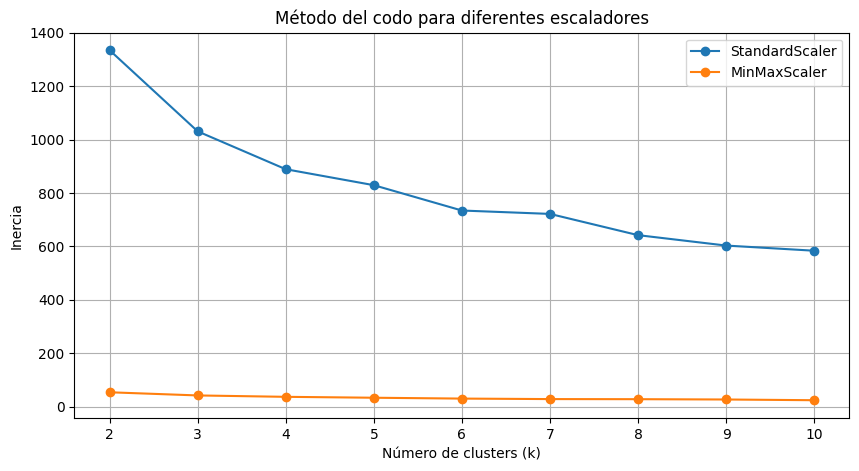

In [164]:
import pandas as pd
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

# ===============================
# 1. Preparamos los datos
# ===============================

# Guardamos los nombres de los países
paises = df_pais.index
X = df_pais.copy()

# ===============================
# 2. Probamos escaladores y buscamos el mejor k
# ===============================
escaladores = {
    'StandardScaler': StandardScaler(),
    'MinMaxScaler': MinMaxScaler()
}

inertia_results = {}

for nombre, scaler in escaladores.items():
    inercias = []
    for k in range(2, 11):
        pipeline = Pipeline([
            ('scaler', scaler),
            ('kmeans', KMeans(n_clusters=k, random_state=42))
        ])
        pipeline.fit(X)
        inercias.append(pipeline.named_steps['kmeans'].inertia_)
    inertia_results[nombre] = inercias

# ===============================
# 3. Graficamos el método del codo
# ===============================
plt.figure(figsize=(10, 5))
for nombre, inercias in inertia_results.items():
    plt.plot(range(2, 11), inercias, marker='o', label=nombre)
plt.xlabel('Número de clusters (k)')
plt.ylabel('Inercia')
plt.title('Método del codo para diferentes escaladores')
plt.legend()
plt.grid(True)
plt.show()


In [165]:
from sklearn.metrics import silhouette_score

for nombre, scaler in escaladores.items():
    print(f"🔎 Escalador: {nombre}")
    for k in range(2, 11):
        pipeline = Pipeline([
            ('scaler', scaler),
            ('kmeans', KMeans(n_clusters=6, random_state=42))
        ])
        pipeline.fit(X)
        labels = pipeline.named_steps['kmeans'].labels_
        sil_score = silhouette_score(pipeline.named_steps['scaler'].transform(X), labels)
        print(f"k = {k} → Silhouette Score: {sil_score:.3f}")



🔎 Escalador: StandardScaler
k = 2 → Silhouette Score: 0.240
k = 3 → Silhouette Score: 0.240
k = 4 → Silhouette Score: 0.240
k = 5 → Silhouette Score: 0.240
k = 6 → Silhouette Score: 0.240
k = 7 → Silhouette Score: 0.240
k = 8 → Silhouette Score: 0.240
k = 9 → Silhouette Score: 0.240
k = 10 → Silhouette Score: 0.240
🔎 Escalador: MinMaxScaler
k = 2 → Silhouette Score: 0.247
k = 3 → Silhouette Score: 0.247
k = 4 → Silhouette Score: 0.247
k = 5 → Silhouette Score: 0.247
k = 6 → Silhouette Score: 0.247
k = 7 → Silhouette Score: 0.247
k = 8 → Silhouette Score: 0.247
k = 9 → Silhouette Score: 0.247
k = 10 → Silhouette Score: 0.247


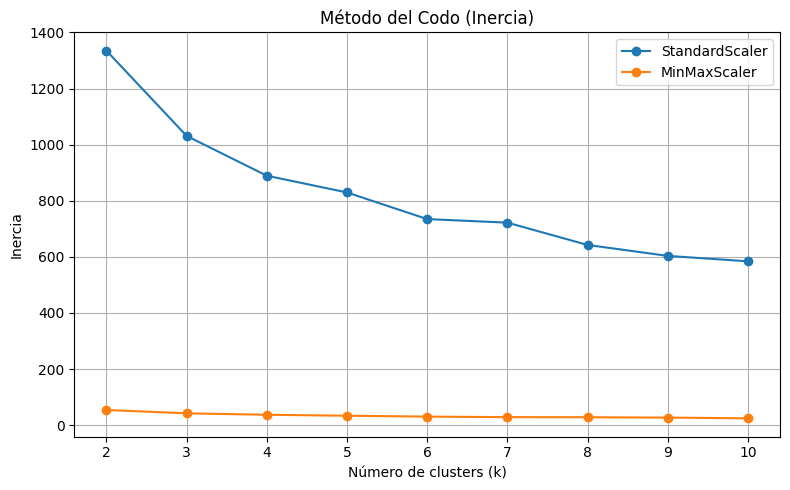

In [173]:
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import pandas as pd

# ===============================
# 1. Preparamos los datos
# ===============================
df_X = df_pais.copy()

# ===============================
# 2. Definimos escaladores
# ===============================
escaladores = {
    'StandardScaler': StandardScaler(),
    'MinMaxScaler': MinMaxScaler()
}

inertia_results = {}

# ===============================
# 3. Ejecutamos para cada escalador y k
# ===============================
for nombre, scaler in escaladores.items():
    inercias = []
    for k in range(2, 11):
        pipeline = Pipeline([
            ('scaler', scaler),
            ('kmeans', KMeans(n_clusters=k, random_state=42))
        ])
        pipeline.fit(df_X)
        inertia = pipeline.named_steps['kmeans'].inertia_
        inercias.append(inertia)

    inertia_results[nombre] = inercias

# ===============================
# 4. Graficamos solo Inercia (Codo)
# ===============================
ks = range(2, 11)
plt.figure(figsize=(8, 5))
for nombre in escaladores:
    plt.plot(ks, inertia_results[nombre], marker='o', label=nombre)

plt.title("Método del Codo (Inercia)")
plt.xlabel("Número de clusters (k)")
plt.ylabel("Inercia")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


# * Grafico de Sioulette con Standard Scaller*

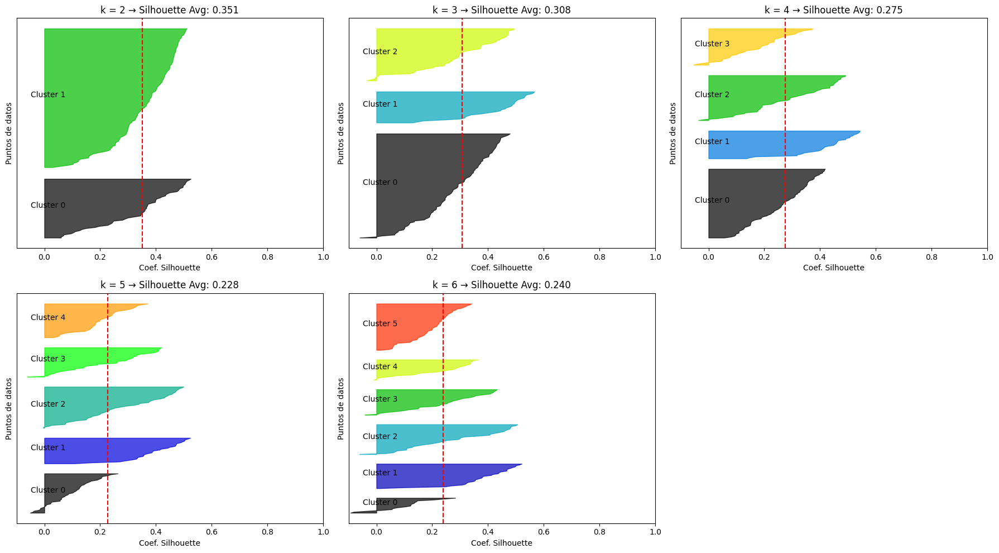

In [171]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

# Escalar los datos
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_X)

# Rango de k a probar
rango_k = range(2, 7)

# Crear subplots
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 10))
axes = axes.flatten()

for idx, k in enumerate(rango_k):
    ax = axes[idx]

    # KMeans
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(X_scaled)

    # Silhouette
    silhouette_avg = silhouette_score(X_scaled, labels)
    sample_silhouette_values = silhouette_samples(X_scaled, labels)

    y_lower = 10
    for i in range(k):
        ith_cluster_silhouette_values = sample_silhouette_values[labels == i]
        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / k)
        ax.fill_betweenx(np.arange(y_lower, y_upper),
                         0, ith_cluster_silhouette_values,
                         facecolor=color, edgecolor=color, alpha=0.7)
        ax.text(-0.05, y_lower + 0.5 * size_cluster_i, f"Cluster {i}")
        y_lower = y_upper + 10

    ax.axvline(x=silhouette_avg, color="red", linestyle="--")
    ax.set_title(f"k = {k} → Silhouette Avg: {silhouette_avg:.3f}")
    ax.set_xlabel("Coef. Silhouette")
    ax.set_ylabel("Puntos de datos")
    ax.set_xlim([-0.1, 1])
    ax.set_yticks([])

# Quitar gráfico vacío si hay
if len(rango_k) < len(axes):
    for i in range(len(rango_k), len(axes)):
        fig.delaxes(axes[i])

plt.tight_layout()
plt.show()


# * Grafico de Sioulette con MinMax Scaler*

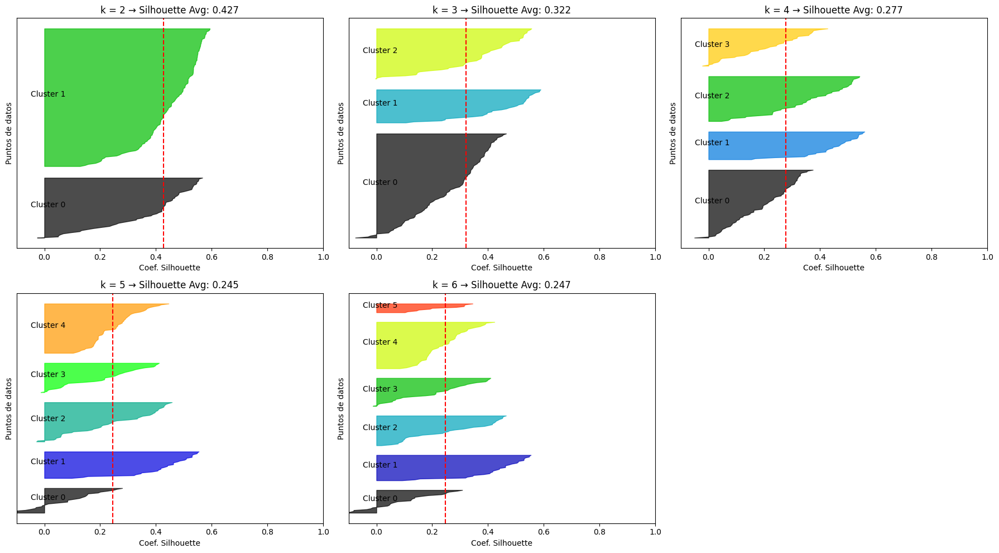

In [180]:
# Escalar los datos
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(df_X)

# Rango de k a probar
rango_k = range(2, 7)

# Crear subplots
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 10))
axes = axes.flatten()

for idx, k in enumerate(rango_k):
    ax = axes[idx]

    # KMeans
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(X_scaled)

    # Silhouette
    silhouette_avg = silhouette_score(X_scaled, labels)
    sample_silhouette_values = silhouette_samples(X_scaled, labels)

    y_lower = 10
    for i in range(k):
        ith_cluster_silhouette_values = sample_silhouette_values[labels == i]
        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / k)
        ax.fill_betweenx(np.arange(y_lower, y_upper),
                         0, ith_cluster_silhouette_values,
                         facecolor=color, edgecolor=color, alpha=0.7)
        ax.text(-0.05, y_lower + 0.5 * size_cluster_i, f"Cluster {i}")
        y_lower = y_upper + 10

    ax.axvline(x=silhouette_avg, color="red", linestyle="--")
    ax.set_title(f"k = {k} → Silhouette Avg: {silhouette_avg:.3f}")
    ax.set_xlabel("Coef. Silhouette")
    ax.set_ylabel("Puntos de datos")
    ax.set_xlim([-0.1, 1])
    ax.set_yticks([])

# Quitar gráfico vacío si hay
if len(rango_k) < len(axes):
    for i in range(len(rango_k), len(axes)):
        fig.delaxes(axes[i])

plt.tight_layout()
plt.show()

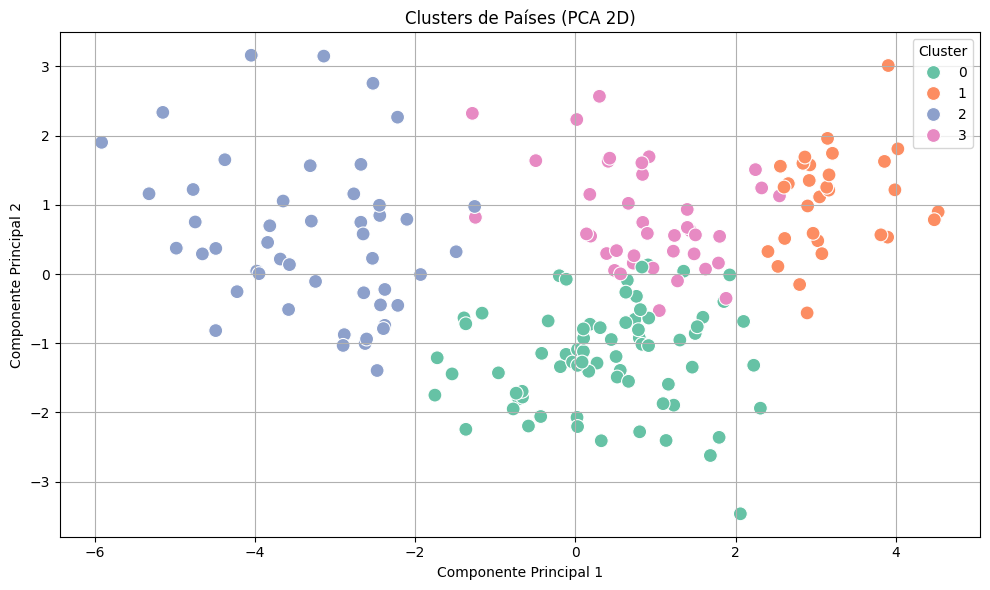

In [184]:
from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches

# 1. Pipeline final con StandardScaler + KMeans
mejor_scaler = StandardScaler()
mejor_k = 4
pipeline_final = Pipeline([
    ('scaler', mejor_scaler),
    ('kmeans', KMeans(n_clusters=mejor_k, random_state=42))
])
pipeline_final.fit(df_X)

# 2. Clusters y PCA
labels = pipeline_final.named_steps['kmeans'].labels_
X_scaled = pipeline_final.named_steps['scaler'].transform(df_X)
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# 3. Visualización del scatterplot SIN nombres
palette = sns.color_palette('Set2', n_colors=mejor_k)

plt.figure(figsize=(10, 6))
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=labels, palette=palette, s=100)
plt.title("Clusters de Países (PCA 2D)")
plt.xlabel("Componente Principal 1")
plt.ylabel("Componente Principal 2")
plt.legend(title="Cluster")
plt.grid(True)
plt.tight_layout()
plt.show()



In [183]:
from matplotlib.colors import rgb2hex

# 1. Crear el DataFrame de clusters
clusters_dict = {
    f'Cluster {c}': df_resultados[df_resultados['Cluster'] == c]['País'].reset_index(drop=True)
    for c in sorted(df_resultados['Cluster'].unique())
}
tabla_clusters = pd.DataFrame(clusters_dict)

# 2. Obtener colores y convertir a HEX
palette = sns.color_palette('Set2', n_colors=tabla_clusters.shape[1])
colores_hex = [rgb2hex(color) for color in palette]

# 3. Estilos para cada cabecera con letra negra y fuente Calibri
estilos_cabecera = [
    {
        'selector': f'th.col{i}',
        'props': [
            ('background-color', colores_hex[i]),
            ('color', 'black'),
            ('text-align', 'center'),
            ('font-family', 'Calibri'),
            ('font-weight', 'bold')
        ]
    }
    for i in range(tabla_clusters.shape[1])
]

# 4. Mostrar tabla con estilos generales y personalizados
tabla_clusters.style.set_properties(**{
    'text-align': 'left',
    'border': '1px solid #ddd',
    'background-color': '#f9f9f9',
    'color': 'black',
    'font-family': 'Calibri'
}).set_table_styles(estilos_cabecera)



,Cluster 0,Cluster 1,Cluster 2,Cluster 3,Cluster 4
0,Algeria,Andorra,Afghanistan,Albania,Azerbaijan
1,American Samoa,Australia,Angola,Argentina,Bahrain
2,Antigua and Barbuda,Austria,Benin,Barbados,Bangladesh
3,Bahamas,Belgium,Burkina Faso,Belarus,Bhutan
4,Belize,Bermuda,Burundi,Bosnia and Herzegovina,Cambodia
5,"Bolivia, Plurinational State of",Canada,Cameroon,Bulgaria,China
6,Botswana,Cayman Islands,Central African Republic,Croatia,Dominican Republic
7,Brazil,Denmark,Comoros,Cuba,Ecuador
8,Brunei Darussalam,Faroe Islands,Congo,Curaçao,Egypt
9,Cabo Verde,Finland,"Congo, The Democratic Republic of the",Cyprus,Guatemala


In [185]:
# 1. Obtenemos los clusters finales usando el pipeline
df_pais_clusterizado = df_pais.copy()
df_pais_clusterizado['Cluster'] = pipeline_final.named_steps['kmeans'].labels_

# 2. Calculamos estadísticas promedio por cluster
resumen_cluster = df_pais_clusterizado.groupby('Cluster').mean().round(2)

# 3. Transponemos para mejor lectura (opcional)
resumen_cluster.T


Cluster,0,1,2,3
indicador,,,,
Crecimiento del PIB (%),3.88,1.99,3.99,2.62
PIB per cápita,9688.84,59017.31,1269.35,10272.75
Mortalidad infantil,22.74,4.34,90.20,14.97
Tasa de vacunación infantil (Sarampión),91.11,92.56,71.14,91.55
(%) de Pobalacion con Baño,83.12,98.22,30.81,89.01
Gasto en salud (% del PIB),5.08,8.85,5.36,7.85
Gasto en salud per cápita,449.45,4823.29,62.37,756.33
Desempleo total (%),6.77,6.01,8.18,12.07
Tasa de natalidad,19.75,11.11,36.59,13.55


In [200]:
df_pais_clusterizado=df_pais_clusterizado.reset_index()
df_pais_clusterizado

indicador,index,Pais,Crecimiento del PIB (%),PIB per cápita,Mortalidad infantil,Tasa de vacunación infantil (Sarampión),(%) de Pobalacion con Baño,Gasto en salud (% del PIB),Gasto en salud per cápita,Desempleo total (%),Tasa de natalidad,Tasa de mortalidad,Esperanza de vida al nacer,Cluster
0,0,Afghanistan,4.54,415.58,88.79,54.04,37.42,11.08,49.92,9.33,41.29,8.54,60.50,2
1,1,Albania,4.25,4091.25,14.50,94.88,95.33,6.29,239.92,14.58,12.33,7.50,77.50,3
2,2,Algeria,3.04,4210.96,29.04,87.67,86.17,5.08,202.08,14.46,22.75,4.79,73.83,0
3,3,American Samoa,-0.43,11596.00,14.10,92.39,60.13,6.29,719.41,10.10,17.41,5.09,74.28,0
4,4,Andorra,1.92,40040.38,4.62,97.17,100.00,6.67,2696.42,7.21,9.83,3.83,81.64,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
185,185,Viet Nam,6.29,2019.08,23.58,94.46,71.17,4.62,90.08,1.79,16.79,6.21,73.62,0
186,186,"Virgin Islands, U.S.",-0.54,37832.67,5.57,92.83,99.00,7.87,2997.16,11.92,13.58,7.08,78.50,1
187,187,Yemen,0.96,838.33,59.17,62.58,50.21,5.21,53.96,14.50,35.29,6.46,65.67,2
188,188,Zambia,5.46,1143.79,87.25,88.50,28.92,5.04,55.46,9.38,40.42,9.92,56.17,2


In [201]:
df_Pais_clusterizado_ordenado = df_pais_clusterizado.groupby('Cluster').median(numeric_only=True).reset_index()
df_Pais_clusterizado_ordenado


indicador,Cluster,index,Crecimiento del PIB (%),PIB per cápita,Mortalidad infantil,Tasa de vacunación infantil (Sarampión),(%) de Pobalacion con Baño,Gasto en salud (% del PIB),Gasto en salud per cápita,Desempleo total (%),Tasa de natalidad,Tasa de mortalidad,Esperanza de vida al nacer
0,0,96.0,3.67,4925.330,19.290,93.430,86.170,4.83,257.620,6.210,20.25,5.96,73.120
1,1,81.0,1.92,48103.375,4.335,92.855,99.230,8.96,4507.585,5.425,11.08,8.10,80.955
2,2,95.5,3.96,1033.665,84.085,69.500,30.895,4.81,46.275,4.790,36.75,9.71,58.395
3,3,106.0,2.54,8132.330,10.620,93.460,93.170,7.17,627.580,10.040,11.08,10.29,74.080


In [207]:
etiquetas_cluster = {
    1: "🌟 Líderes en esperanza de vida",
    3: "🚀 Progreso sostenido",
    0: "🔄 Transición sanitaria y social",
    2: "⚠️ Desafíos críticos en salud"
}

df_pais_clusterizado['Etiqueta'] = df_pais_clusterizado['Cluster'].map(etiquetas_cluster)
df_pais_clusterizado

indicador,index,Pais,Crecimiento del PIB (%),PIB per cápita,Mortalidad infantil,Tasa de vacunación infantil (Sarampión),(%) de Pobalacion con Baño,Gasto en salud (% del PIB),Gasto en salud per cápita,Desempleo total (%),Tasa de natalidad,Tasa de mortalidad,Esperanza de vida al nacer,Cluster,Etiqueta
0,0,Afghanistan,4.54,415.58,88.79,54.04,37.42,11.08,49.92,9.33,41.29,8.54,60.50,2,⚠️ Desafíos críticos en salud
1,1,Albania,4.25,4091.25,14.50,94.88,95.33,6.29,239.92,14.58,12.33,7.50,77.50,3,🚀 Progreso sostenido
2,2,Algeria,3.04,4210.96,29.04,87.67,86.17,5.08,202.08,14.46,22.75,4.79,73.83,0,🔄 Transición sanitaria y social
3,3,American Samoa,-0.43,11596.00,14.10,92.39,60.13,6.29,719.41,10.10,17.41,5.09,74.28,0,🔄 Transición sanitaria y social
4,4,Andorra,1.92,40040.38,4.62,97.17,100.00,6.67,2696.42,7.21,9.83,3.83,81.64,1,🌟 Líderes en esperanza de vida
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
185,185,Viet Nam,6.29,2019.08,23.58,94.46,71.17,4.62,90.08,1.79,16.79,6.21,73.62,0,🔄 Transición sanitaria y social
186,186,"Virgin Islands, U.S.",-0.54,37832.67,5.57,92.83,99.00,7.87,2997.16,11.92,13.58,7.08,78.50,1,🌟 Líderes en esperanza de vida
187,187,Yemen,0.96,838.33,59.17,62.58,50.21,5.21,53.96,14.50,35.29,6.46,65.67,2,⚠️ Desafíos críticos en salud
188,188,Zambia,5.46,1143.79,87.25,88.50,28.92,5.04,55.46,9.38,40.42,9.92,56.17,2,⚠️ Desafíos críticos en salud


In [211]:
import plotly.express as px

fig = px.choropleth(
    df_pais_clusterizado,
    locations="Pais",  # debe tener nombres como 'Argentina', 'Brazil', etc.
    locationmode="country names",
    color="Etiqueta",
    color_discrete_sequence=px.colors.qualitative.Set2,
    title="Mapa de Clusters de Países según Esperanza de Vida"
)
fig.show()

# //////////////////////////////////////////////////////////////////

## Prueba de normalización de datos con Z-Score

### 🔹 Resumen de transformaciones:

### Logaritmo (log1p(x)) → Para sesgo a la derecha.
### Logaritmo invertido (log1p(max - x)) → Para sesgo a la izquierda.
### Estandarización (Z-score) → Para mantener la normalidad.
### Esto asegura que todas las variables tengan escalas comparables sin distorsionar demasiado sus distribuciones. 🚀

In [ ]:
df_transformed_Z_score = df_imputed_scaled.copy()  # Copia del DataFrame original

# Identificar variables con sesgo a la derecha y a la izquierda
variables_sesgo_derecha =  [ 'PIB per cápita', 'Mortalidad infantil', 'Gasto en salud (% del PIB)',
                     'Gasto en salud per cápita', 'Desempleo total (%)', 'Tasa de natalidad', 'Tasa de mortalidad']
variables_sesgo_izquierda =  ['Tasa de vacunación infantil (Sarampión)', '(%) de Pobalacion con Baño']
variables_normales = ['Crecimiento del PIB (%)',"Esperanza de vida al nacer"]
# Aplicar transformaciones
df_transformed_Z_score [variables_sesgo_derecha] = np.log1p(df_transformed_Z_score [variables_sesgo_derecha])
df_transformed_Z_score [variables_sesgo_izquierda] = np.log1p(df_transformed_Z_score [variables_sesgo_izquierda].max() - df_transformed_Z_score [variables_sesgo_izquierda])
df_transformed_Z_score [variables_normales] = StandardScaler().fit_transform(df_transformed_Z_score [variables_normales])

df_transformed_Z_score

/usr/local/lib/python3.11/dist-packages/pandas/core/internals/blocks.py:393: RuntimeWarning: invalid value encountered in log1p
  result = func(self.values, **kwargs)


indicador,Pais,Año,Crecimiento del PIB (%),PIB per cápita,Mortalidad infantil,Tasa de vacunación infantil (Sarampión),(%) de Pobalacion con Baño,Gasto en salud (% del PIB),Gasto en salud per cápita,Desempleo total (%),Tasa de natalidad,Tasa de mortalidad,Esperanza de vida al nacer,Grupo Esperanza de Vida,Grupo Natalidad,Grupo PIB per cápita,Grupo PBI Salud per capita
0,Afghanistan,2000,-0.063928,-0.937048,1.243023,1.795596,1.314738,0.843647,-0.836623,-0.014599,1.293420,0.788221,-1.762947,Baja,Alta,Baja,Baja
1,Afghanistan,2001,-2.286305,-0.940698,1.205538,1.672490,1.314738,0.843647,-0.836623,-0.014599,1.267745,0.788221,-1.649826,Baja,Alta,Baja,Baja
2,Afghanistan,2002,4.751223,-0.936643,1.174505,1.698354,1.296046,0.675752,-0.881832,-0.014599,1.241393,0.633732,-1.649826,Baja,Alta,Baja,Baja
3,Afghanistan,2003,1.047261,-0.934622,1.134307,1.645940,1.286568,0.675752,-0.880531,-0.014599,1.214328,0.633732,-1.536704,Baja,Alta,Baja,Baja
4,Afghanistan,2004,-0.434324,-0.932303,1.100944,1.516884,1.267337,0.843647,-0.876635,-0.014599,1.186509,0.450937,-1.423582,Baja,Alta,Baja,Baja
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4551,Zimbabwe,2019,-1.730711,-0.794920,0.354698,0.681432,1.165212,NaN,-0.833515,-0.203279,0.684113,-0.061785,-1.084217,Baja,Alta,Baja,Baja
4552,Zimbabwe,2020,-2.101107,-0.790889,0.336648,0.681432,1.175907,NaN,-0.838492,0.144068,0.636372,-0.061785,-1.084217,Baja,Alta,Baja,Baja
4553,Zimbabwe,2021,0.862063,-0.791414,0.299540,0.569516,1.175907,NaN,-0.823634,0.280973,0.636372,0.227083,-1.310460,Baja,Alta,Baja,Baja
4554,Zimbabwe,2022,0.491667,-0.764056,0.280457,0.487280,1.175907,0.220635,-0.785057,0.280973,0.586237,0.227083,-1.310460,Baja,Alta,Baja,Baja


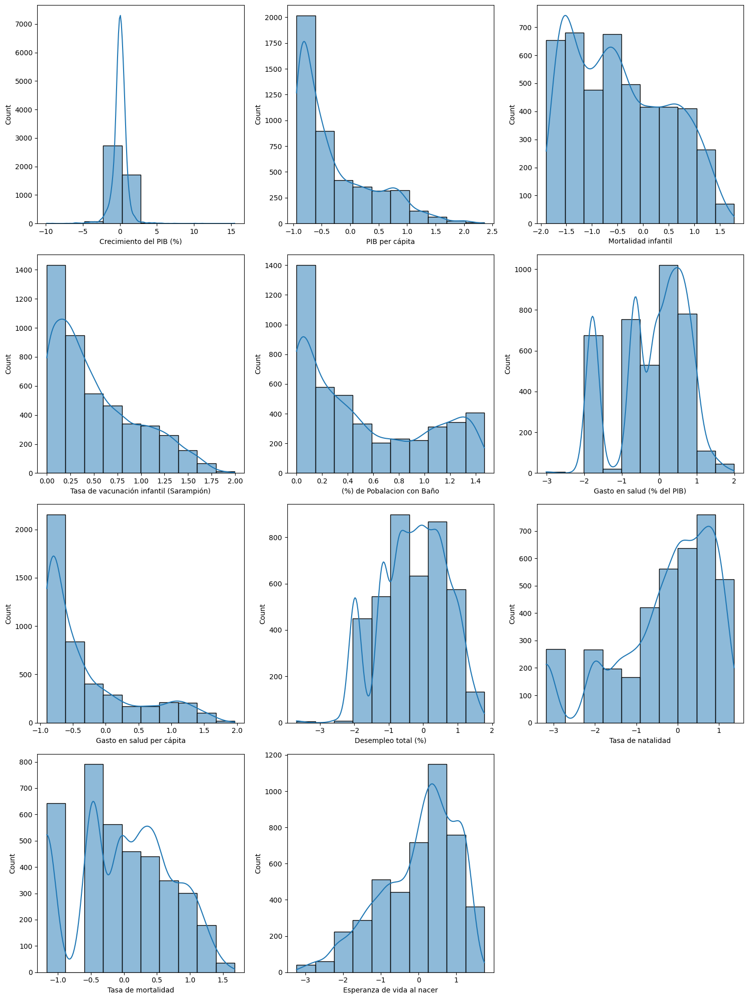

In [ ]:

# Elimino la advertencias de tipo FutureWarning
warnings.simplefilter(action='ignore', category=FutureWarning)

variables = ['Crecimiento del PIB (%)', 'PIB per cápita', 'Mortalidad infantil', 'Tasa de vacunación infantil (Sarampión)','(%) de Pobalacion con Baño',
             'Gasto en salud (% del PIB)', 'Gasto en salud per cápita','Desempleo total (%)','Tasa de natalidad','Tasa de mortalidad','Esperanza de vida al nacer']

num_vars = len(variables)
rows = math.ceil(num_vars / 3)  # Calcula filas necesarias
cols = min(3, num_vars)  # Máximo 3 columnas

plt.figure(figsize=(15, 5 * rows))
for i, var in enumerate(variables, 1):
    plt.subplot(rows, cols, i)
    sns.histplot(df_transformed_Z_score[var], kde=True, bins=10)

plt.tight_layout()
plt.show()

## Coversión de variables categoricas a Ordinales:

In [ ]:
df_transformed_Z_score.dtypes

,0
indicador,
Pais,object
Año,int64
Crecimiento del PIB (%),float64
PIB per cápita,float64
Mortalidad infantil,float64
Tasa de vacunación infantil (Sarampión),float64
(%) de Pobalacion con Baño,float64
Gasto en salud (% del PIB),float64
Gasto en salud per cápita,float64


In [ ]:
Esperanza_de_vida1 = df_transformed_Z_score.copy()

# Calcular los cuartiles de la esperanza de vida
q1 = Esperanza_de_vida1['Esperanza de vida al nacer'].quantile(0.25)
q3 = Esperanza_de_vida1['Esperanza de vida al nacer'].quantile(0.75)

# Definir las categorías basadas en los cuartiles
def categorize_life_expectancy(value):
    if value <= q1:
        return 'Baja'
    elif value <= q3:
        return 'Media'
    else:
        return 'Alta'

# Aplicar la función para crear la nueva columna 'Life_Expectancy_Category'
Esperanza_de_vida1['Esperanza_Categoria'] = Esperanza_de_vida1['Esperanza de vida al nacer'].apply(categorize_life_expectancy)

# Mostrar la distribución de las categorías
print(Esperanza_de_vida1['Esperanza_Categoria'].value_counts())

Esperanza_Categoria
Media    2197
Baja     1236
Alta     1123
Name: count, dtype: int64


In [ ]:
Esperanza_de_vida1.dtypes

,0
indicador,
Pais,object
Año,int64
Crecimiento del PIB (%),float64
PIB per cápita,float64
Mortalidad infantil,float64
Tasa de vacunación infantil (Sarampión),float64
(%) de Pobalacion con Baño,float64
Gasto en salud (% del PIB),float64
Gasto en salud per cápita,float64


In [ ]:
from sklearn.preprocessing import LabelEncoder
esperanza_de_Vida = Esperanza_de_vida1.copy()
# Codificar la variable objetivo
encoder = LabelEncoder()
esperanza_de_Vida['Grupo_Esperanza_Enc'] = encoder.fit_transform(esperanza_de_Vida['Esperanza_Categoria'])

# Ver los valores asignados
print(dict(zip(encoder.classes_, encoder.transform(encoder.classes_))))


{'Alta': 0, 'Baja': 1, 'Media': 2}


In [ ]:
esperanza_de_Vida

indicador,Pais,Año,Crecimiento del PIB (%),PIB per cápita,Mortalidad infantil,Tasa de vacunación infantil (Sarampión),(%) de Pobalacion con Baño,Gasto en salud (% del PIB),Gasto en salud per cápita,Desempleo total (%),Tasa de natalidad,Tasa de mortalidad,Esperanza de vida al nacer,Grupo Esperanza de Vida,Grupo Natalidad,Grupo PIB per cápita,Grupo PBI Salud per capita,Esperanza_Categoria,Grupo_Esperanza_Enc
0,Afghanistan,2000,-0.063928,-0.937048,1.243023,1.795596,1.314738,0.843647,-0.836623,-0.014599,1.293420,0.788221,-1.762947,Baja,Alta,Baja,Baja,Baja,1
1,Afghanistan,2001,-2.286305,-0.940698,1.205538,1.672490,1.314738,0.843647,-0.836623,-0.014599,1.267745,0.788221,-1.649826,Baja,Alta,Baja,Baja,Baja,1
2,Afghanistan,2002,4.751223,-0.936643,1.174505,1.698354,1.296046,0.675752,-0.881832,-0.014599,1.241393,0.633732,-1.649826,Baja,Alta,Baja,Baja,Baja,1
3,Afghanistan,2003,1.047261,-0.934622,1.134307,1.645940,1.286568,0.675752,-0.880531,-0.014599,1.214328,0.633732,-1.536704,Baja,Alta,Baja,Baja,Baja,1
4,Afghanistan,2004,-0.434324,-0.932303,1.100944,1.516884,1.267337,0.843647,-0.876635,-0.014599,1.186509,0.450937,-1.423582,Baja,Alta,Baja,Baja,Baja,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4551,Zimbabwe,2019,-1.730711,-0.794920,0.354698,0.681432,1.165212,NaN,-0.833515,-0.203279,0.684113,-0.061785,-1.084217,Baja,Alta,Baja,Baja,Baja,1
4552,Zimbabwe,2020,-2.101107,-0.790889,0.336648,0.681432,1.175907,NaN,-0.838492,0.144068,0.636372,-0.061785,-1.084217,Baja,Alta,Baja,Baja,Baja,1
4553,Zimbabwe,2021,0.862063,-0.791414,0.299540,0.569516,1.175907,NaN,-0.823634,0.280973,0.636372,0.227083,-1.310460,Baja,Alta,Baja,Baja,Baja,1
4554,Zimbabwe,2022,0.491667,-0.764056,0.280457,0.487280,1.175907,0.220635,-0.785057,0.280973,0.586237,0.227083,-1.310460,Baja,Alta,Baja,Baja,Baja,1


## **Prueba de normalización de datos con Logaritmos:**
### Este código crea una copia del DataFrame original y aplica las siguientes transformaciones:

### Para las variables con asimetría a la izquierda: se aplica un reflejo (restando el valor máximo) y luego logaritmo para hacer la distribución más simétrica.
### Para las variables con asimetría a la derecha: se usa np.log1p(x) que equivale a log(1 + x), evitando problemas con valores cercanos a 0.

In [ ]:
# Copiar el DataFrame original
transformed_df = df_imputed_scaled.copy()

# Definir las variables y su tipo de asimetría
variables = ['PIB per cápita', 'Mortalidad infantil', 'Tasa de vacunación infantil (Sarampión)',
             '(%) de Pobalacion con Baño', 'Gasto en salud (% del PIB)', 'Gasto en salud per cápita',
             'Desempleo total (%)', 'Tasa de natalidad', 'Tasa de mortalidad', 'Esperanza de vida al nacer']

asimetria_izquierda = ['Tasa de vacunación infantil (Sarampión)', '(%) de Pobalacion con Baño']
asimetria_derecha = ['Crecimiento del PIB (%)', 'PIB per cápita', 'Mortalidad infantil', 'Gasto en salud (% del PIB)',
                     'Gasto en salud per cápita', 'Desempleo total (%)', 'Tasa de natalidad', 'Tasa de mortalidad',
                     'Esperanza de vida al nacer']

# Aplicar transformación
for col in variables:
    if col in asimetria_izquierda:
        max_value = transformed_df[col].max()
        transformed_df[col] = np.log(max_value - transformed_df[col] + 1)  # Reflejo + Logaritmo
    elif col in asimetria_derecha:
        transformed_df[col] = np.log1p(transformed_df[col])  # Logaritmo natural (log(1 + x)) para evitar problemas con ceros

# Mostrar el DataFrame transformado
transformed_df.head()


/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


indicador,Pais,Año,Crecimiento del PIB (%),PIB per cápita,Mortalidad infantil,Tasa de vacunación infantil (Sarampión),(%) de Pobalacion con Baño,Gasto en salud (% del PIB),Gasto en salud per cápita,Desempleo total (%),Tasa de natalidad,Tasa de mortalidad,Esperanza de vida al nacer,Grupo Esperanza de Vida,Grupo Natalidad,Grupo PIB per cápita,Grupo PBI Salud per capita
0,Afghanistan,2000,-0.063928,-0.937048,1.243023,1.795596,1.314738,0.843647,-0.836623,-0.014599,1.293420,0.788221,NaN,Baja,Alta,Baja,Baja
1,Afghanistan,2001,-2.286305,-0.940698,1.205538,1.672490,1.314738,0.843647,-0.836623,-0.014599,1.267745,0.788221,NaN,Baja,Alta,Baja,Baja
2,Afghanistan,2002,4.751223,-0.936643,1.174505,1.698354,1.296046,0.675752,-0.881832,-0.014599,1.241393,0.633732,NaN,Baja,Alta,Baja,Baja
3,Afghanistan,2003,1.047261,-0.934622,1.134307,1.645940,1.286568,0.675752,-0.880531,-0.014599,1.214328,0.633732,NaN,Baja,Alta,Baja,Baja
4,Afghanistan,2004,-0.434324,-0.932303,1.100944,1.516884,1.267337,0.843647,-0.876635,-0.014599,1.186509,0.450937,NaN,Baja,Alta,Baja,Baja


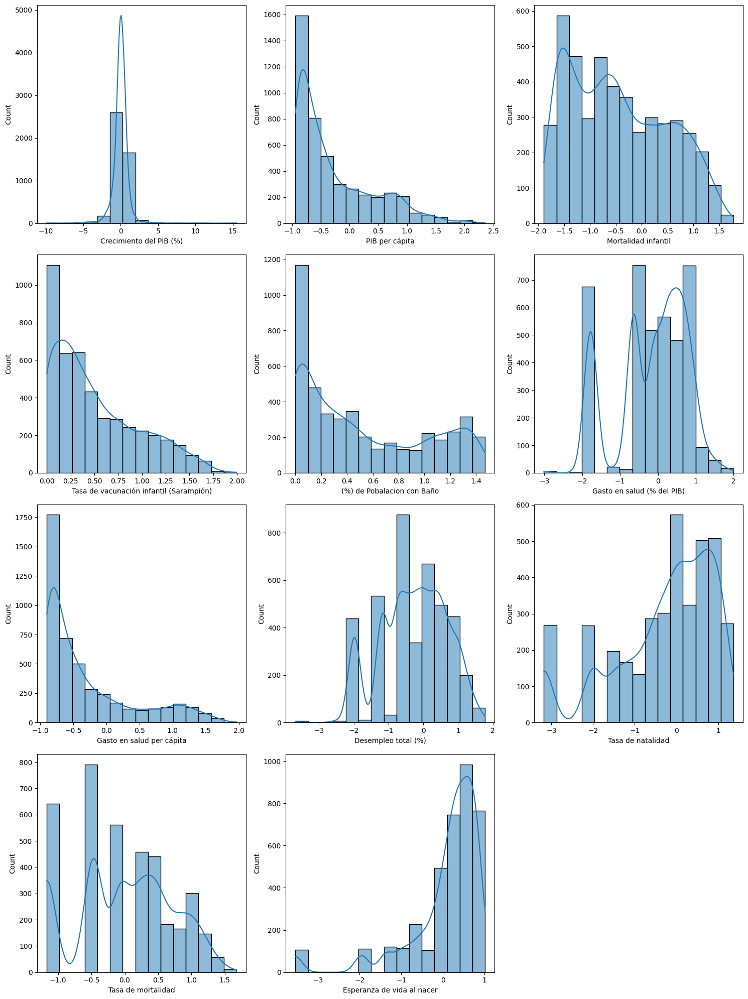

In [ ]:

# Elimino la advertencias de tipo FutureWarning
warnings.simplefilter(action='ignore', category=FutureWarning)

variables = ['Crecimiento del PIB (%)', 'PIB per cápita', 'Mortalidad infantil', 'Tasa de vacunación infantil (Sarampión)','(%) de Pobalacion con Baño',
             'Gasto en salud (% del PIB)', 'Gasto en salud per cápita','Desempleo total (%)','Tasa de natalidad','Tasa de mortalidad','Esperanza de vida al nacer']

num_vars = len(variables)
rows = math.ceil(num_vars / 3)  # Calcula filas necesarias
cols = min(3, num_vars)  # Máximo 3 columnas

plt.figure(figsize=(15, 5 * rows))
for i, var in enumerate(variables, 1):
    plt.subplot(rows, cols, i)
    sns.histplot(transformed_df[var], kde=True, bins=15)

plt.tight_layout()
plt.show()

## **Normalización de las variables**

### Se prueban distintos metodos de Normalización para visualizar su comportamiento.

## **1️⃣ Robust Scaling (Escalado Robusto)**
### ✅ Usa la mediana y el IQR en vez de la media y desviación estándar
### ✅ Resistente a outliers extremos

### 📌 Útil si los datos tienen outliers fuertes y no siguen distribución normal.

In [ ]:
from sklearn.preprocessing import RobustScaler
columns_to_scale= ['Crecimiento del PIB (%)', 'PIB per cápita', 'Mortalidad infantil', 'Tasa de vacunación infantil (Sarampión)','(%) de Pobalacion con Baño',
             'Gasto en salud (% del PIB)', 'Gasto en salud per cápita','Desempleo total (%)','Tasa de natalidad','Tasa de mortalidad','Esperanza de vida al nacer']

scaler = RobustScaler()
df_robust = df_imputed_scaled.copy()
df_robust[columns_to_scale] = scaler.fit_transform(df_imputed[columns_to_scale])

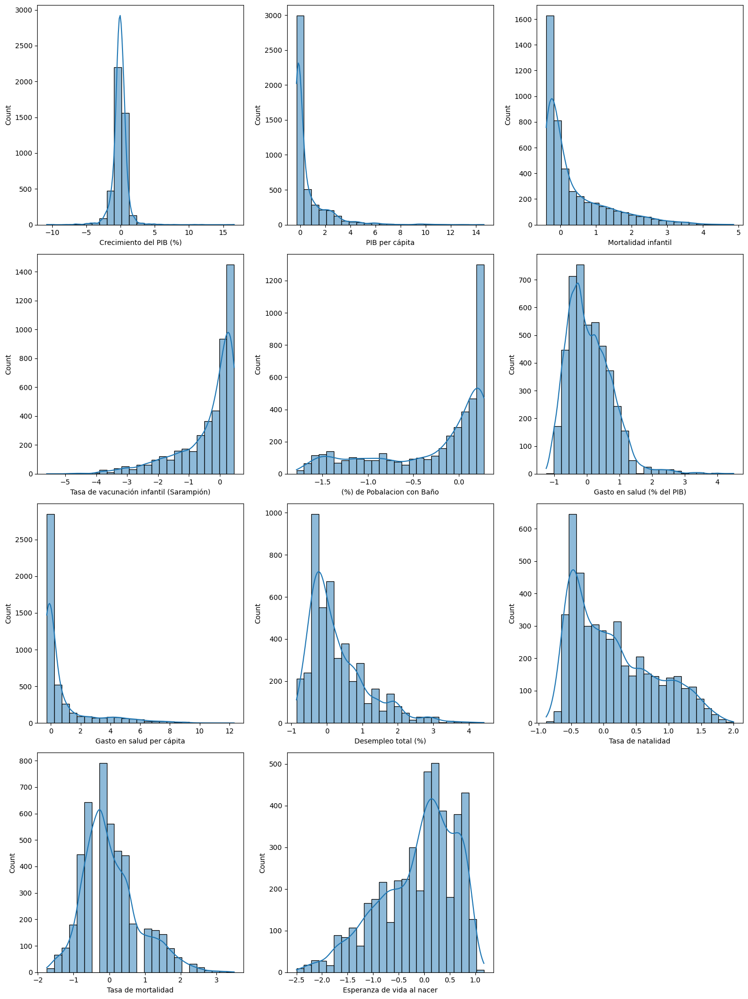

In [ ]:
# Elimino la advertencias de tipo FutureWarning
warnings.simplefilter(action='ignore', category=FutureWarning)

variables = ['Crecimiento del PIB (%)', 'PIB per cápita', 'Mortalidad infantil', 'Tasa de vacunación infantil (Sarampión)','(%) de Pobalacion con Baño',
             'Gasto en salud (% del PIB)', 'Gasto en salud per cápita','Desempleo total (%)','Tasa de natalidad','Tasa de mortalidad','Esperanza de vida al nacer']

num_vars = len(variables)
rows = math.ceil(num_vars / 3)  # Calcula filas necesarias
cols = min(3, num_vars)  # Máximo 3 columnas

plt.figure(figsize=(15, 5 * rows))
for i, var in enumerate(variables, 1):
    plt.subplot(rows, cols, i)
    sns.histplot(df_robust[var], kde=True, bins=25)

plt.tight_layout()
plt.show()

In [ ]:
!pip install geopandas

In [ ]:
!pip install pycountry

In [ ]:
!pip install folium

In [ ]:
!pip install geodatasets
